# ROI 2100

In [1]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2100"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2100)
        
        
    

In [2]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2100/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2100/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




Using TensorFlow backend.


Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 621us/step - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0711 - val_mean_squared_error: 0.0711
Epoch 2/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 3/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0557 - mean_squared_error: 0.0557 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 4/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0496 - mean_squared_error: 0.0496 - val_loss: 0.0437 - val_mean_squared_error: 0.0437
Epoch 5/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0392 - val_mean_squared_error: 0.0392
Epoch 6/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0403 - mean_squared_error: 0.04

3600/3600 [==============================] - 1s 354us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0134 - val_mean_squared_error: 0.0134
Epoch 50/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0139 - val_mean_squared_error: 0.0139
Epoch 51/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 52/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0136 - val_mean_squared_error: 0.0136
Epoch 53/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0137 - val_mean_squared_error: 0.0137
Epoch 54/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0135 - val_mean_squared_error: 0.0135


3600/3600 [==============================] - 1s 358us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 98/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0087 - val_mean_squared_error: 0.0087
Epoch 99/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 100/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 101/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 102/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0089 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 353us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 146/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 147/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 148/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 149/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 150/2000
3600/3600 [==============================] - 1s 382us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0057 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 355us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 194/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 195/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 196/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 197/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 198/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0059 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 351us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 242/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 243/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 244/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 245/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 246/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0047 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 358us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 290/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 291/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 292/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 293/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 294/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0042 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 353us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 338/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 339/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 340/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 341/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 342/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0047 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 350us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 386/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 387/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 388/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 389/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 390/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0035 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 343us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 434/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 435/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 436/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 437/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 438/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 358us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 482/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 483/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 484/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 485/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 486/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0029 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 351us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 530/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 531/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 532/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 533/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 534/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0035 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 355us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 578/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 579/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 580/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 581/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 582/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 364us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 626/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 627/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 628/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 629/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 630/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0026 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 351us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 674/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 675/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 676/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 677/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 678/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 347us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 722/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 723/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 724/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 725/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 726/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0032 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 351us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 770/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 771/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 772/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 773/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 774/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 352us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 818/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 819/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 820/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 821/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 822/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 358us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 866/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 867/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 868/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 869/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 870/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 349us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 914/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 915/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 916/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 917/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 918/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 346us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 962/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 963/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 964/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 965/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 966/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 354us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1010/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1011/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1012/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1013/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1014/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 347us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1058/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1059/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1060/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1061/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1062/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 342us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1106/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1107/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1108/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1109/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1110/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 345us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1154/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1155/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1156/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1157/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1158/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 354us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1202/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1203/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1204/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1205/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1206/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1250/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1251/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1252/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1253/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1254/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 346us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1298/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1299/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1300/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1301/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1302/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 347us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1346/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1347/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1348/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1349/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1350/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 350us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1394/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1395/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1396/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1397/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1398/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 350us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1442/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1443/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1444/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1445/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1446/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 343us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1490/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1491/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1492/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1493/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1494/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 351us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1538/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1539/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1540/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1541/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1542/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 346us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1586/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1587/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1588/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1589/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1590/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 348us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1634/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1635/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1636/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1637/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1638/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 351us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1682/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1683/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1684/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1685/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1686/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 351us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1730/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1731/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1732/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1733/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1734/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 349us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1778/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1779/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1780/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1781/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1782/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 341us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1826/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1827/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1828/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1829/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1830/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 347us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1874/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1875/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1876/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1877/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1878/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 347us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1922/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1923/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1924/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1925/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1926/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 351us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1970/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1971/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1972/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1973/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1974/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0019 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model


(500, 9)


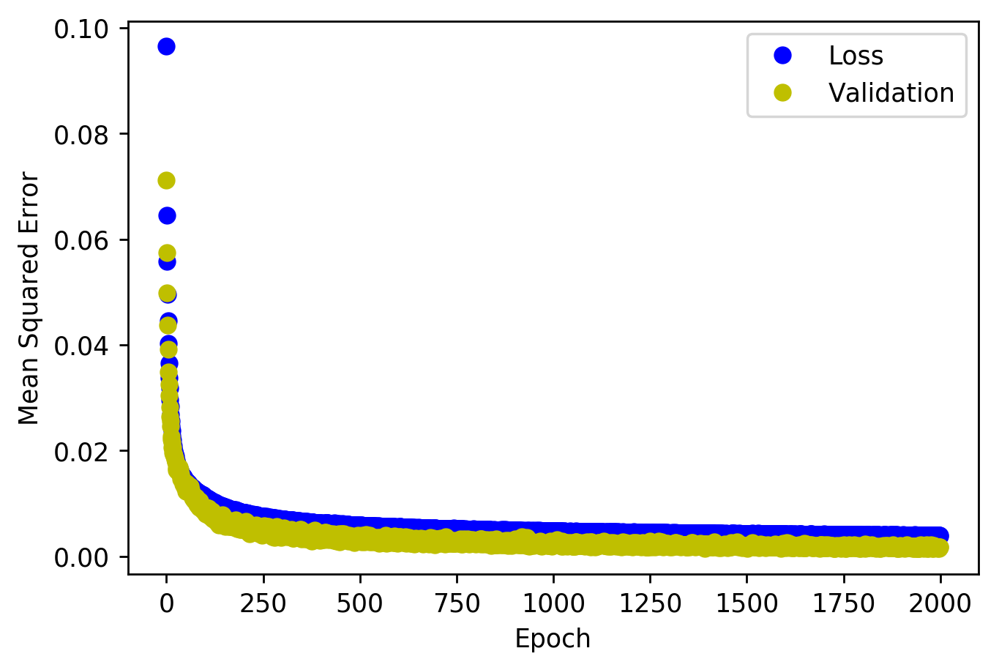

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


<Figure size 432x288 with 0 Axes>

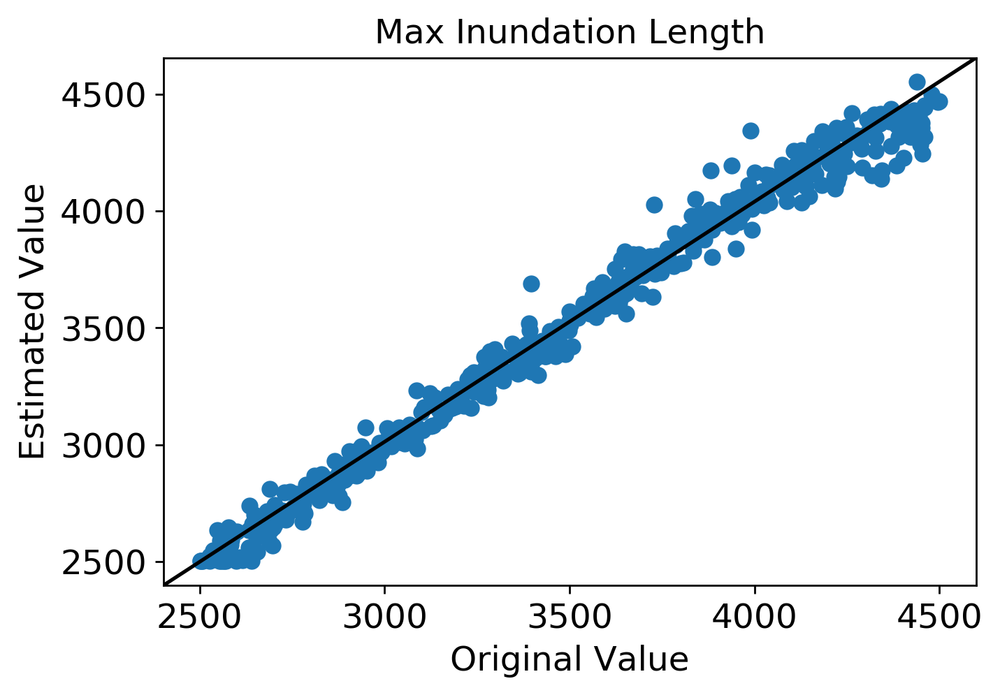

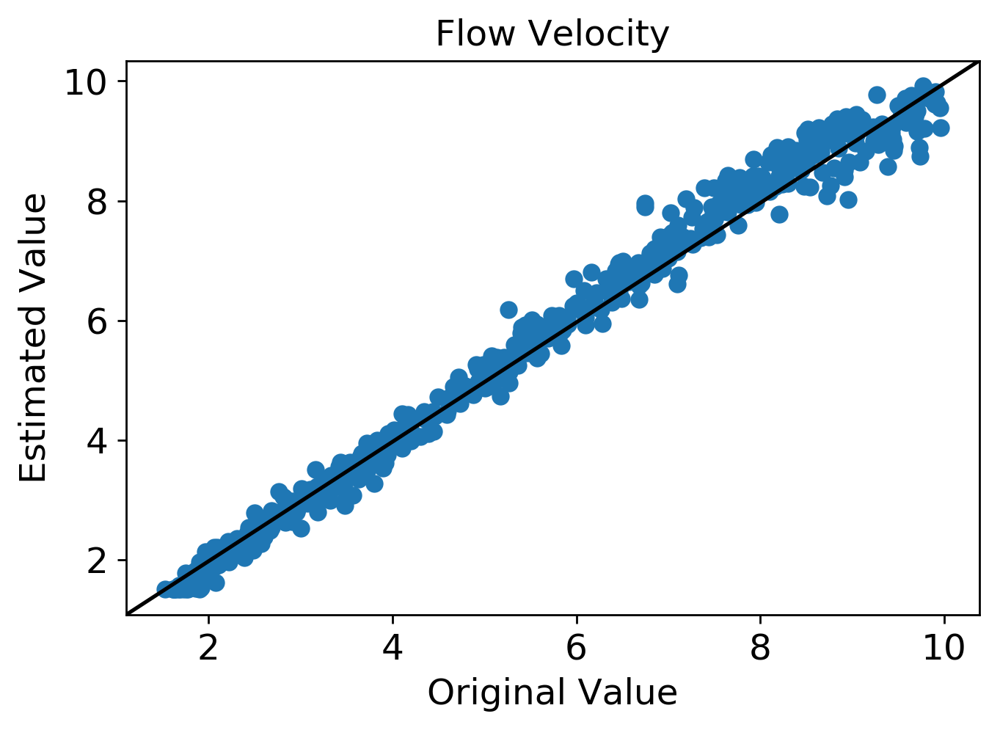

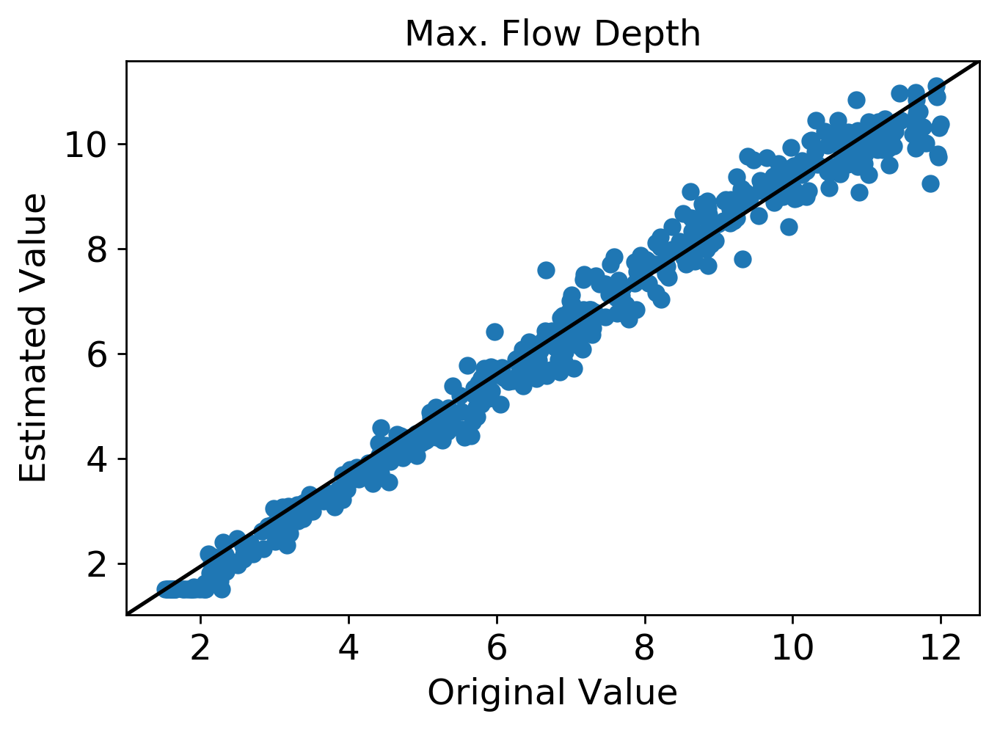

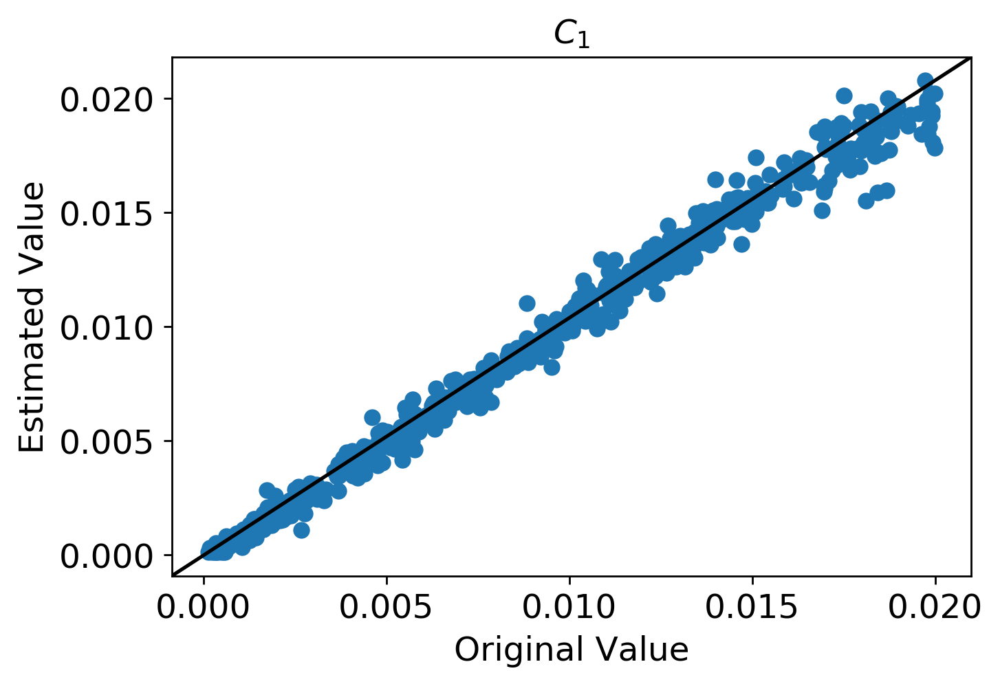

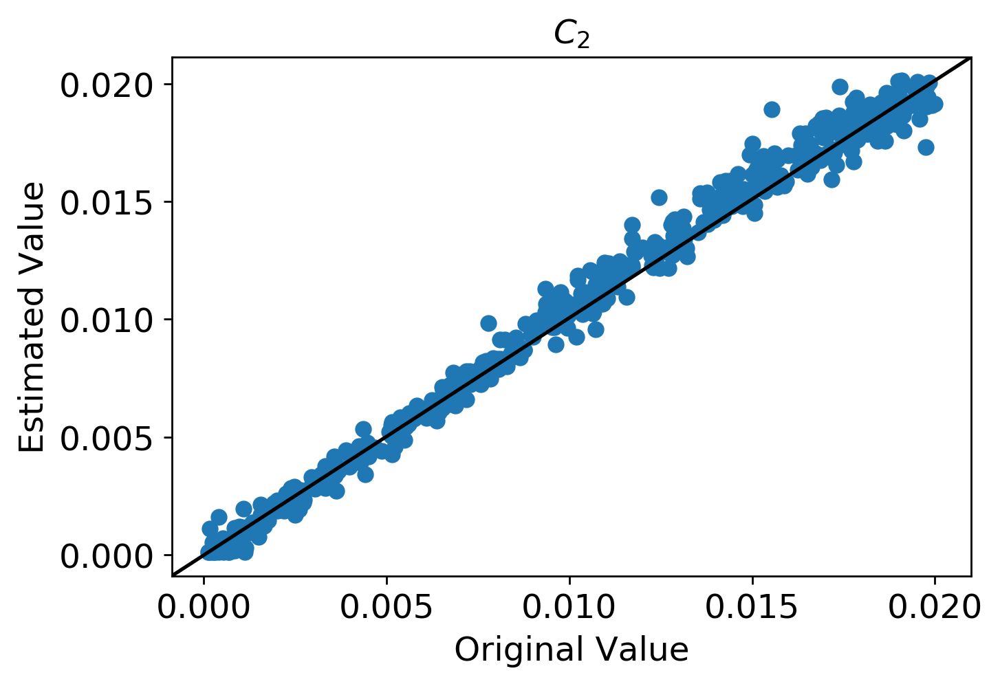

...

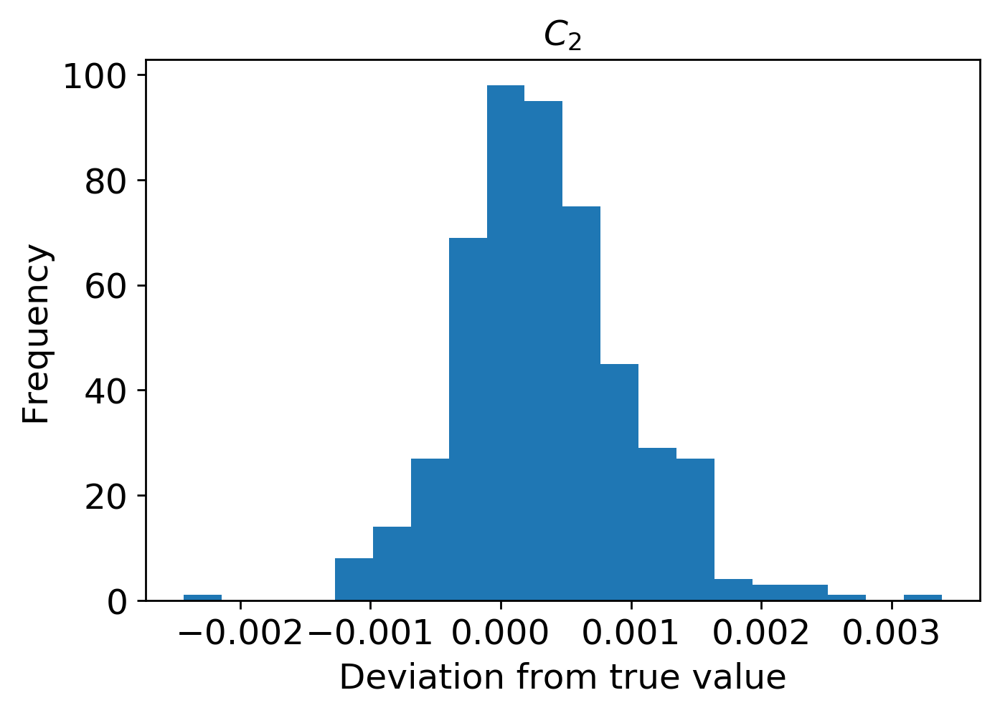

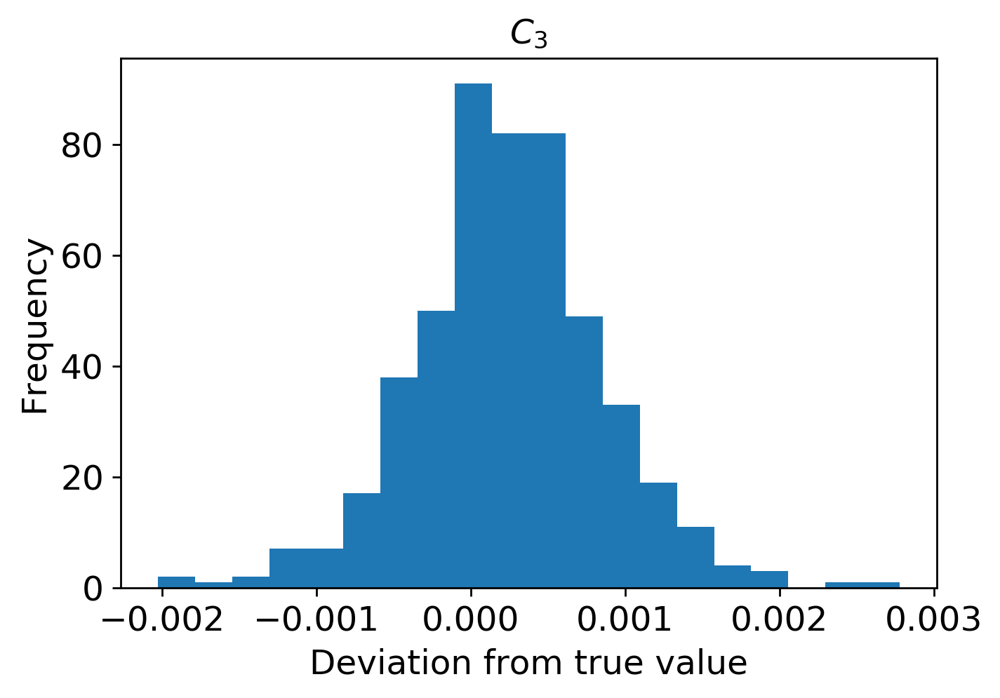

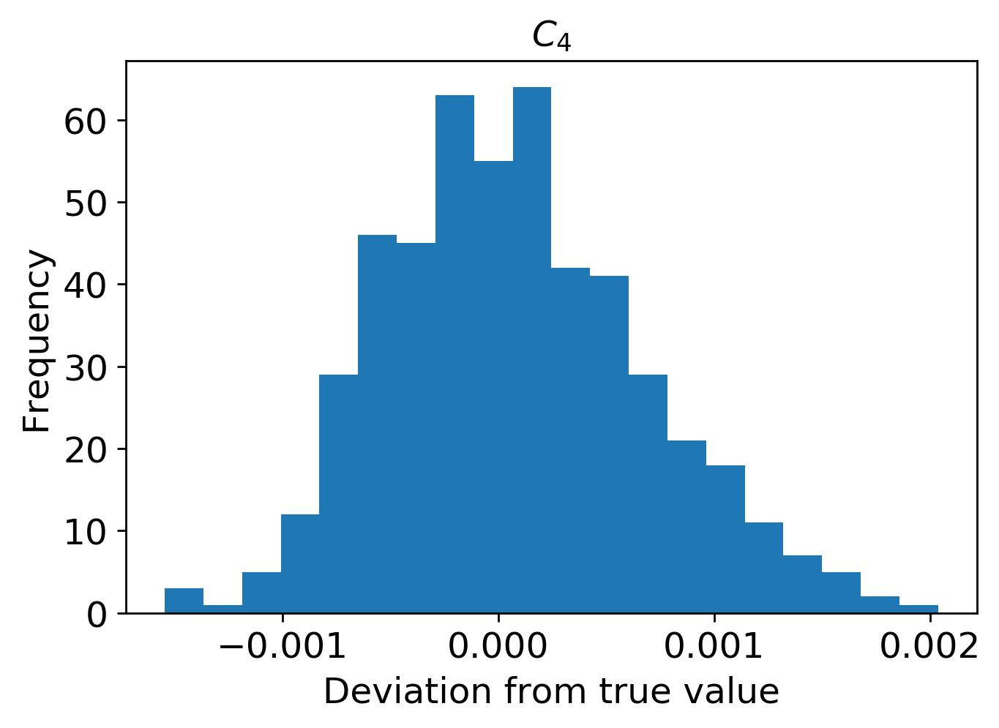

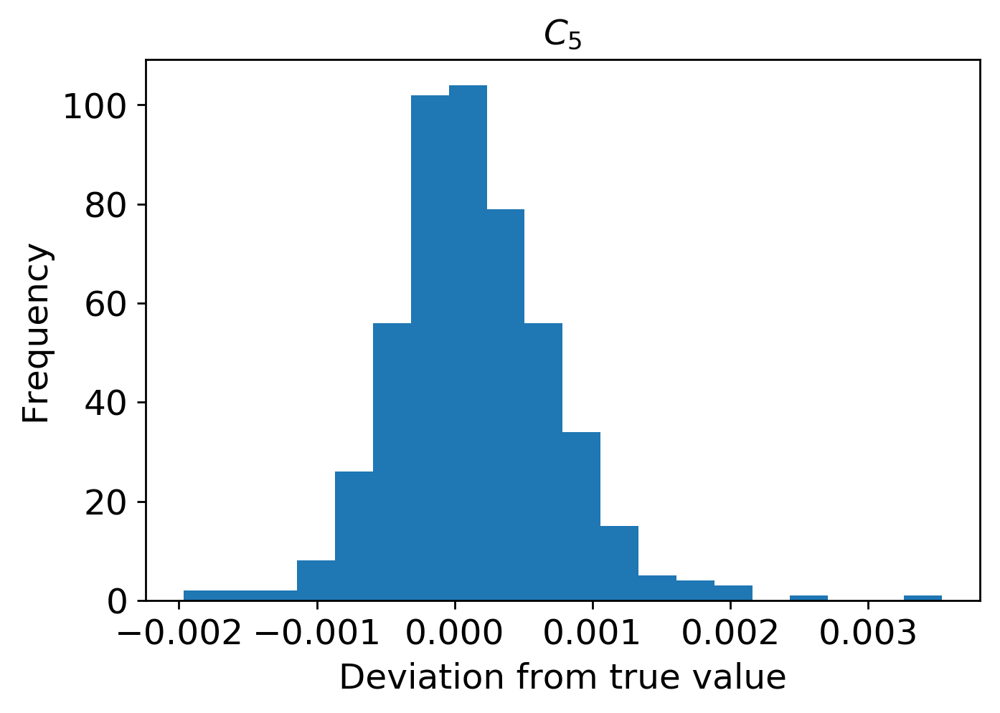

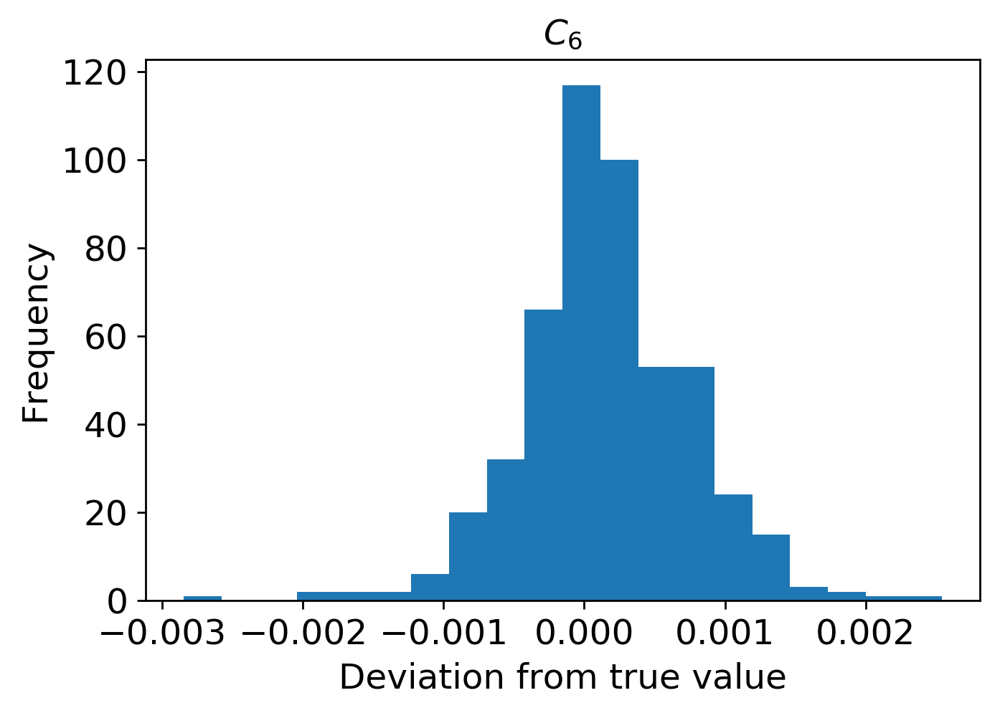

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2100/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

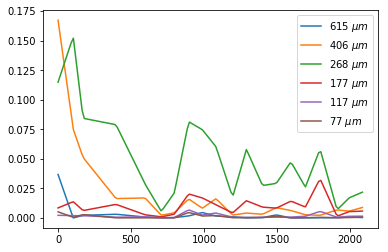

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2100/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2100.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



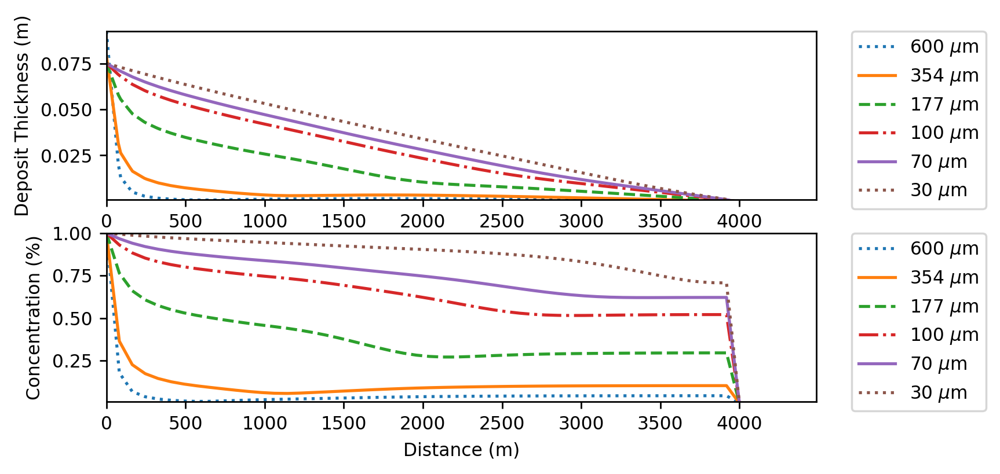

(5000, 9)
(5000, 1800)


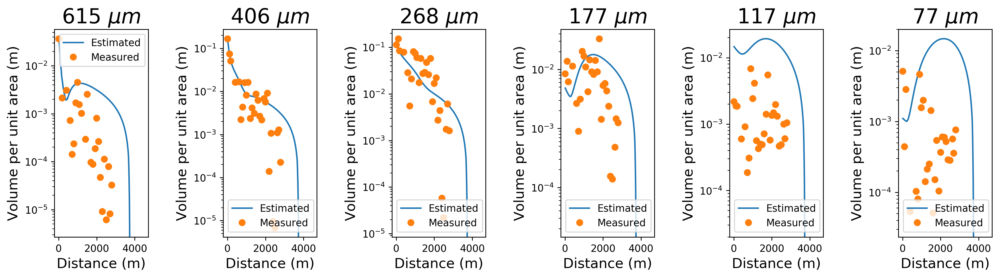

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2100.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2100.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2100.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2100.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2100.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2100.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2100.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2100.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[3.51157885e+03 4.97147845e+00 4.94400903e+00 5.49812329e-03
  2.06595411e-02 1.75644375e-02 4.80271283e-04 1.49870865e-03
  1.00773694e-04]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


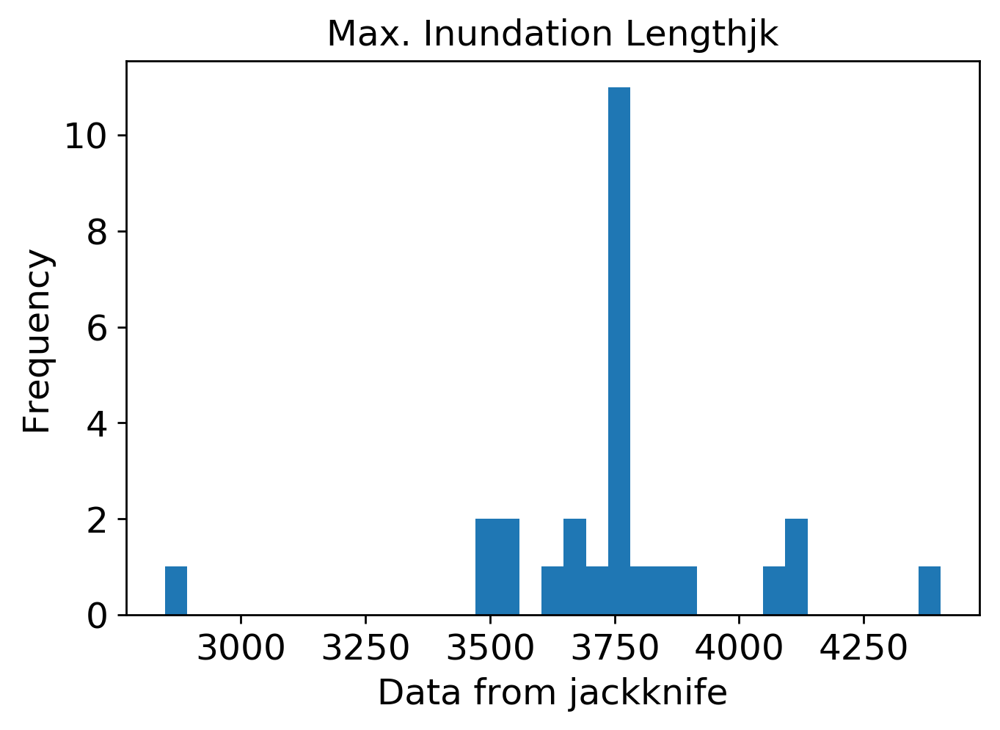

mean: 5.0742460962743845
jk_e: 0.05826493748142822


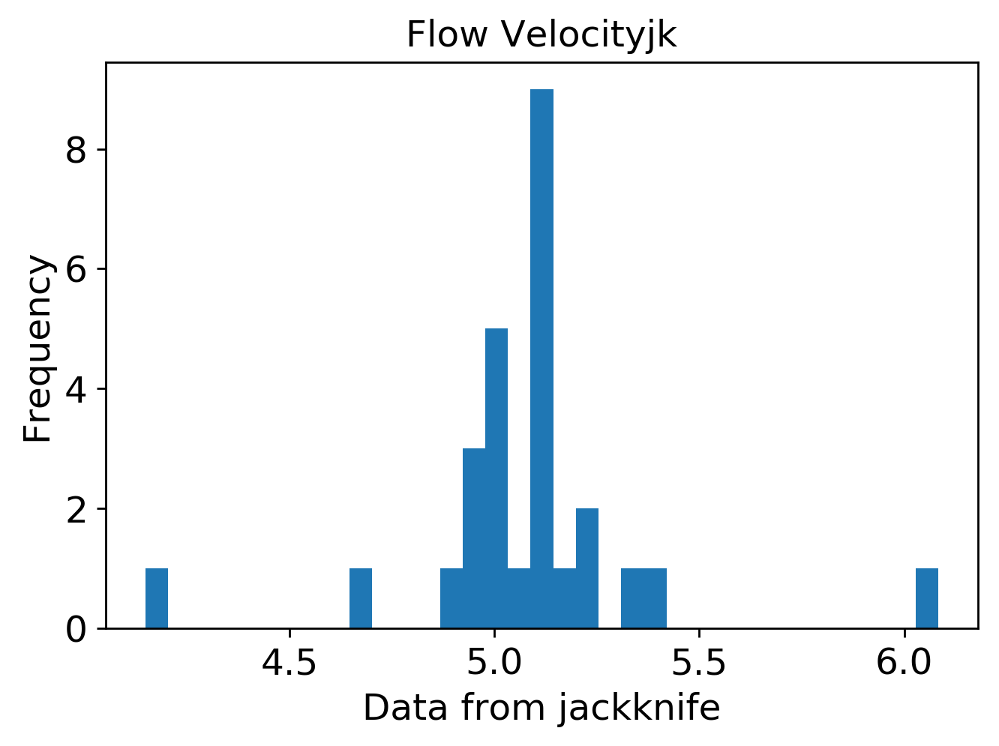

mean: 4.640191532932446
jk_e: 0.08827118405694


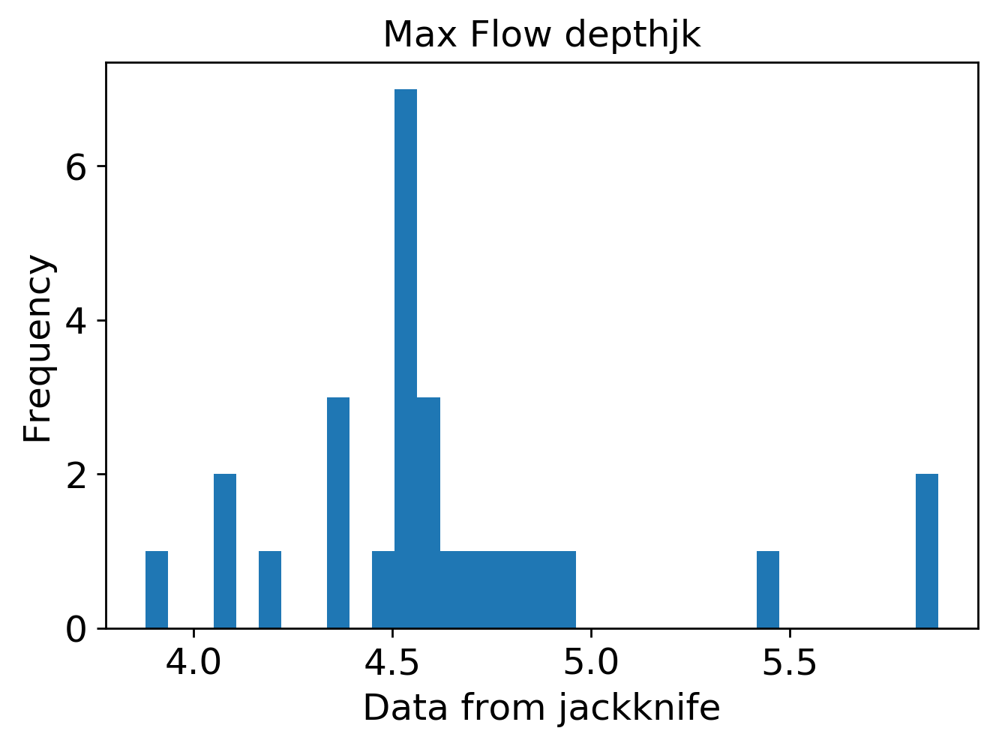

mean: 0.005213296132277105
jk_e: 0.00016484436891718834


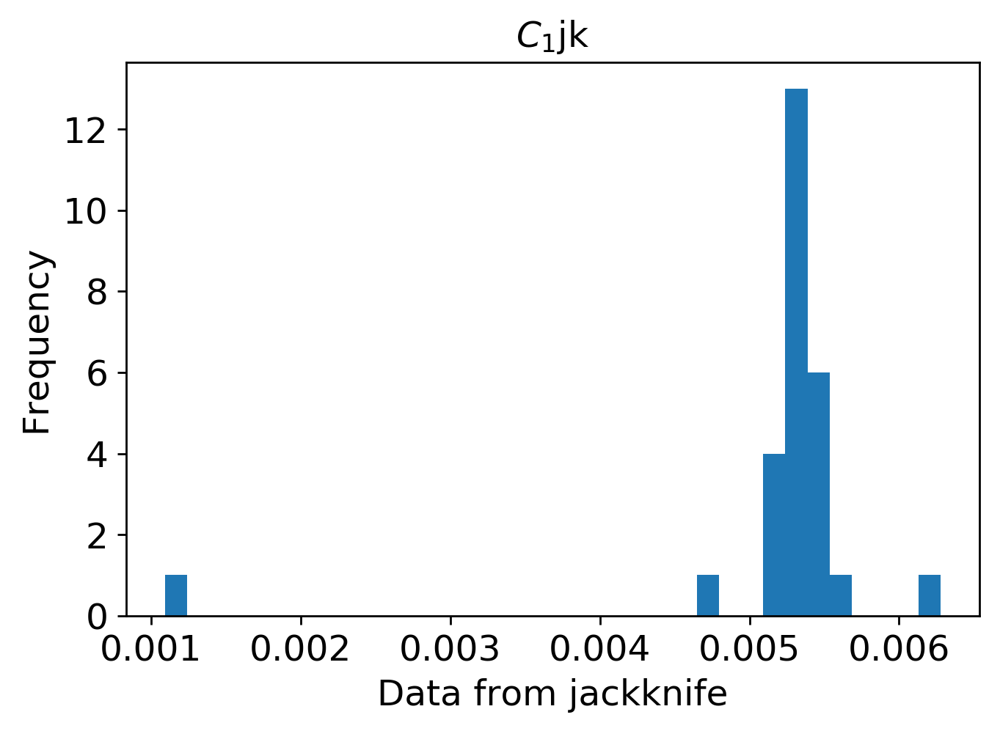

mean: 0.021039734947780095
jk_e: 0.0002566169622056622


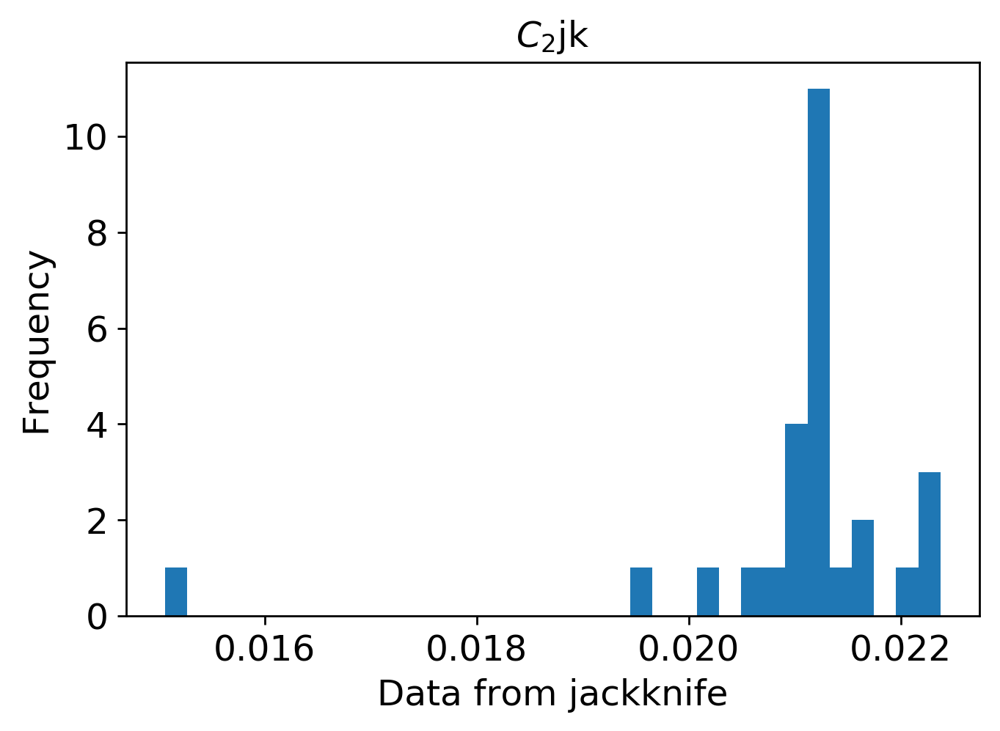

mean: 0.018921351853140568
jk_e: 0.00030836107397229714


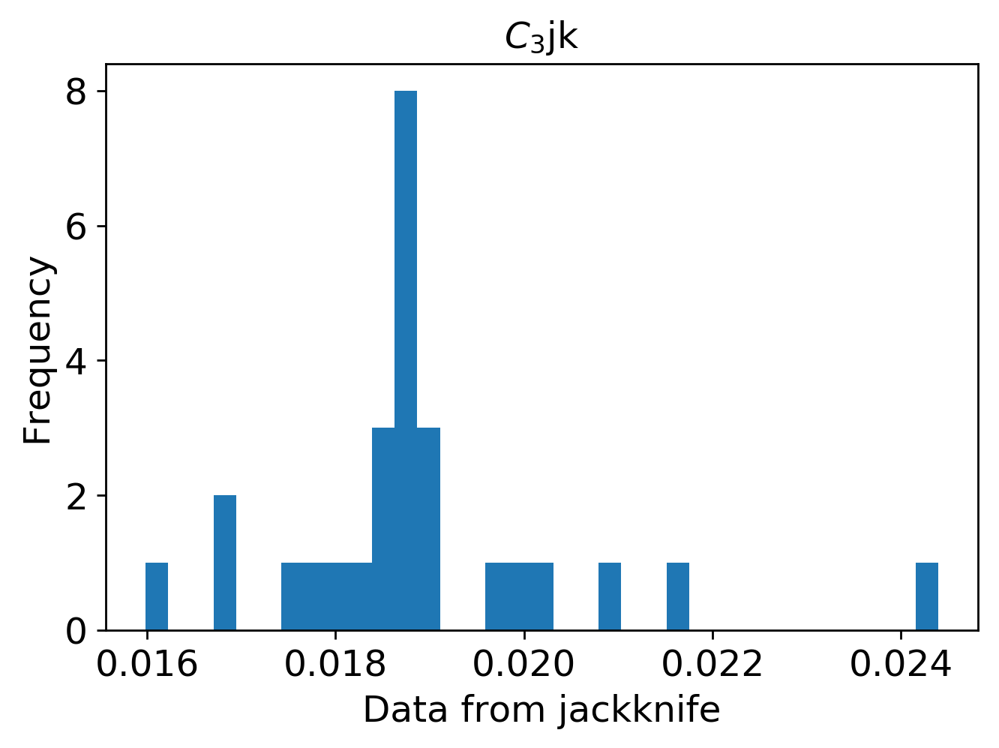

mean: 0.0007537463619982734
jk_e: 6.441546409952515e-05


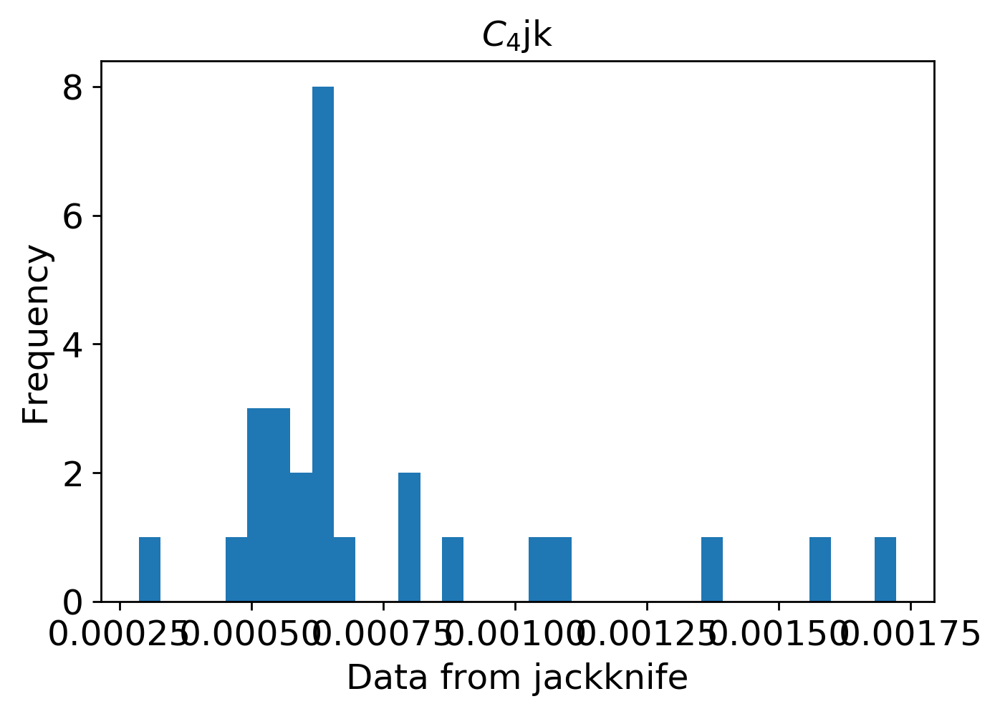

mean: 0.0019479811403824473
jk_e: 6.805344521386951e-05


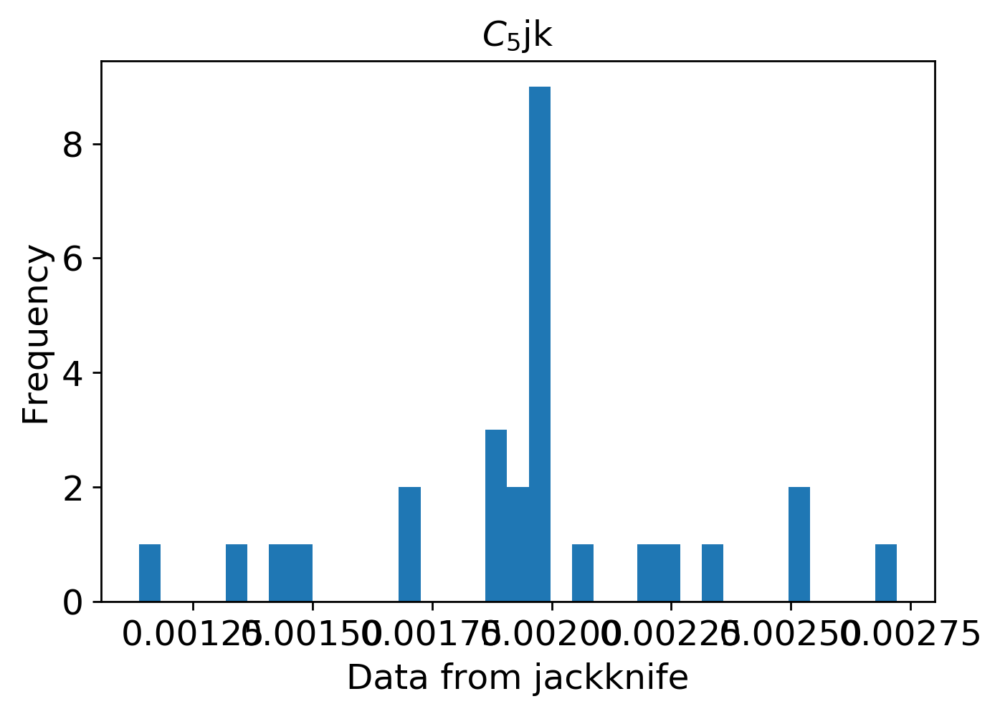

mean: 0.00023259139885932275
jk_e: 4.093912488859537e-05


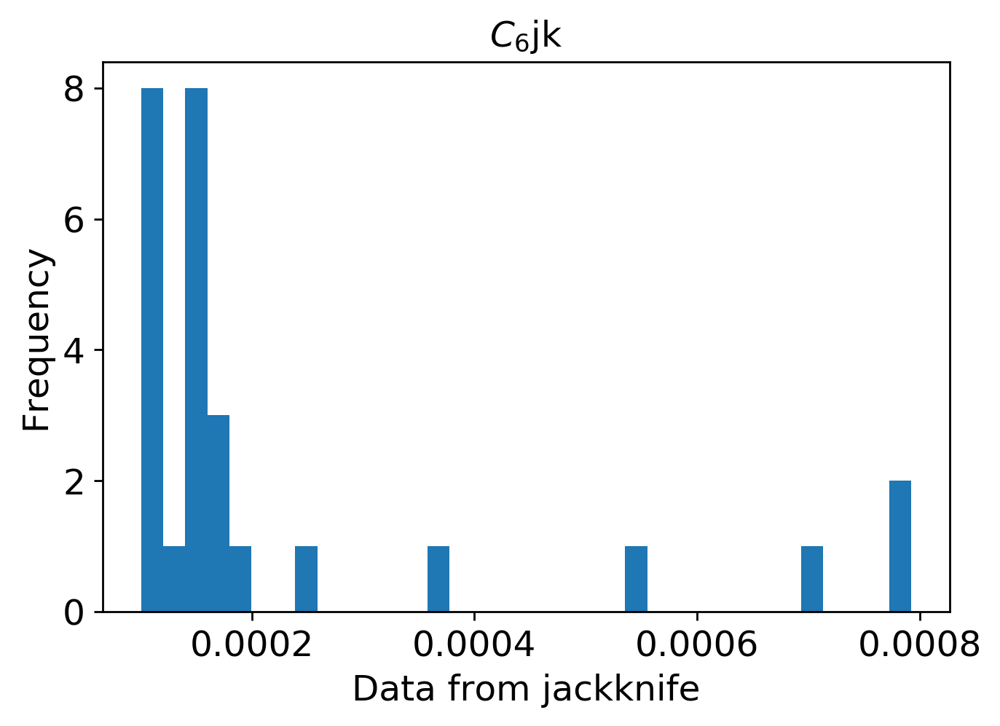

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2100/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2100.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2100.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2100.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2200

In [4]:

import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2200"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2200)
        
        
    

In [5]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2200/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2200/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 503us/step - loss: 0.0952 - mean_squared_error: 0.0952 - val_loss: 0.0698 - val_mean_squared_error: 0.0698
Epoch 2/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 3/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 4/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0491 - mean_squared_error: 0.0491 - val_loss: 0.0420 - val_mean_squared_error: 0.0420
Epoch 5/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0372 - val_mean_squared_error: 0.0372
Epoch 6/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0395 - mean_squared_error: 0.03

KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2200/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2200/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2200.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2200.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2200.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2200.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2200.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2200.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2200.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2200.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2200.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[3.24352391e+03 4.93039965e+00 5.22260449e+00 5.62192738e-03
  2.08980804e-02 1.75102202e-02 9.93321271e-04 1.31058899e-03
  1.00773694e-04]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


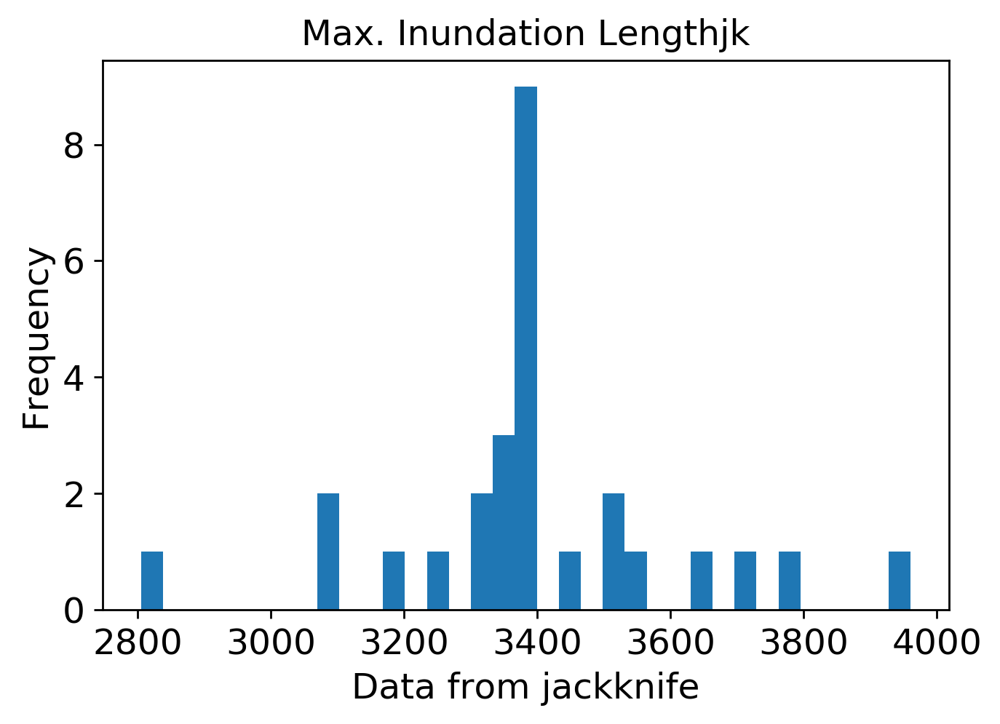

mean: 5.092475346761808
jk_e: 0.07513449045157405


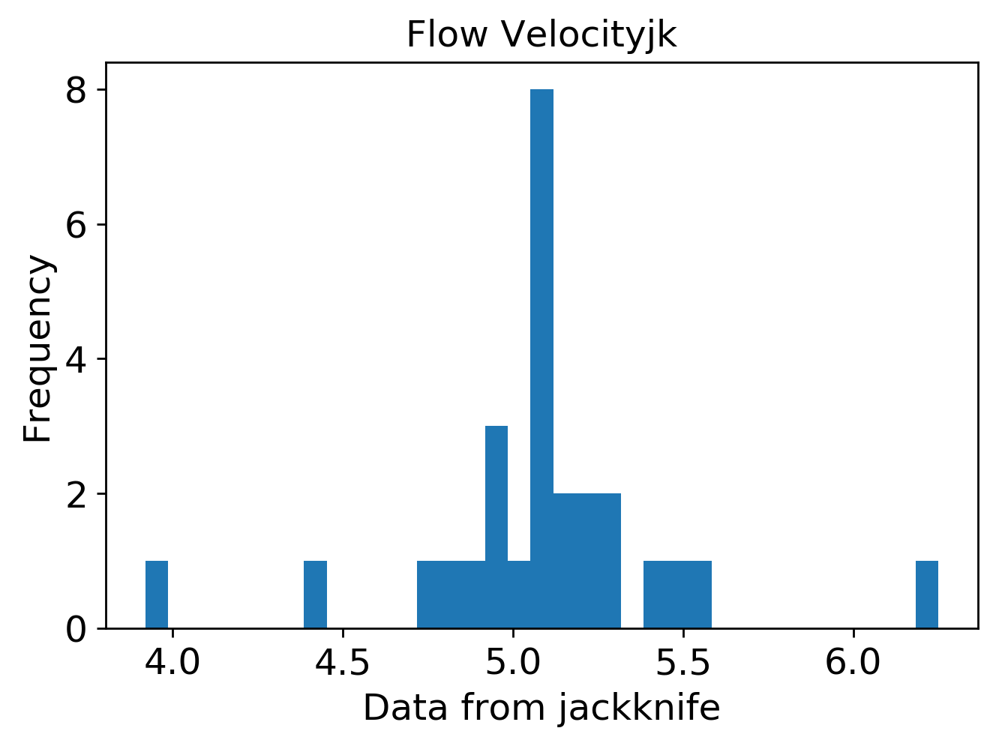

mean: 4.933140783170411
jk_e: 0.11813240553178822


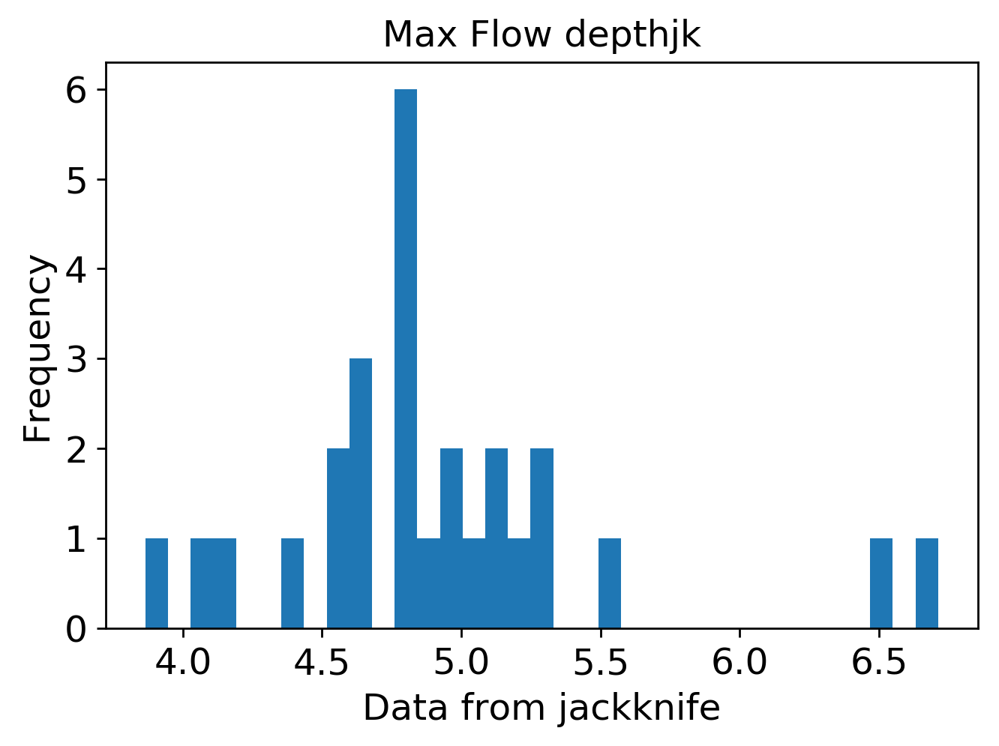

mean: 0.00559253221840331
jk_e: 0.0001552744221111285


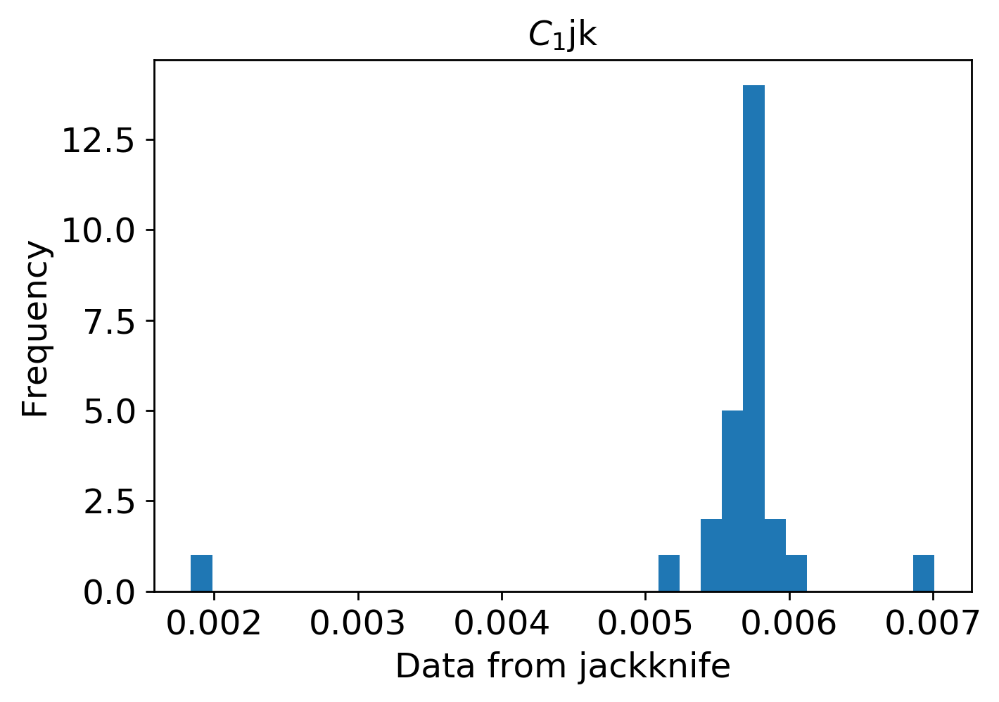

mean: 0.021489998760803285
jk_e: 0.0002909508116283944


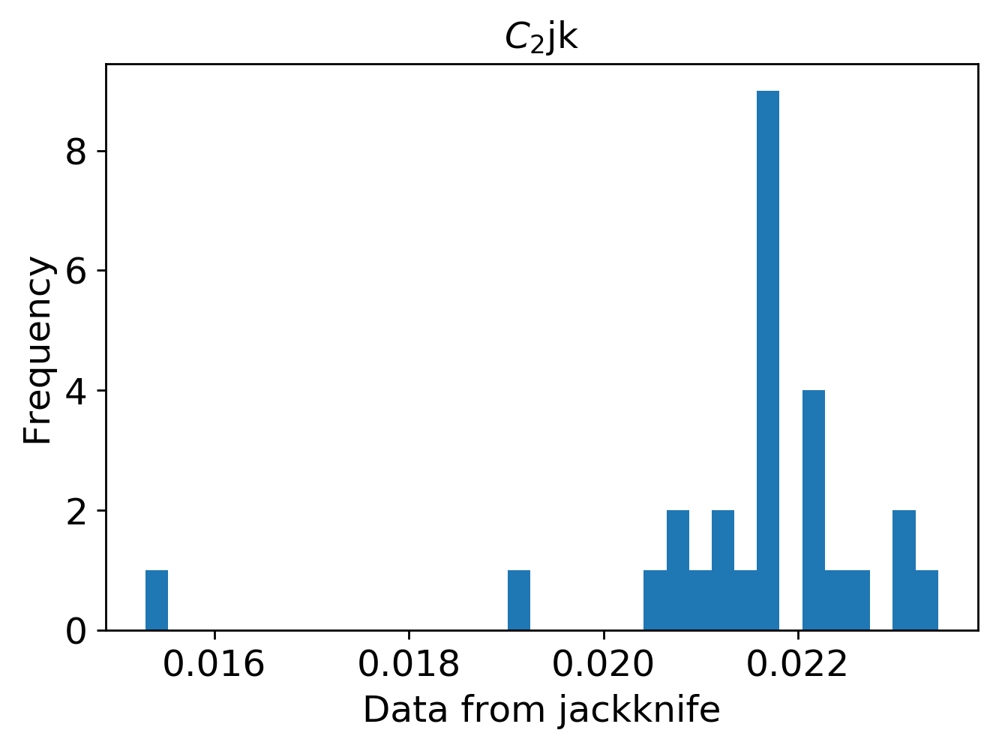

mean: 0.018744054363825775
jk_e: 0.00030076933919956714


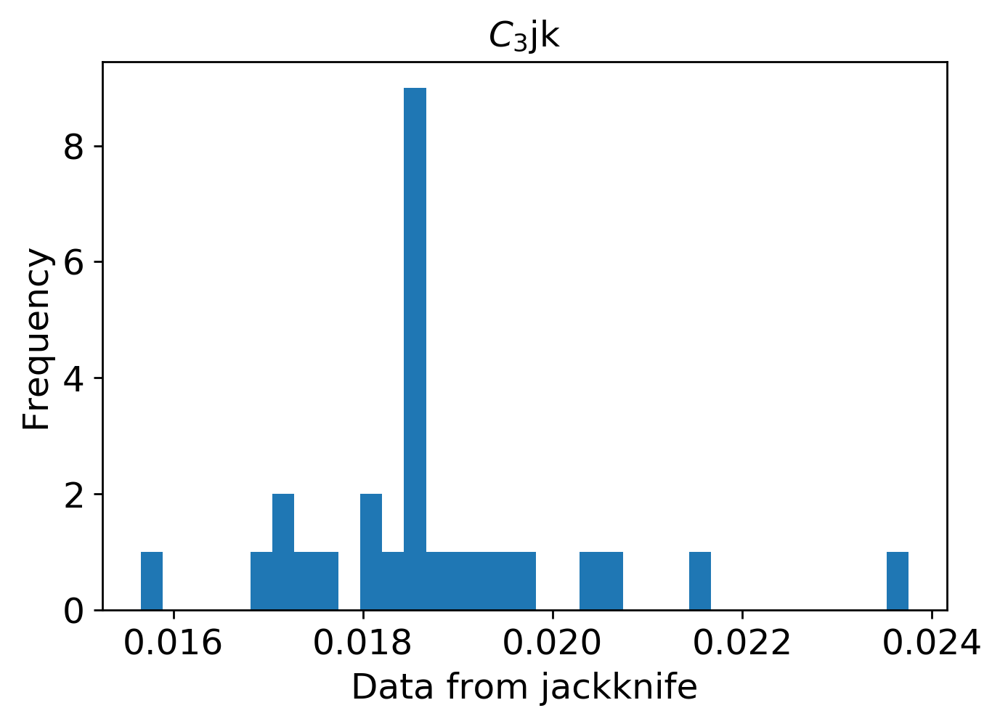

mean: 0.0010923096355753966
jk_e: 6.081866221548966e-05


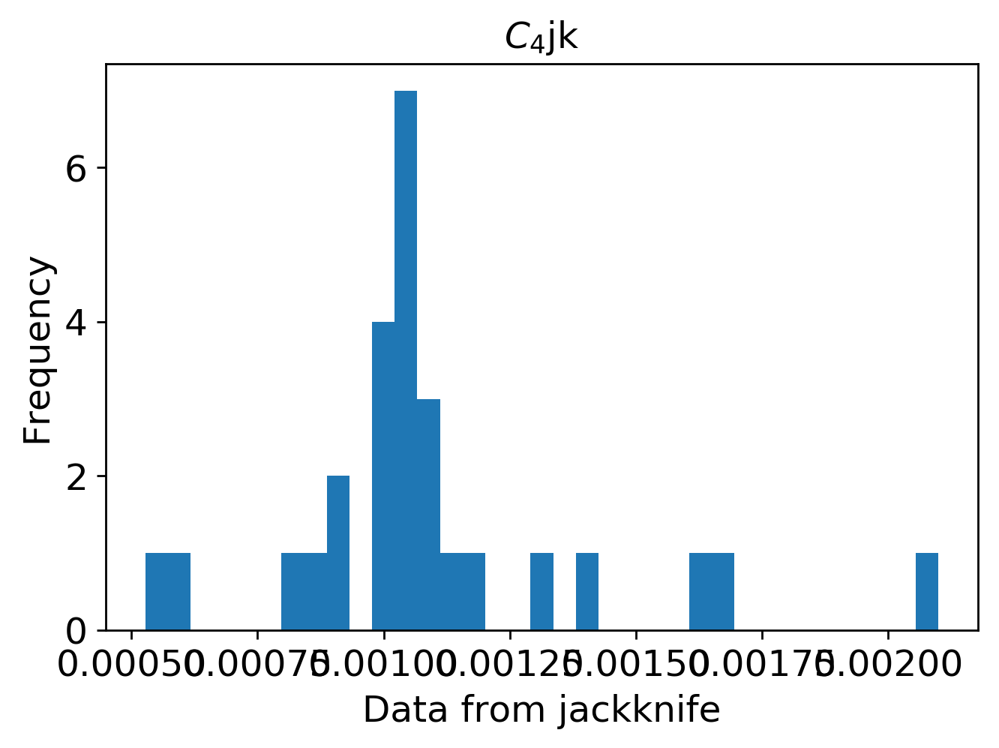

mean: 0.0017119396184561728
jk_e: 8.193050566534865e-05


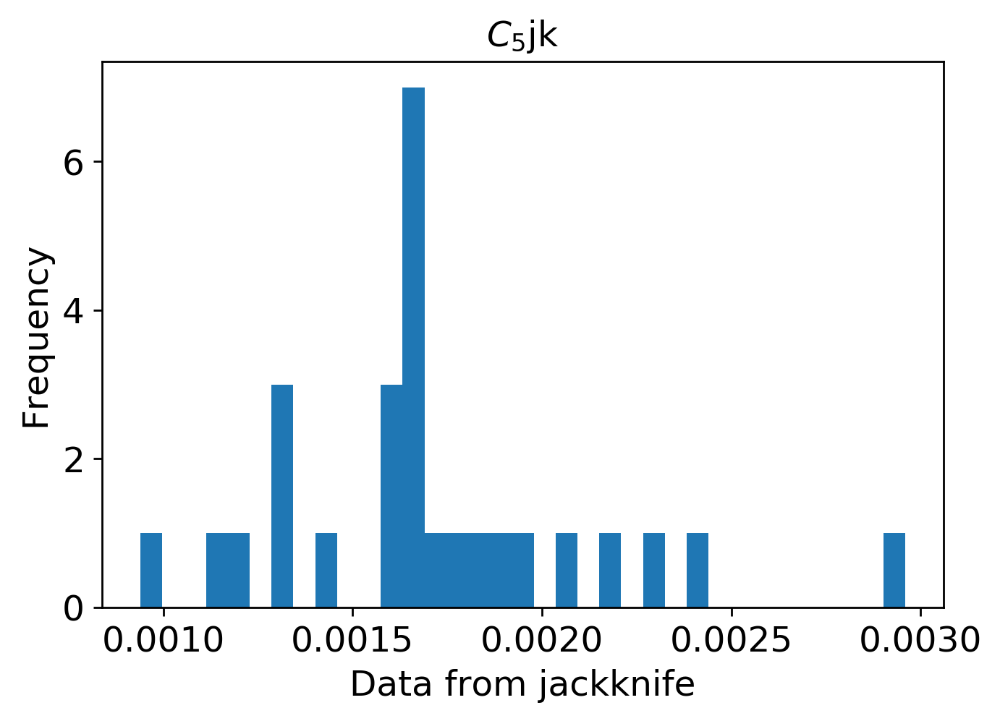

mean: 0.00011003769079872659
jk_e: 7.969606820493644e-06


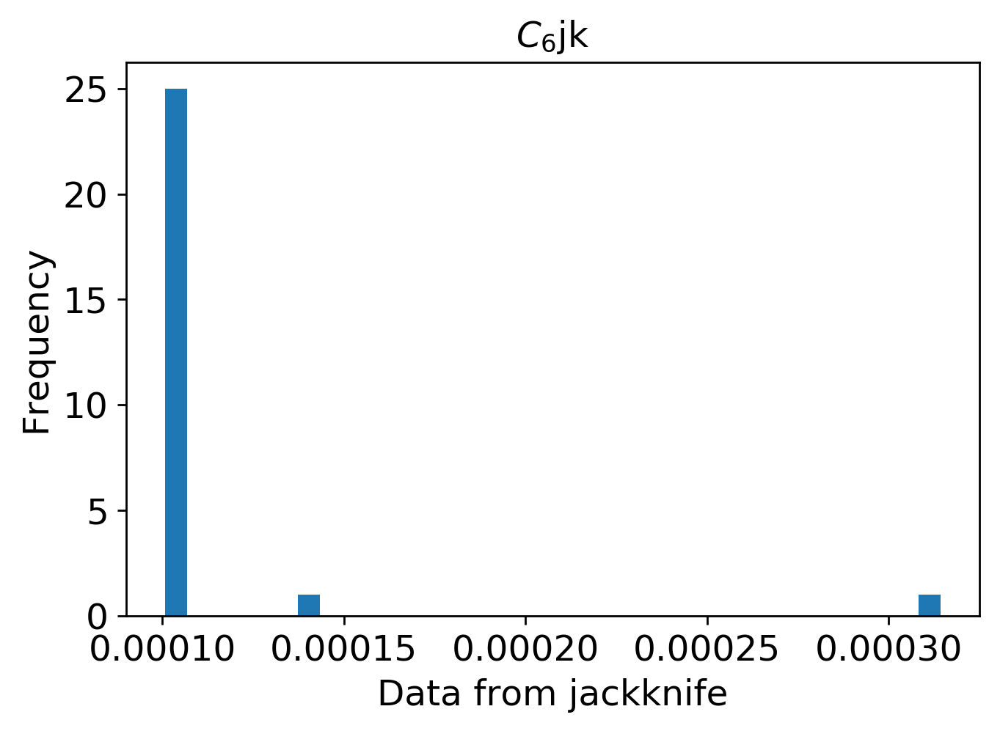

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2200/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2200.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2200.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2200.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2300

In [ ]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2300"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2300)
        
        
    

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2300/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2300/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2300/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2300/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2300/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2300/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2300.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2300.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2300.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2300.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2300.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2300.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2300.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2300.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2300.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


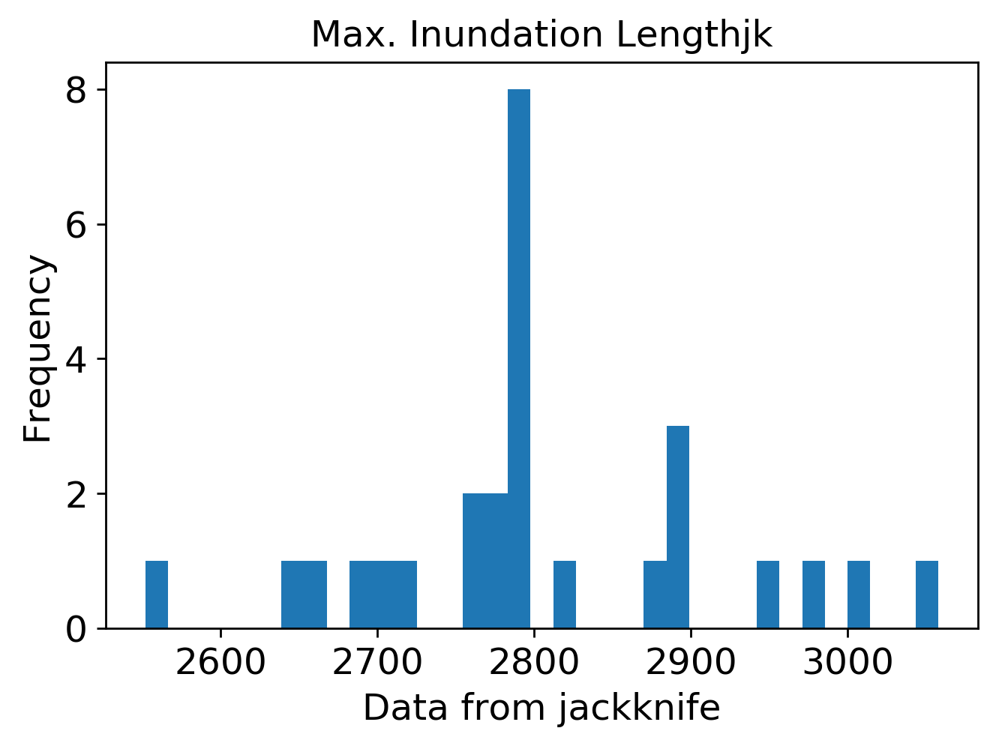

mean: 4.795461074693934
jk_e: 0.07332677428476744


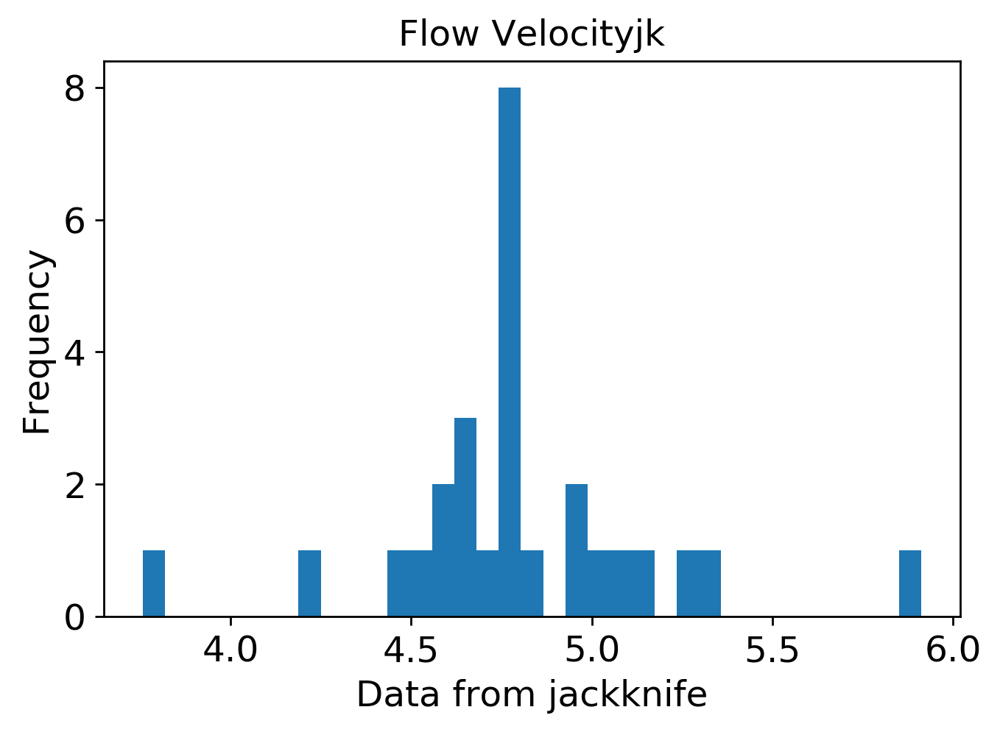

mean: 6.281447428994202
jk_e: 0.13338910448489755


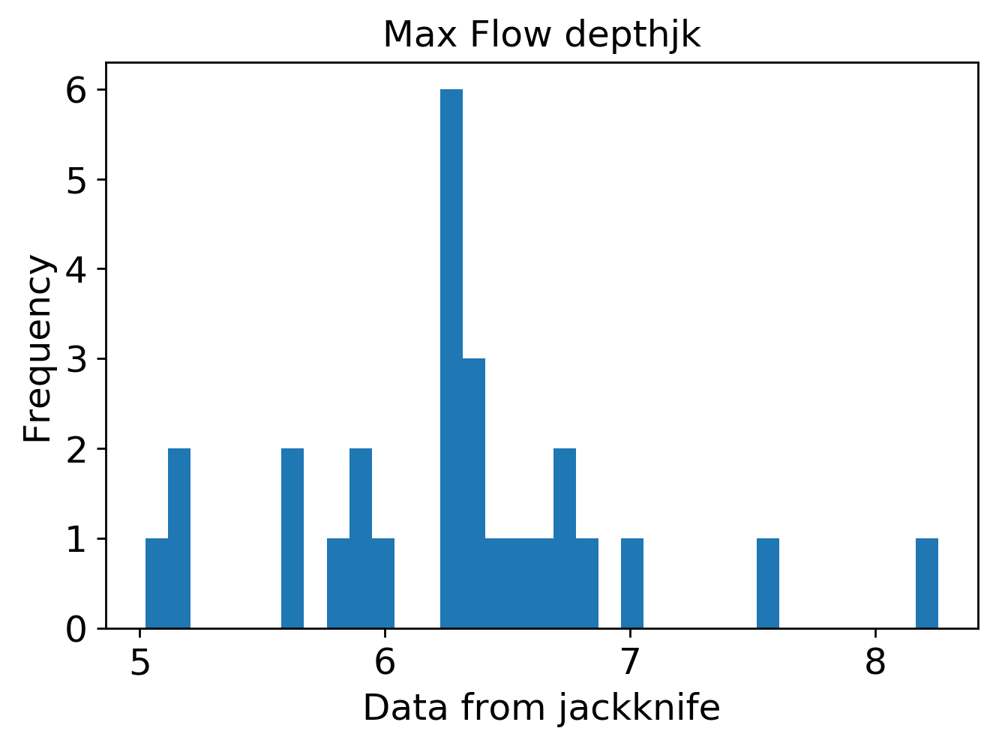

mean: 0.006055025233324662
jk_e: 0.00015254666284458785


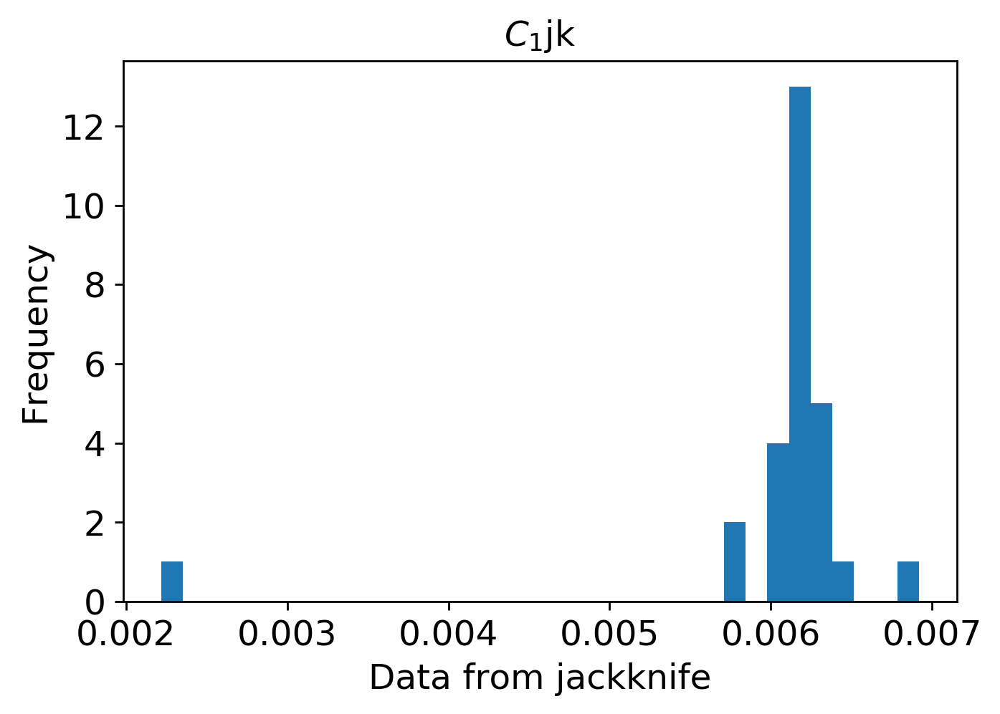

mean: 0.018693024867793808
jk_e: 0.0002725970016309909


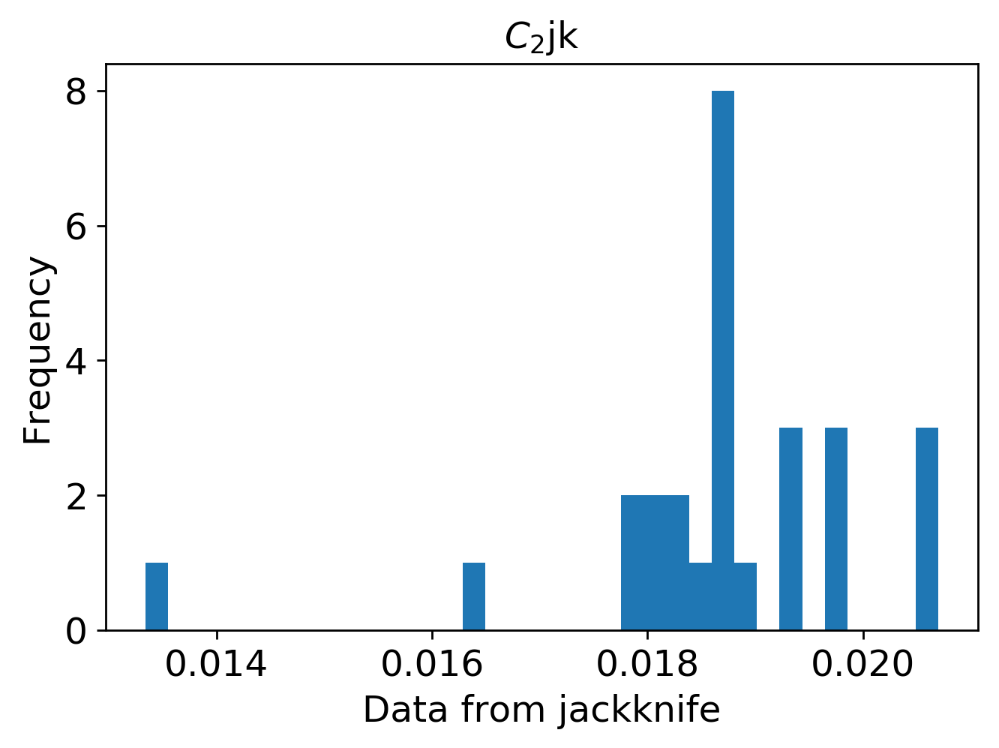

mean: 0.01551795620176091
jk_e: 0.0003143727046690487


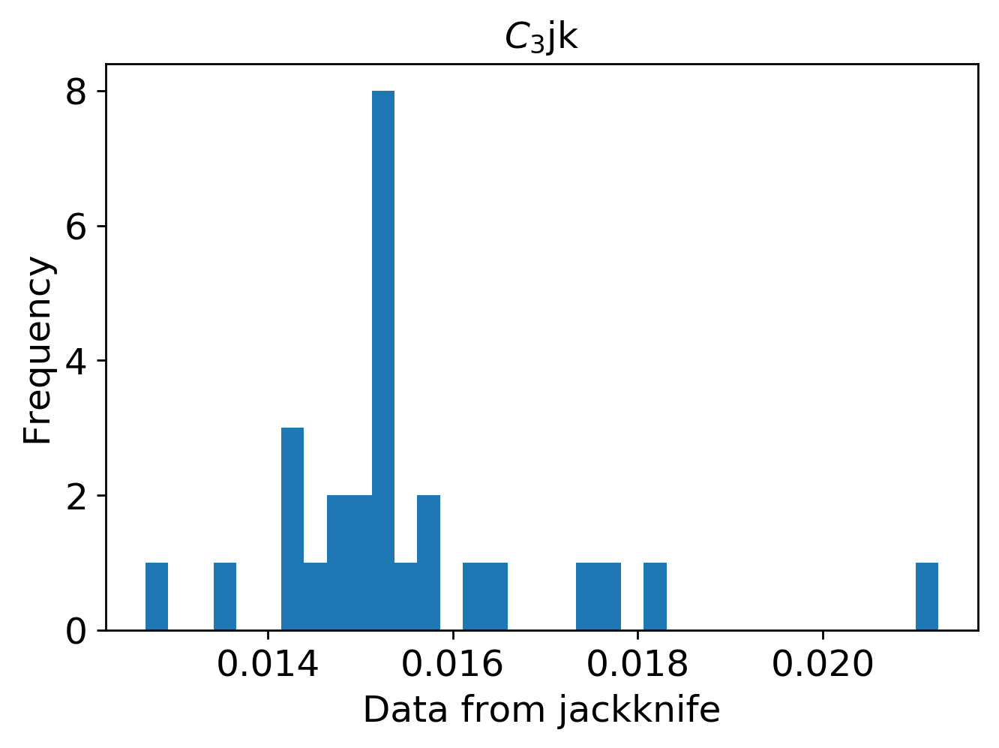

mean: 0.0009914432882809606
jk_e: 4.387318720427053e-05


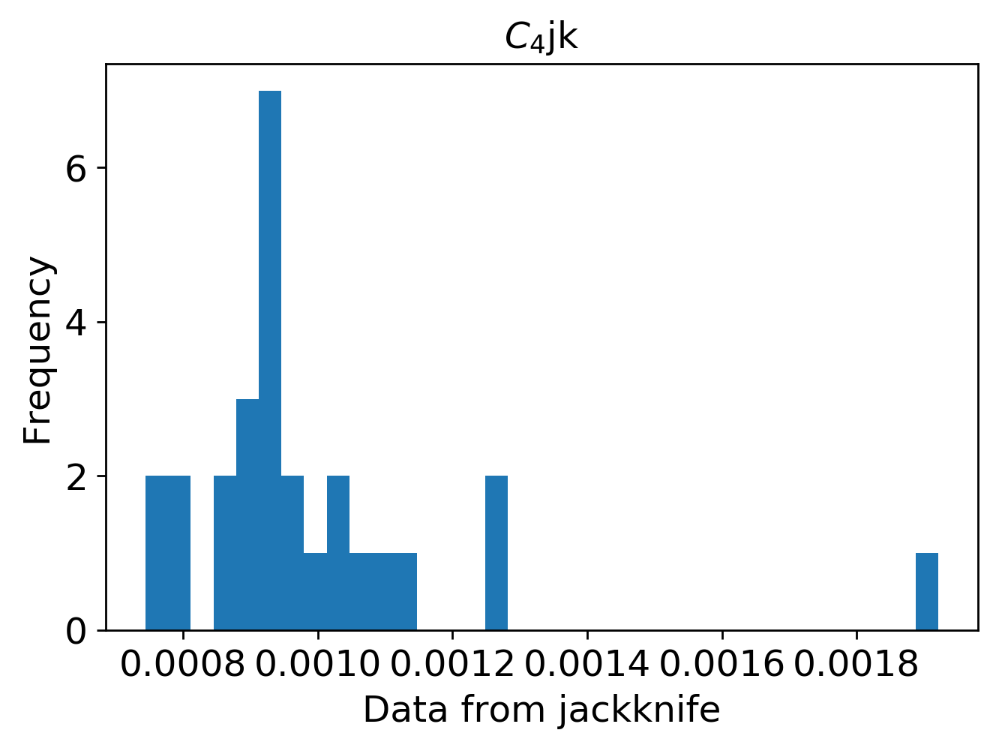

mean: 0.00014930319984948523
jk_e: 2.493030807714753e-05


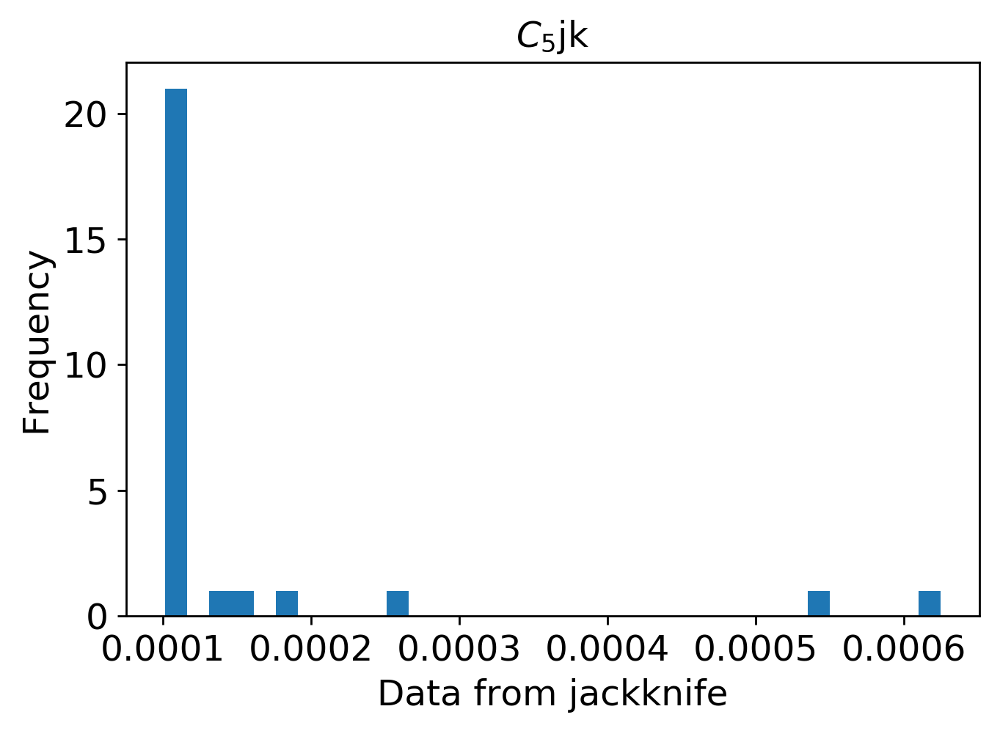

mean: 0.00039942013151261226
jk_e: 1.788069282291815e-05


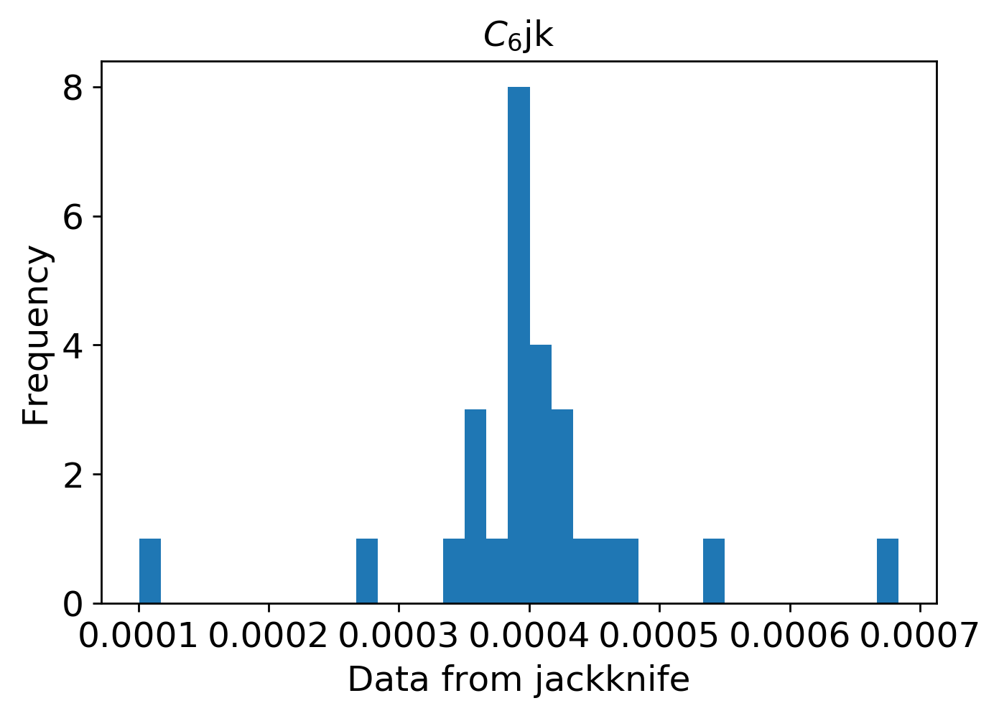

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2300/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2300/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2300.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2300.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2300.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()

# ROI 2400

In [ ]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2400"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2400)
        
        
    

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2400/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2400/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2400/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2400/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2400/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2400/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2400.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2400.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2400.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2400.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2400.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2400.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2400.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2400.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2400.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[2.80067313e+03 4.89696769e+00 6.23813232e+00 6.44810361e-03
  1.97777276e-02 1.61048626e-02 1.63835221e-03 1.01360960e-04
  8.31552306e-04]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


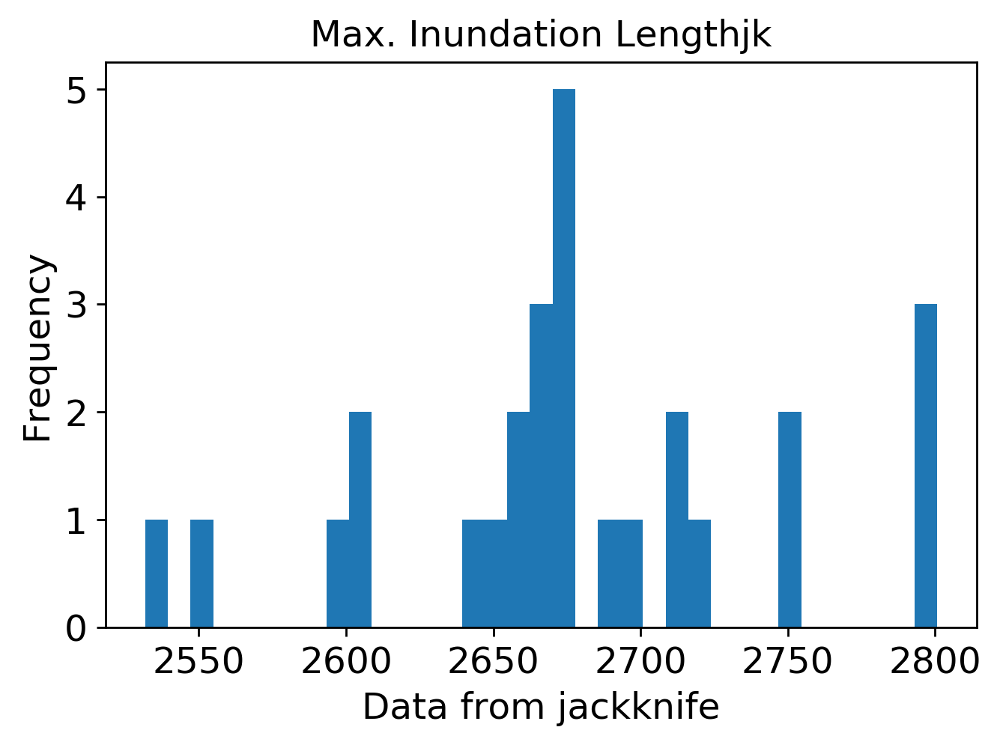

mean: 4.507818857059137
jk_e: 0.06823889194784433


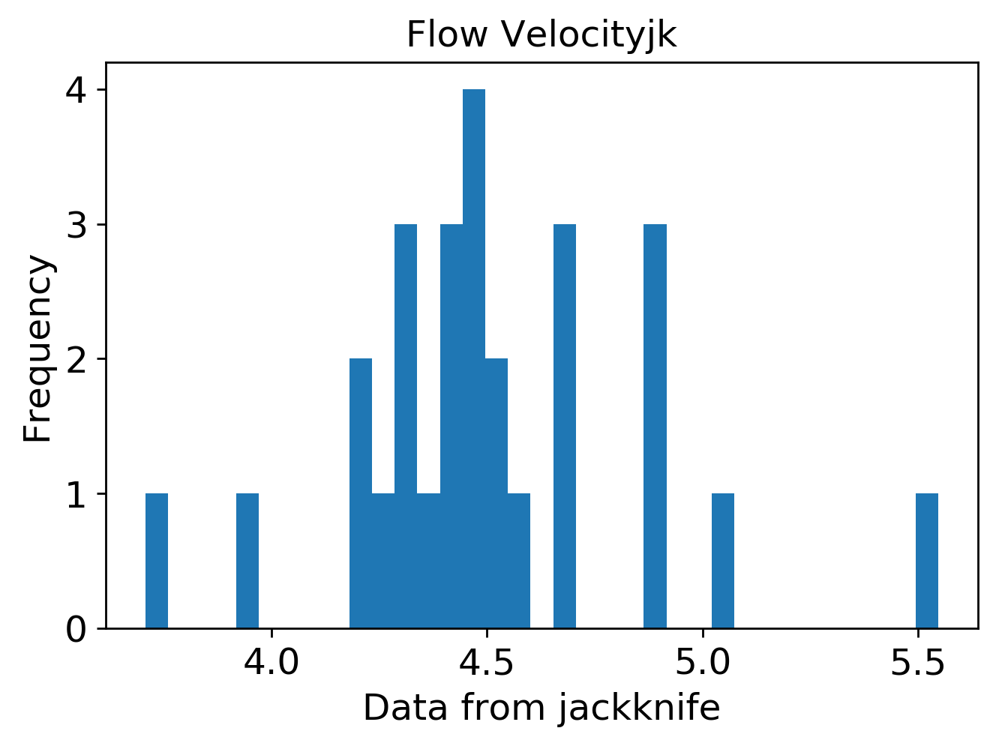

mean: 7.2761202759834065
jk_e: 0.13210921125562983


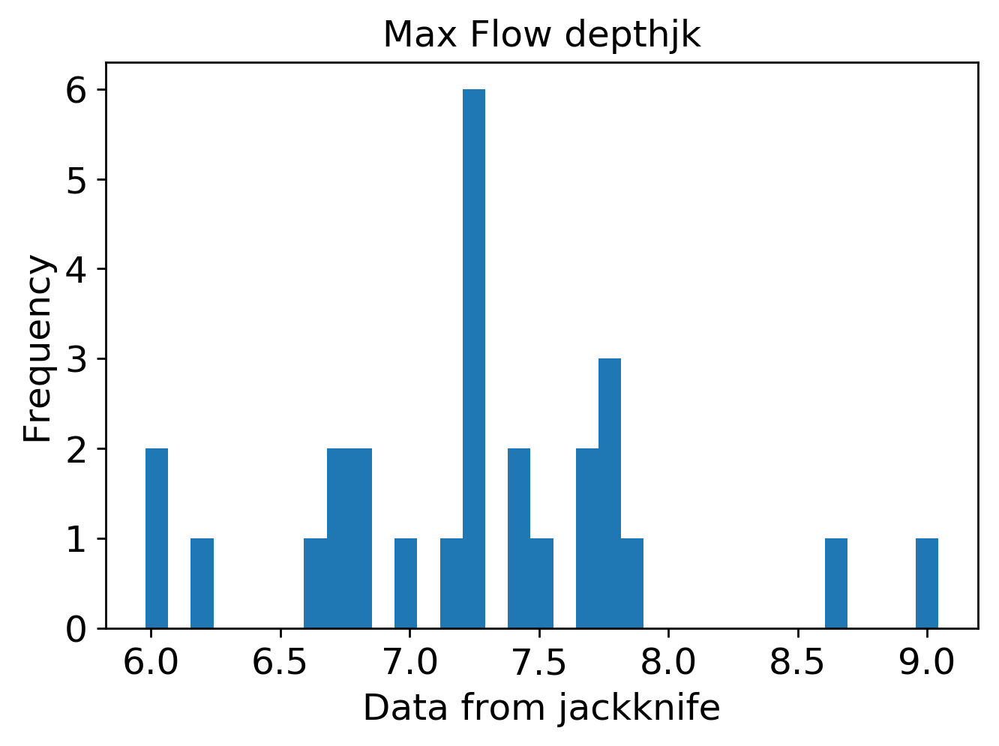

mean: 0.006021565565770883
jk_e: 0.0001442275807629779


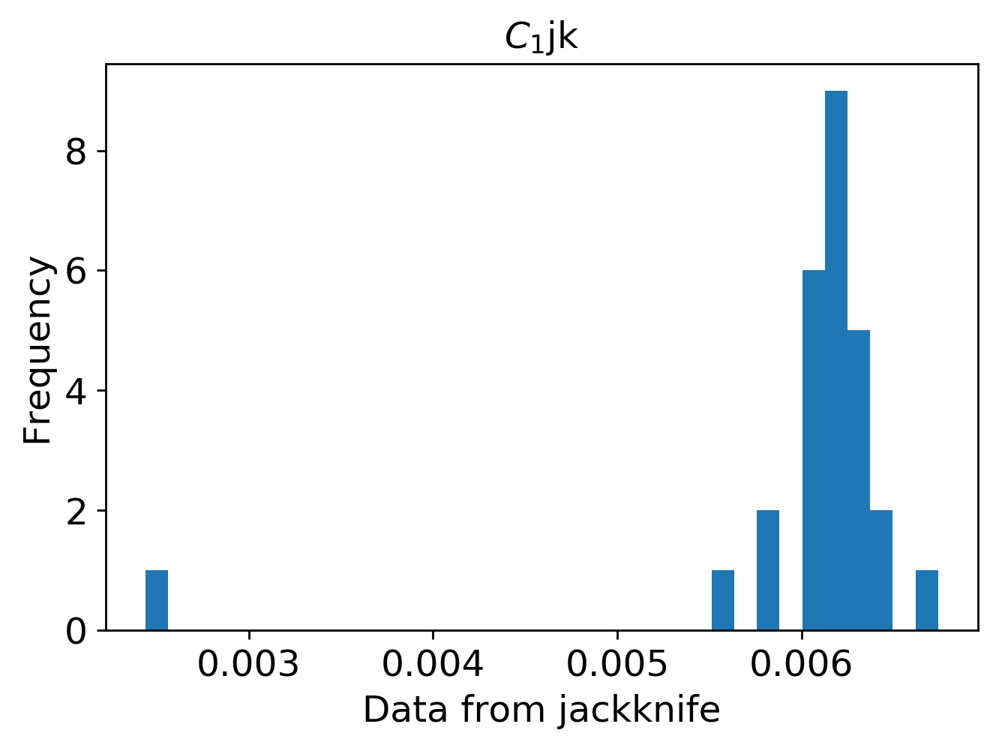

mean: 0.017849694621411085
jk_e: 0.000283282123649518


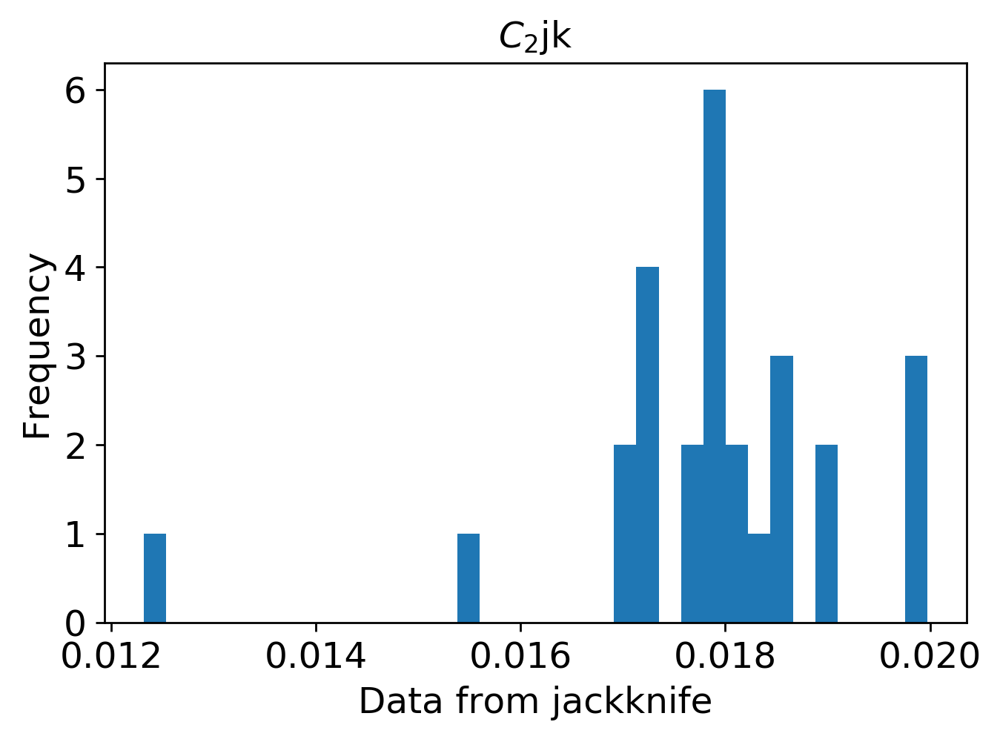

mean: 0.014558002281814123
jk_e: 0.00029141318973817273


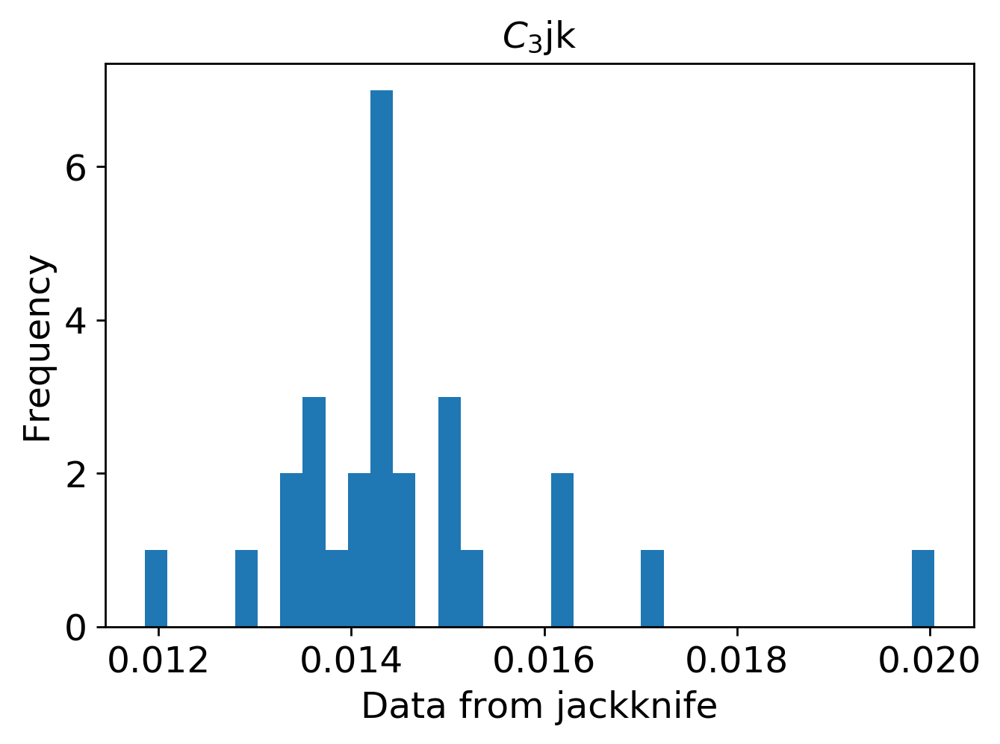

mean: 0.0012424954262926374
jk_e: 4.5032349019930157e-05


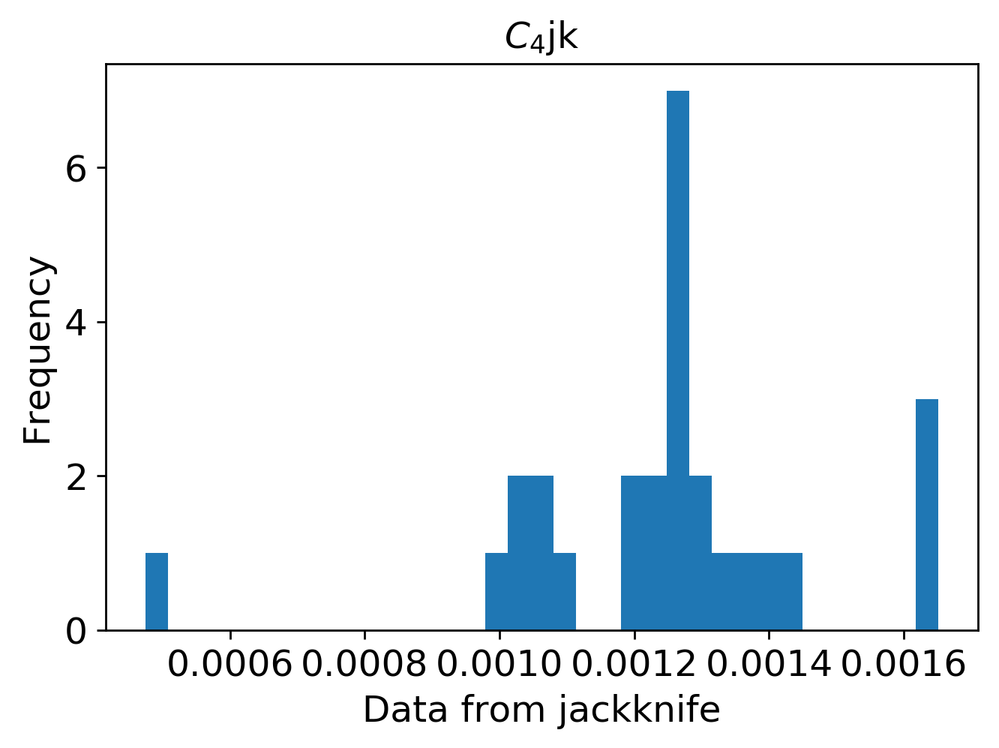

mean: 0.00010136096021857652
jk_e: 0.0


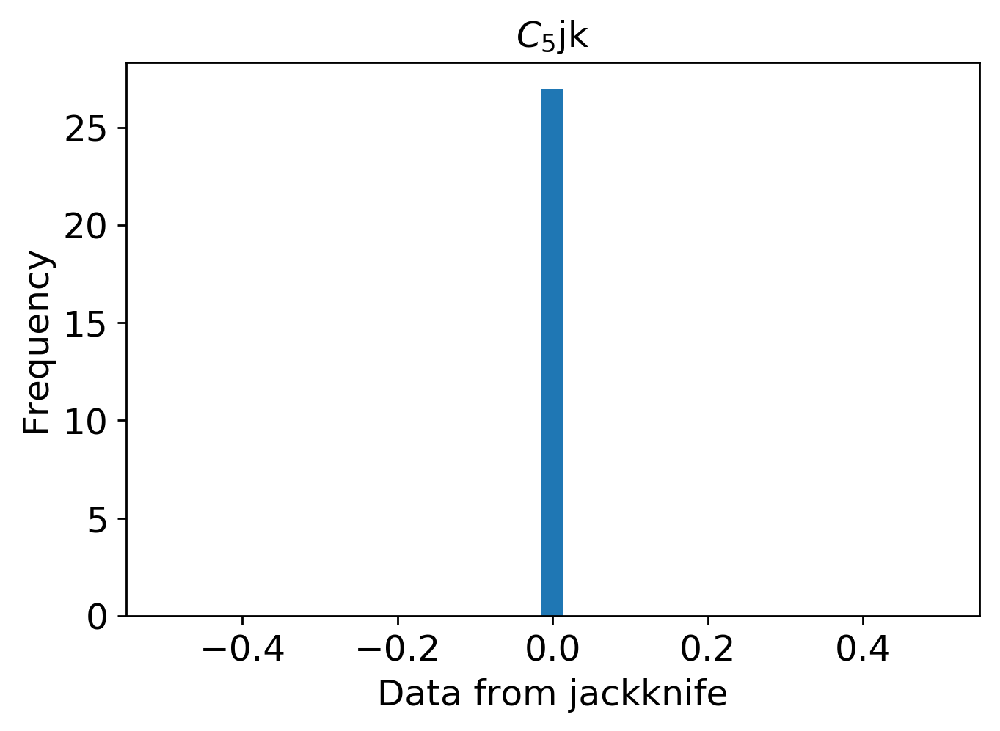

mean: 0.0007469762719259059
jk_e: 9.825841501527882e-06


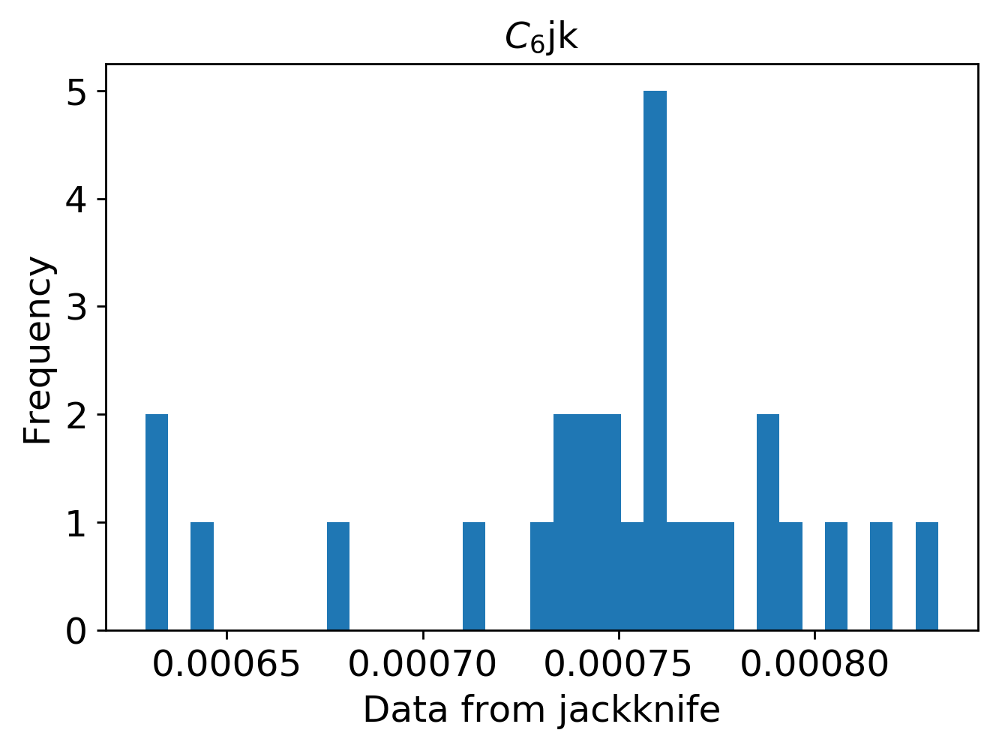

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2400/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2400/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2400.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2400.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2400.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2600

In [ ]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2600"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2600)
        
        
    

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2600/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2600/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2600/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2600/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2600/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2600/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2600.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2600.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2600.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2600.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2600.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2600.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2600.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2600.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2600.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


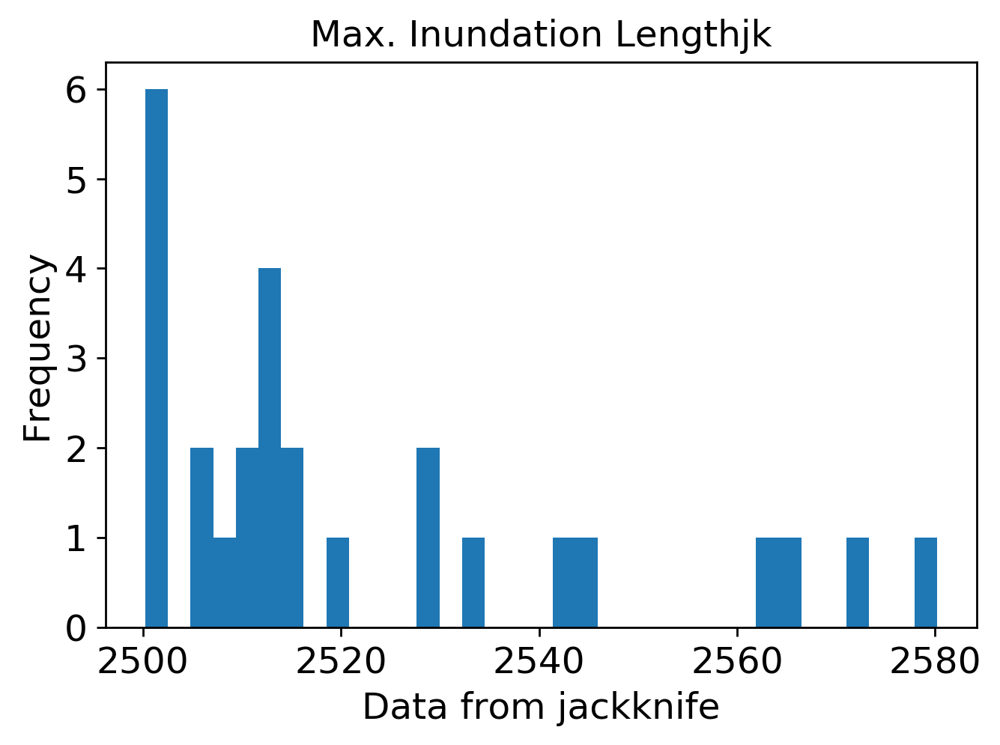

mean: 4.178204487761144
jk_e: 0.055018708187834754


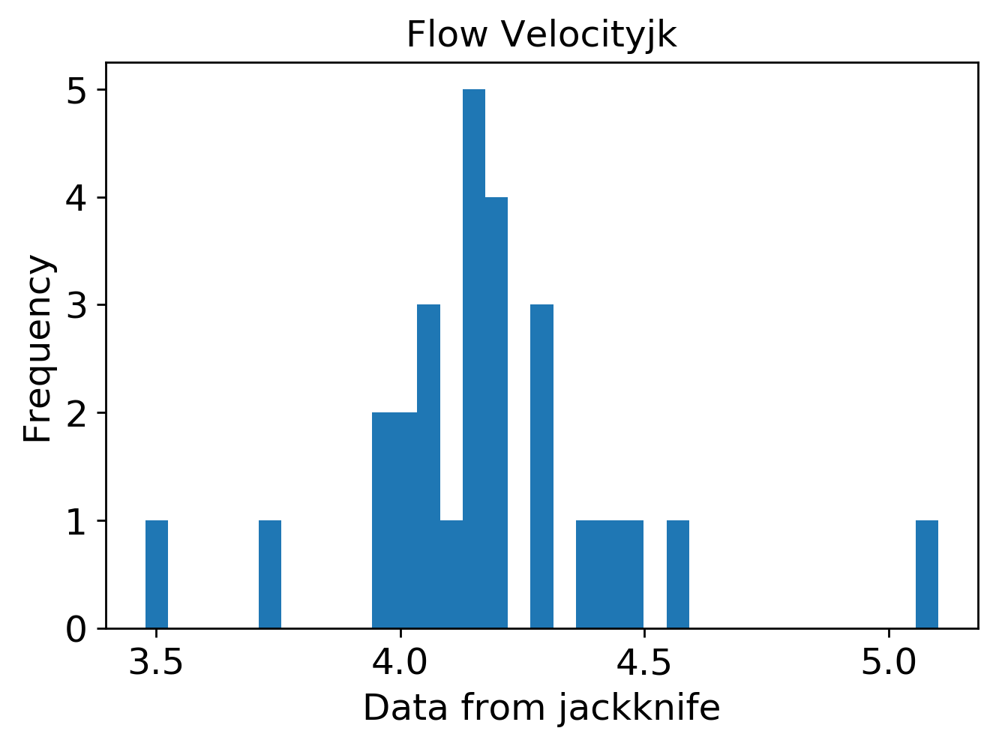

mean: 7.985215316544189
jk_e: 0.11678125618948641


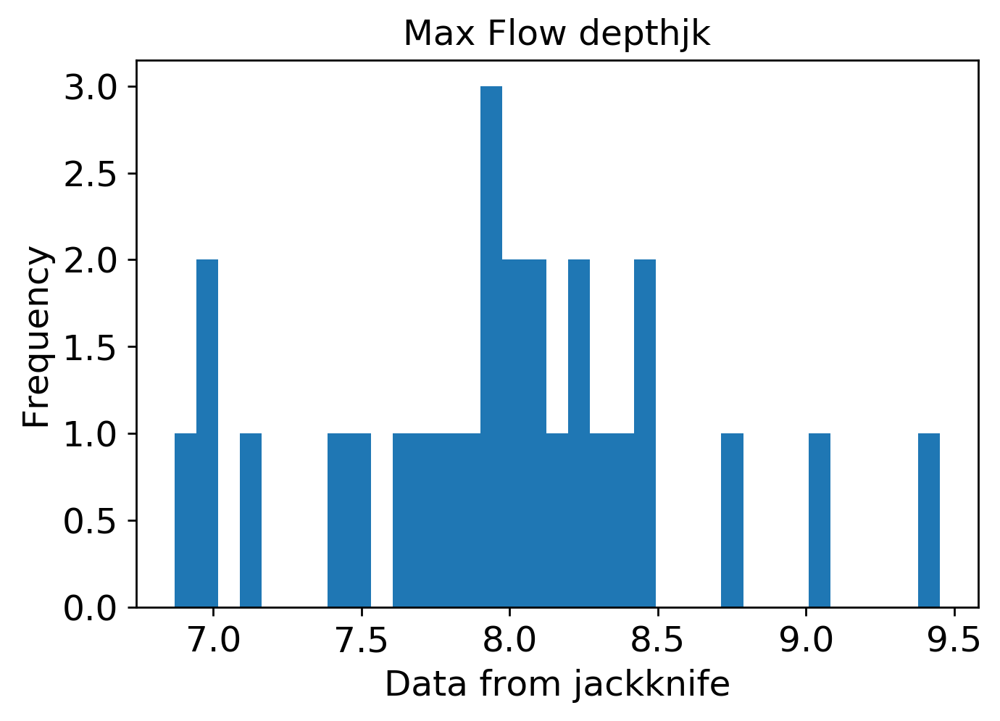

mean: 0.006483370255231764
jk_e: 0.00015911084887653218


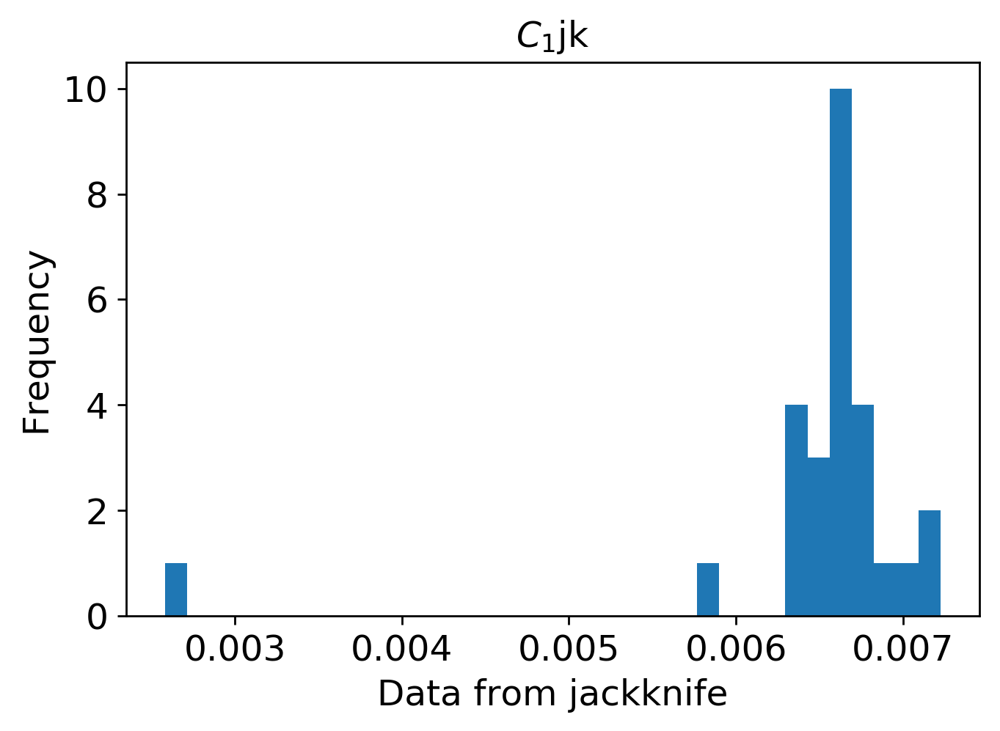

mean: 0.017108537167575617
jk_e: 0.0002179236225404222


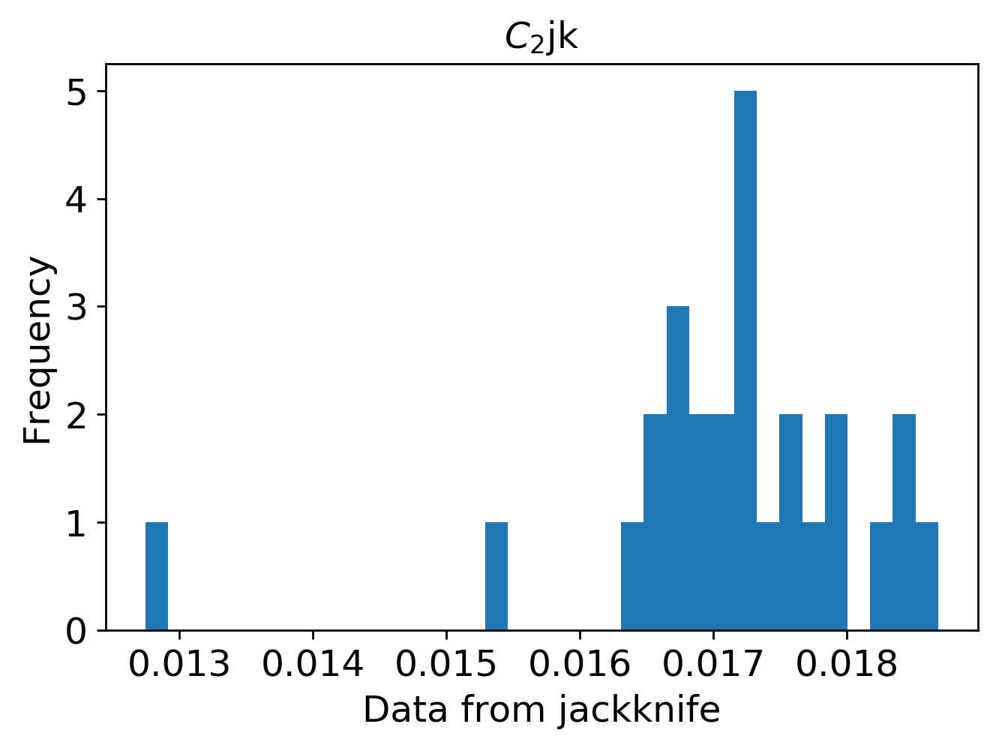

mean: 0.013306005894462805
jk_e: 0.0002966561042669757


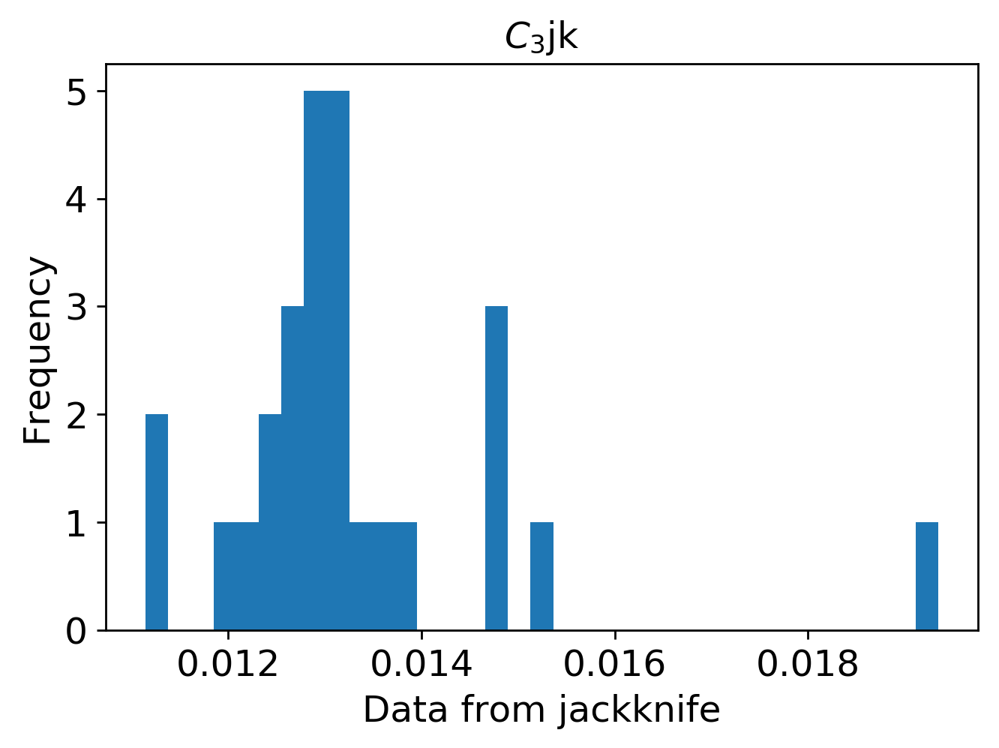

mean: 0.0007398849711348605
jk_e: 4.188567418166232e-05


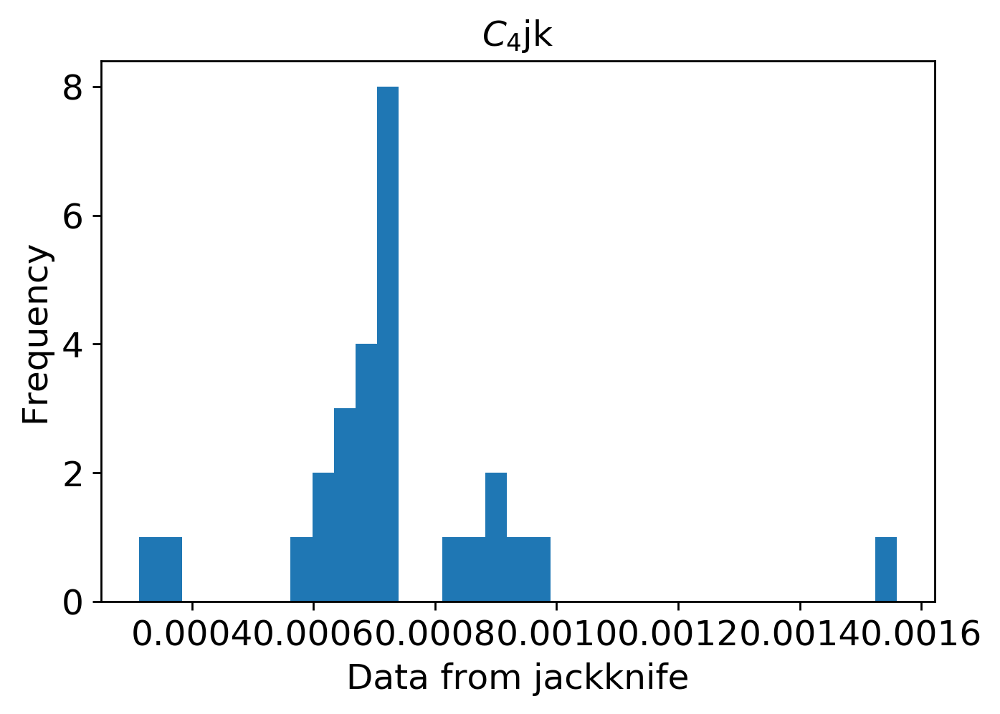

mean: 0.00010136096021857652
jk_e: 0.0


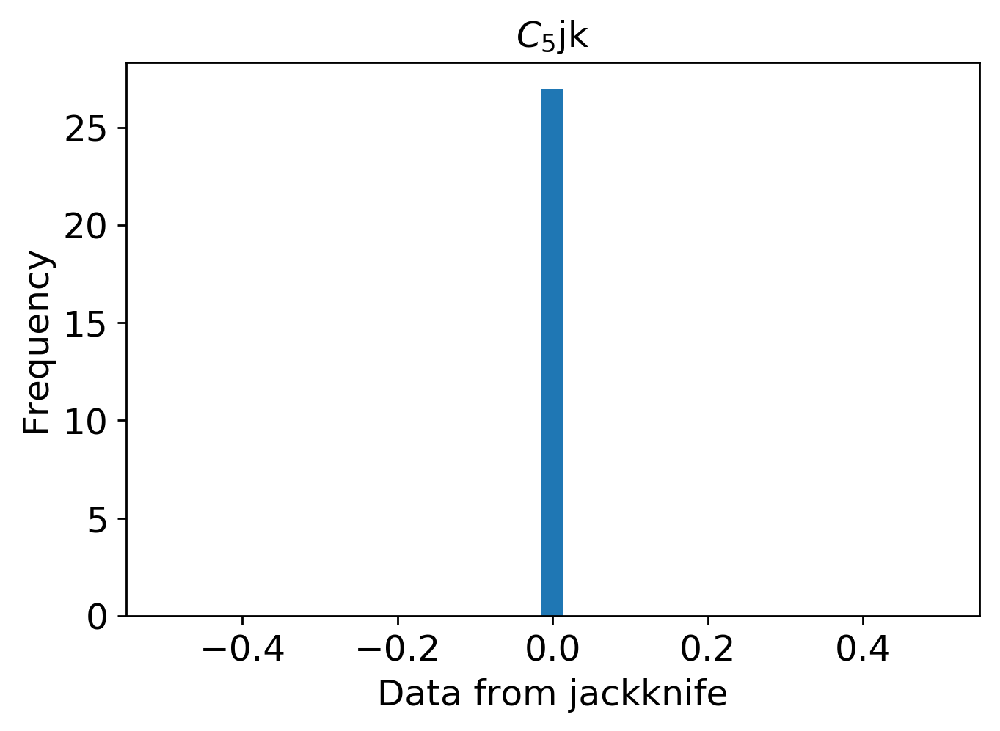

mean: 0.000343258270009806
jk_e: 2.0783357956767144e-05


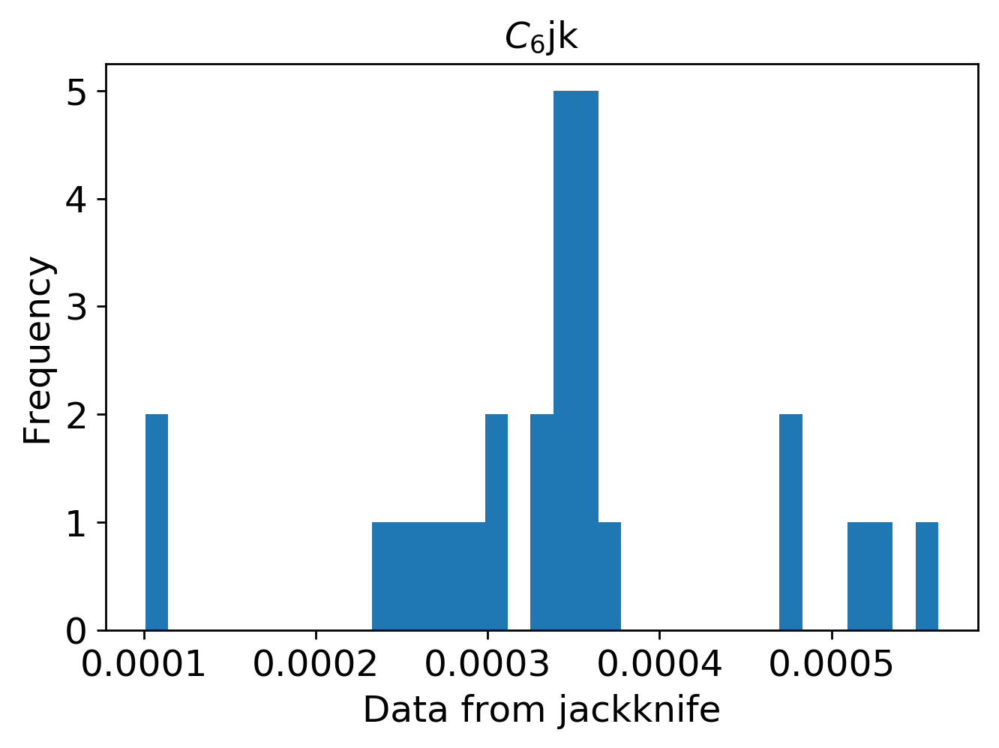

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2600/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2600/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2600.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2600.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2600.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2700

In [ ]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2700"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2700)
        
        
    

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2700/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2700/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2700/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2700/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2700/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2700/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2700.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2700.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2700.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2700.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2700.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2700.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2700.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2700.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2700.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


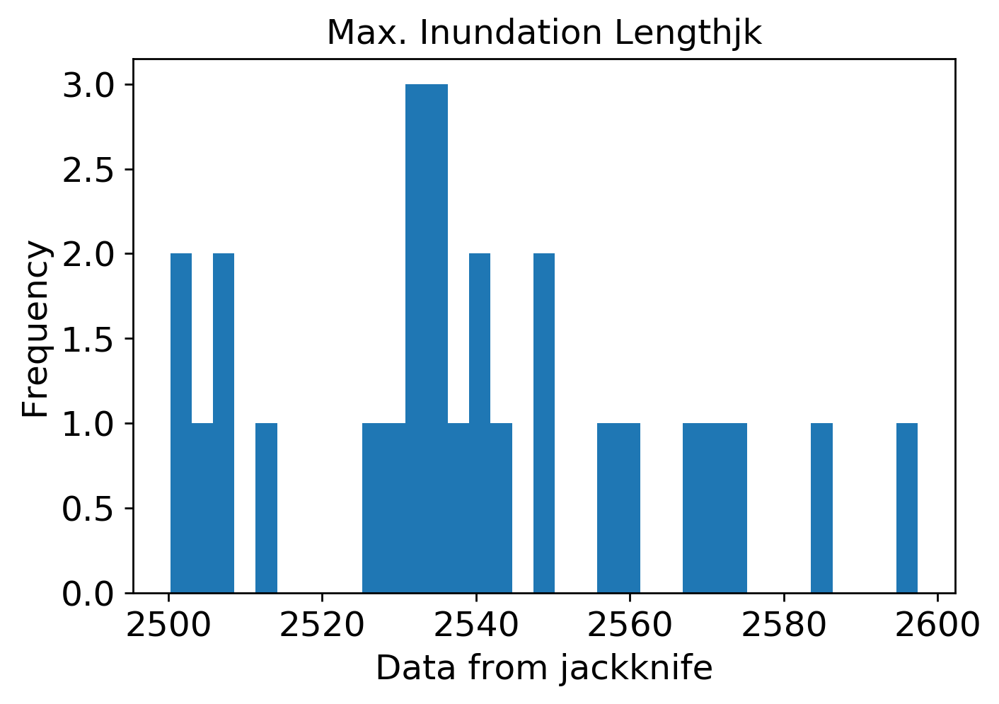

mean: 4.5040907928150755
jk_e: 0.05545478494294318


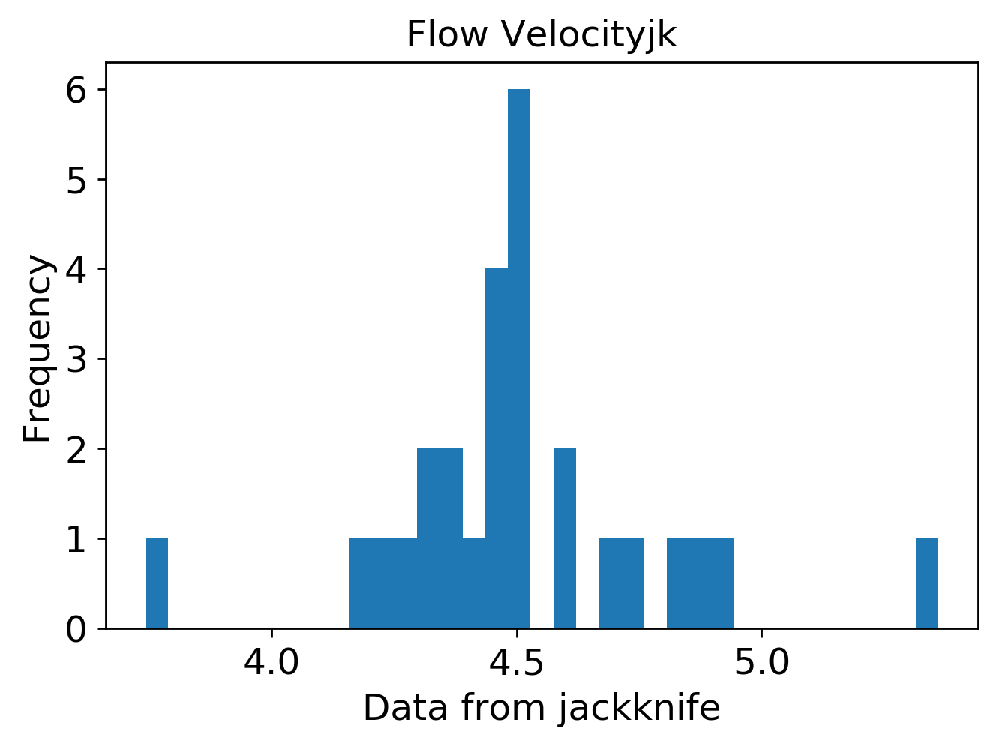

mean: 7.406596643802237
jk_e: 0.12348485214870385


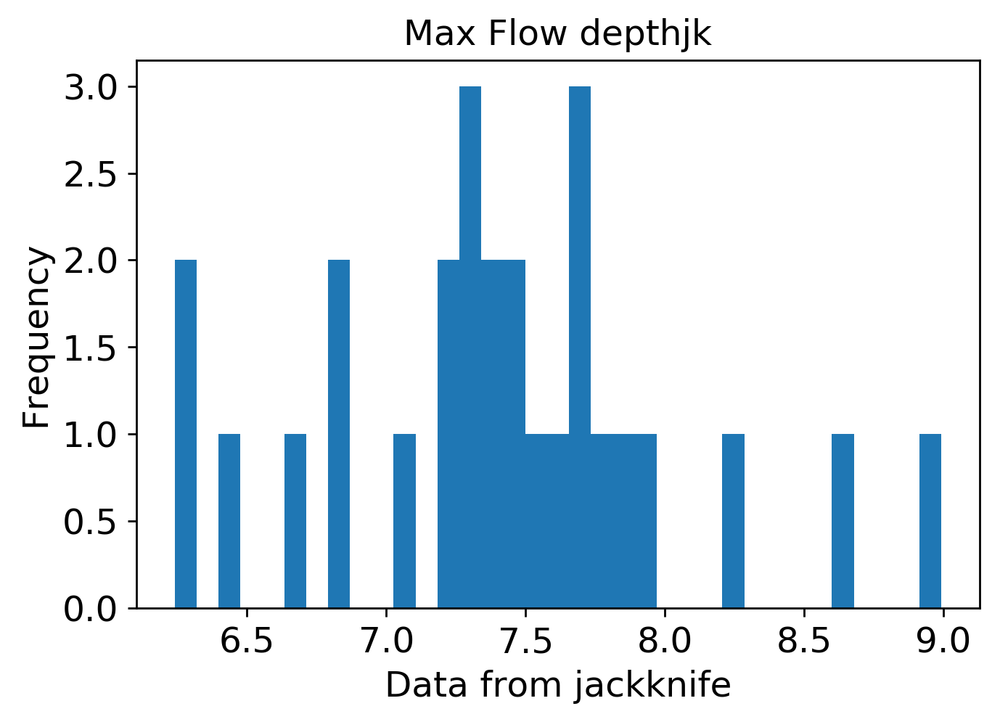

mean: 0.005230364934496696
jk_e: 0.00015860969373814873


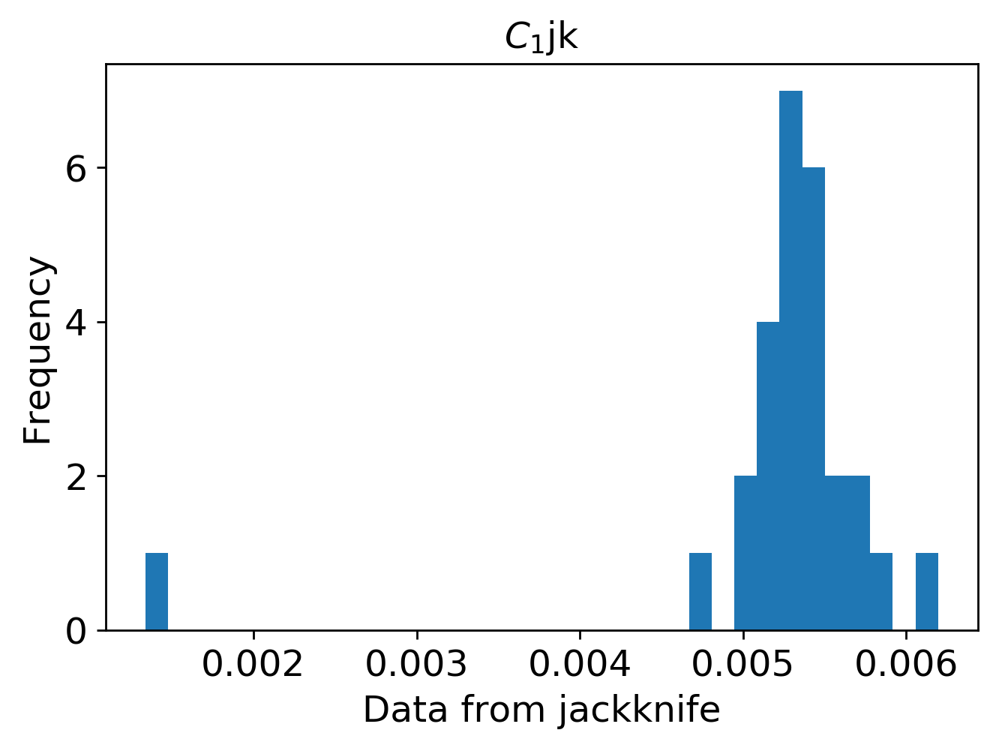

mean: 0.017453128523541868
jk_e: 0.0002395558533015401


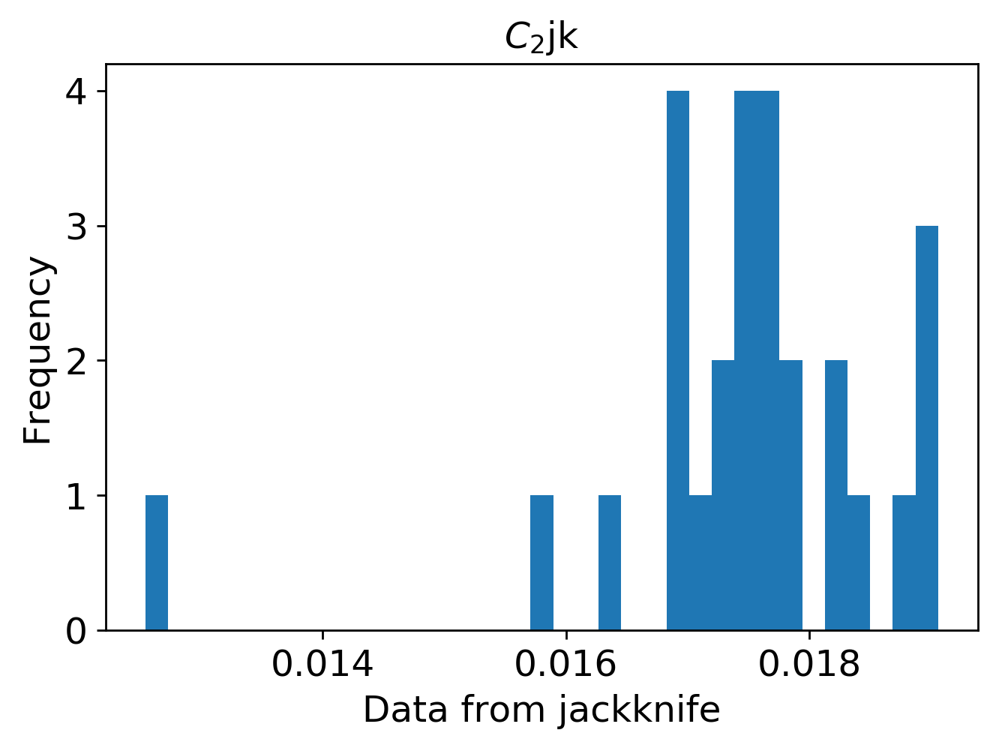

mean: 0.014087718400384773
jk_e: 0.0002868184510241754


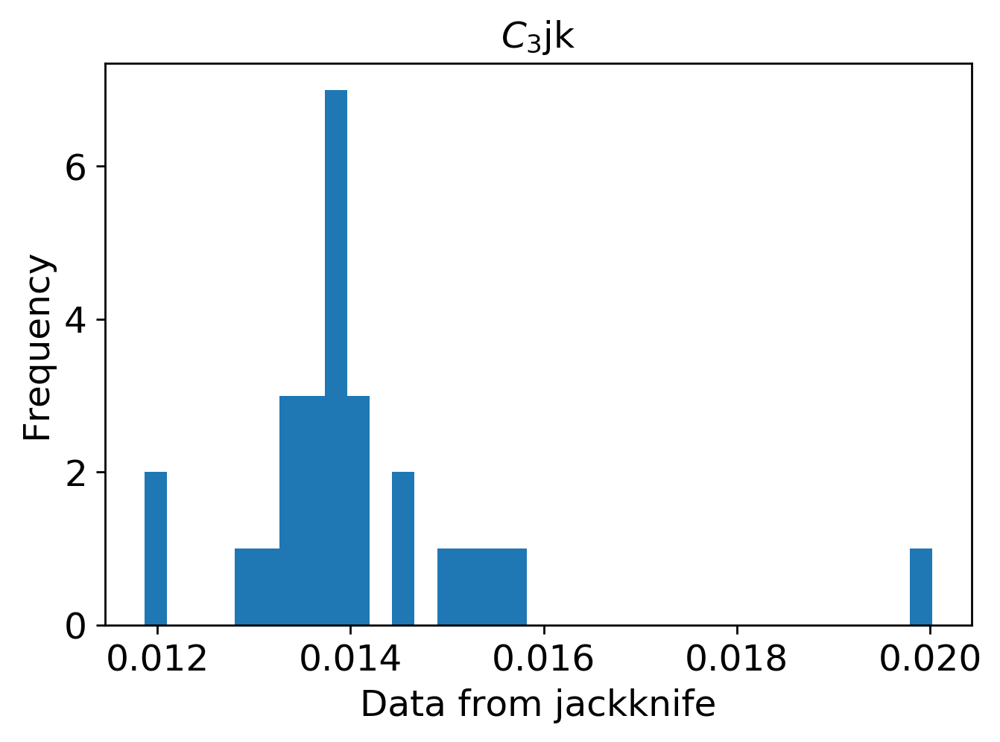

mean: 0.0006167146419043383
jk_e: 4.759473153988532e-05


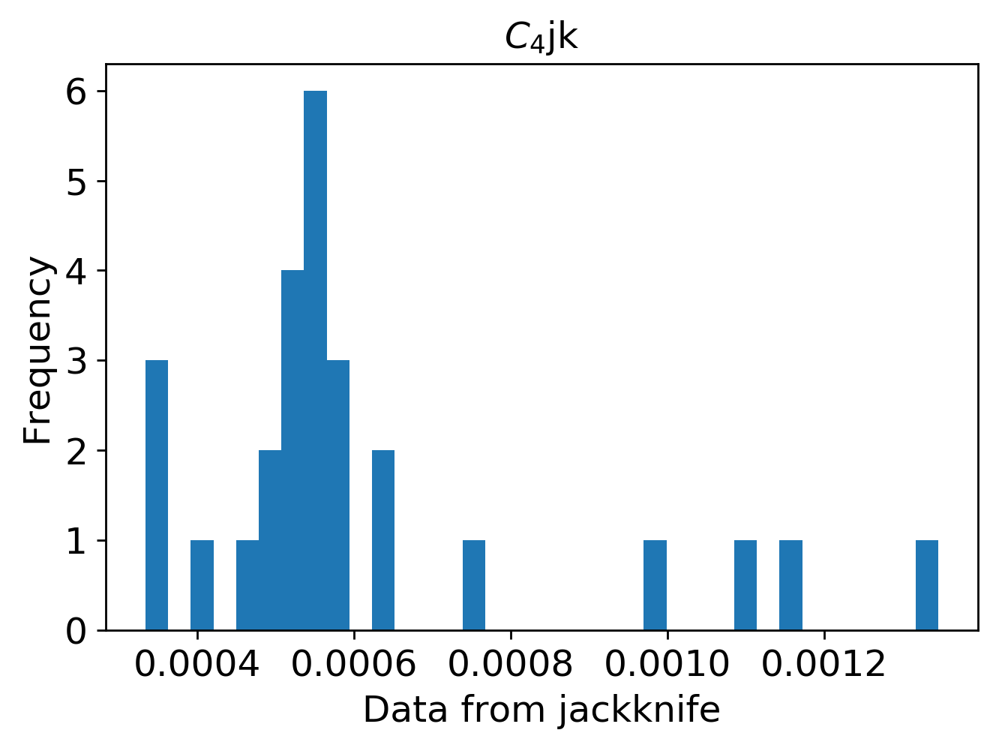

mean: 0.00010908757807378373
jk_e: 5.666116025138672e-06


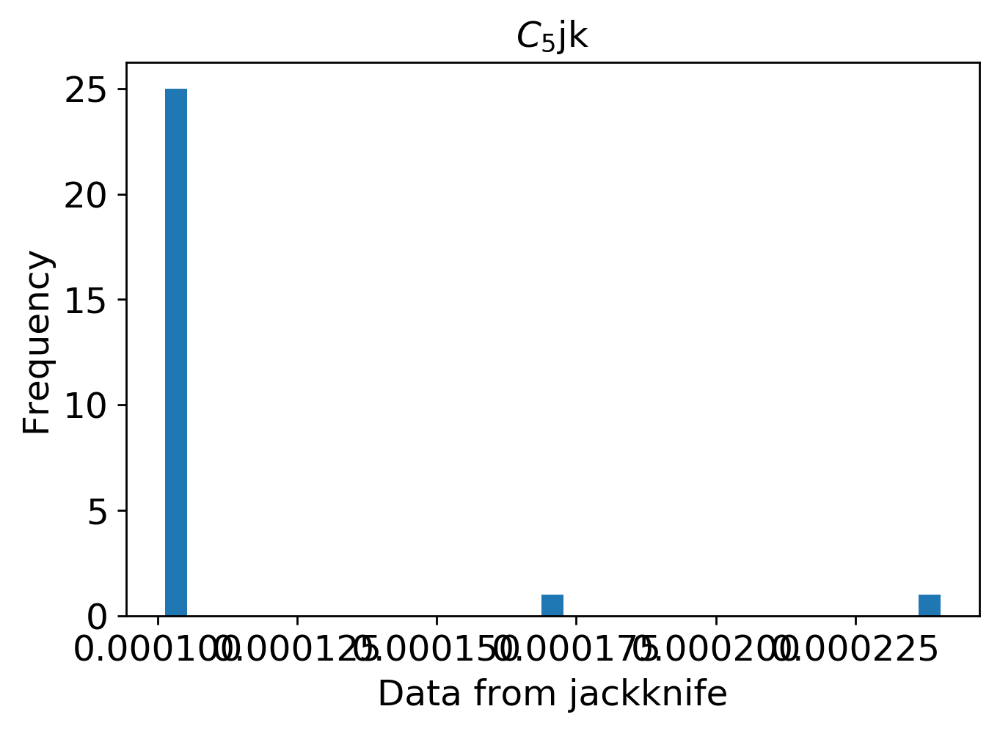

mean: 0.0009637550224271479
jk_e: 2.4759485294725176e-05


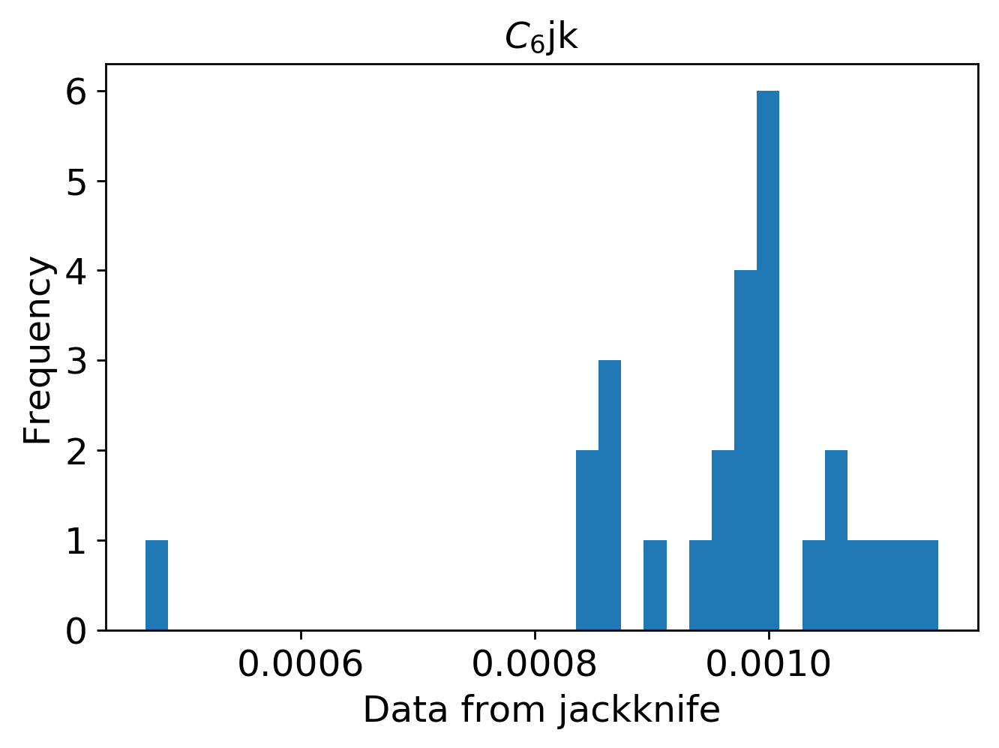

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2700/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2700/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2700.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2700.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2700.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2800

In [ ]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2800"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2800)
        
        
    

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2800/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2800/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


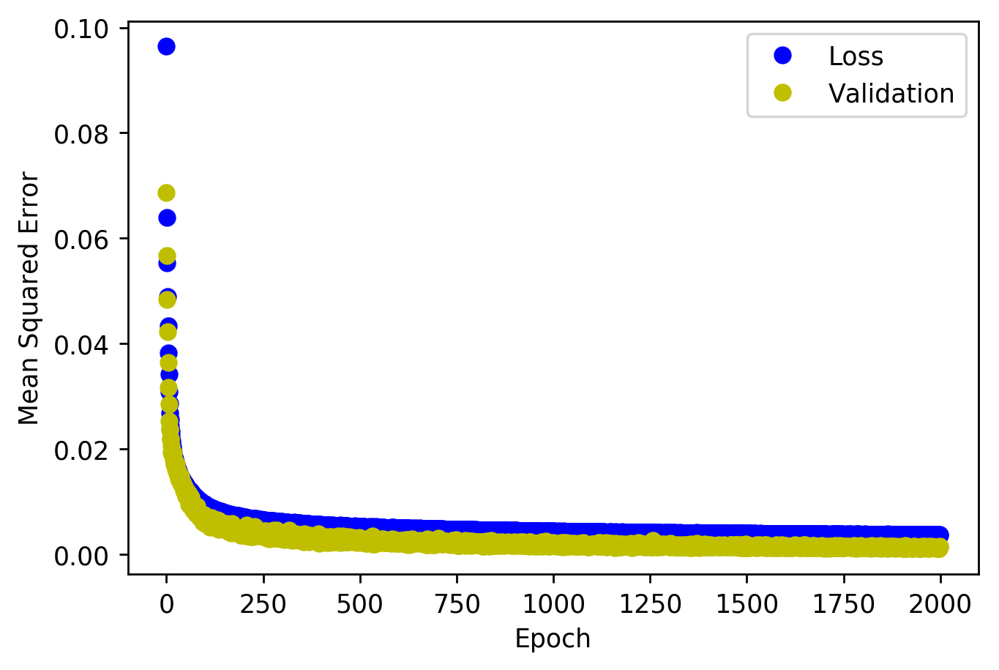

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


<Figure size 432x288 with 0 Axes>

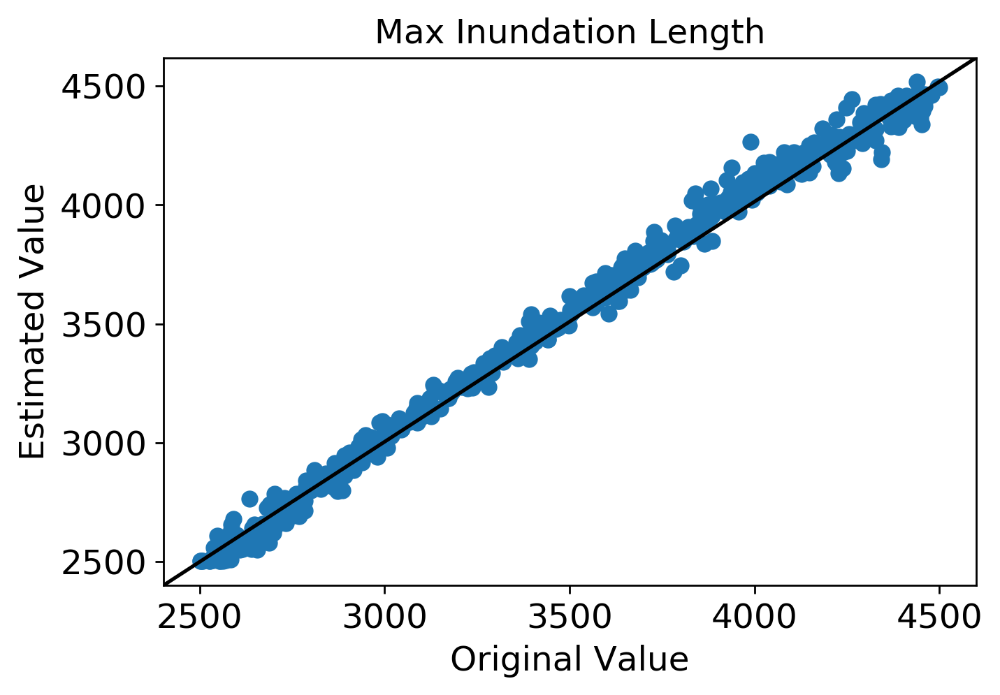

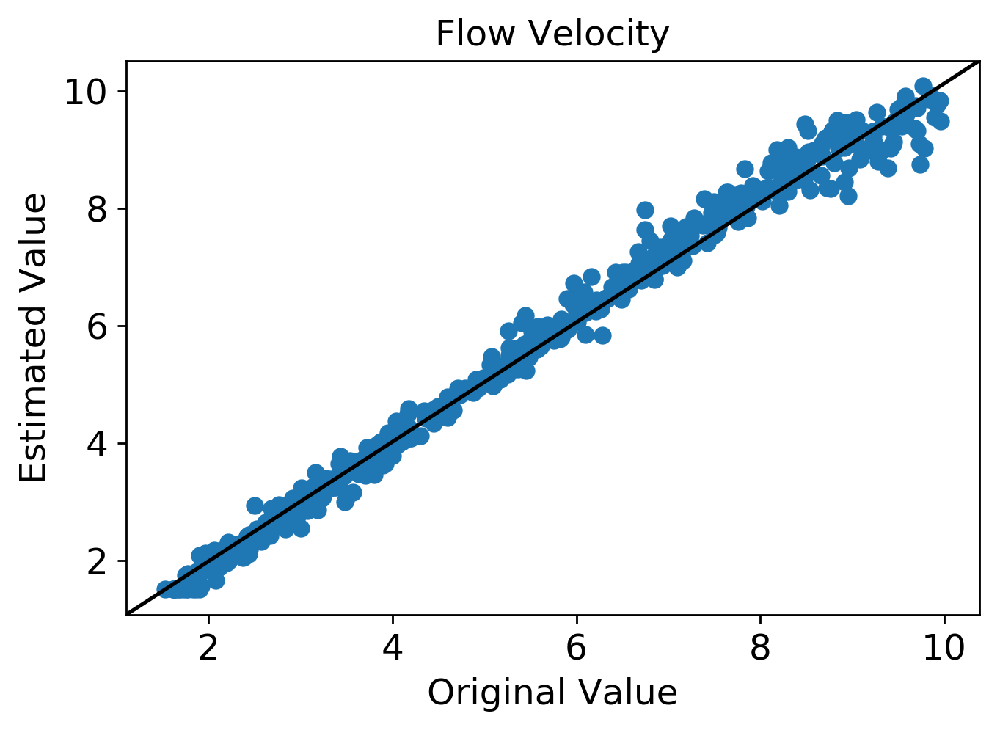

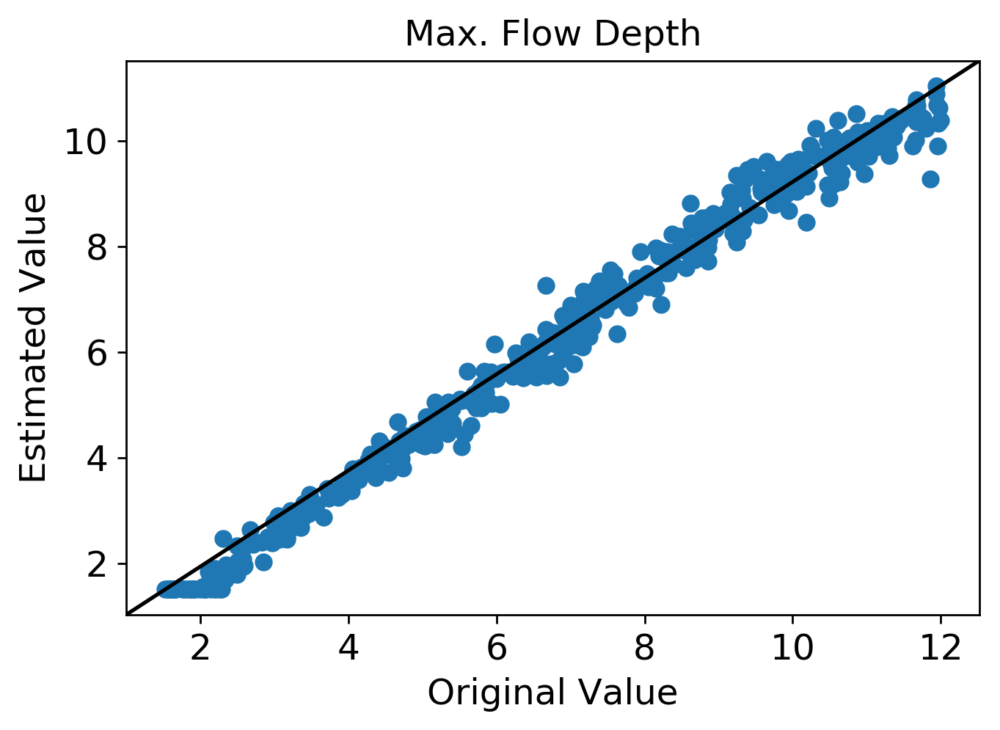

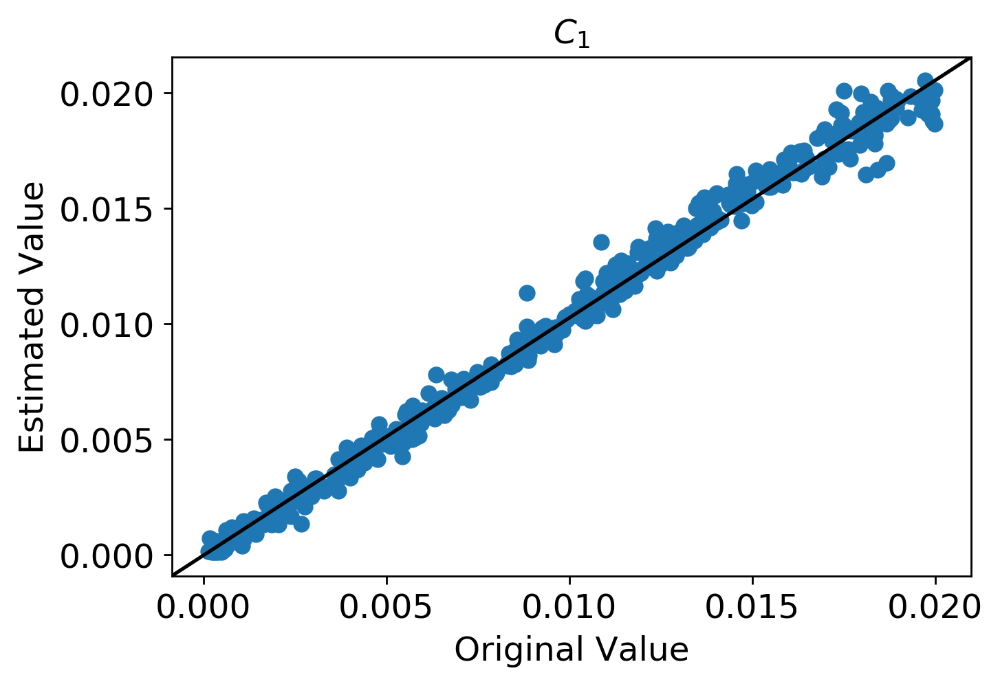

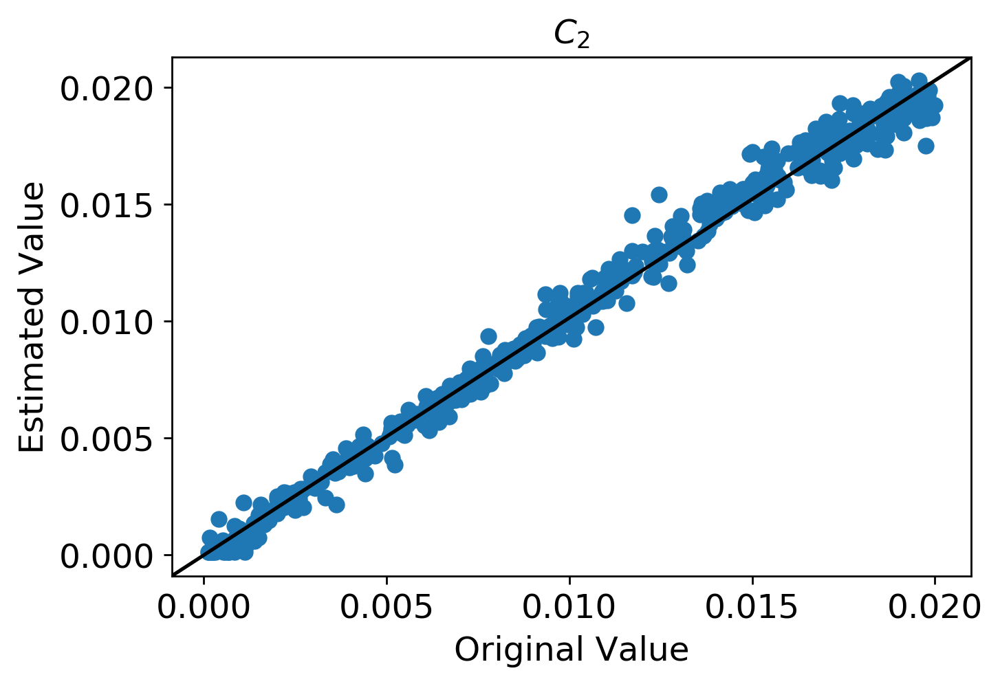

...

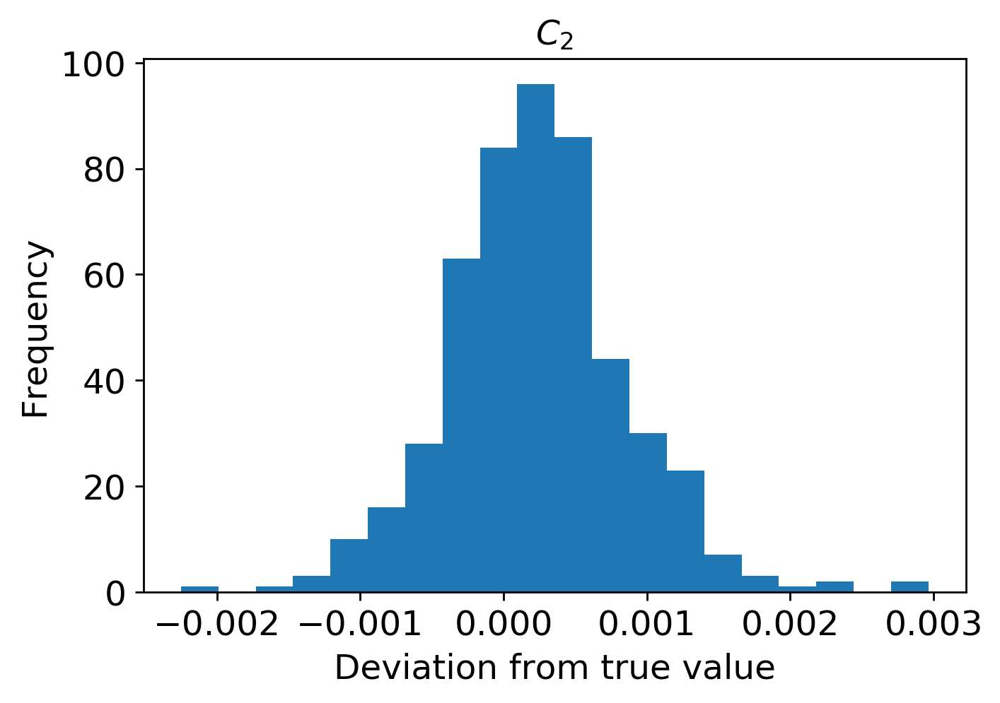

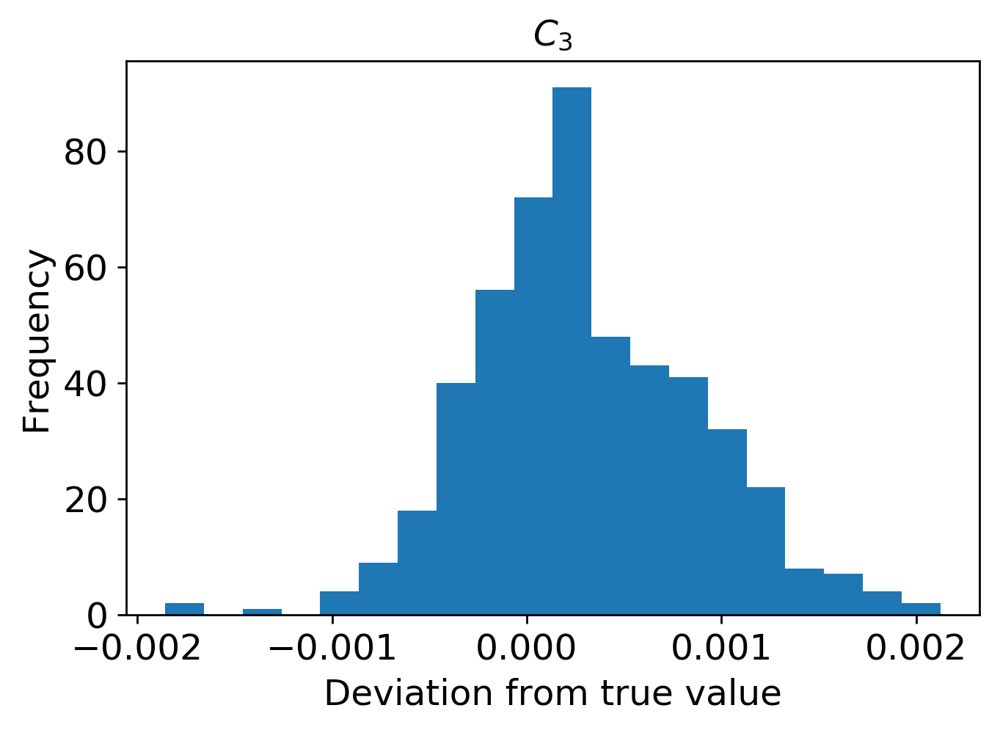

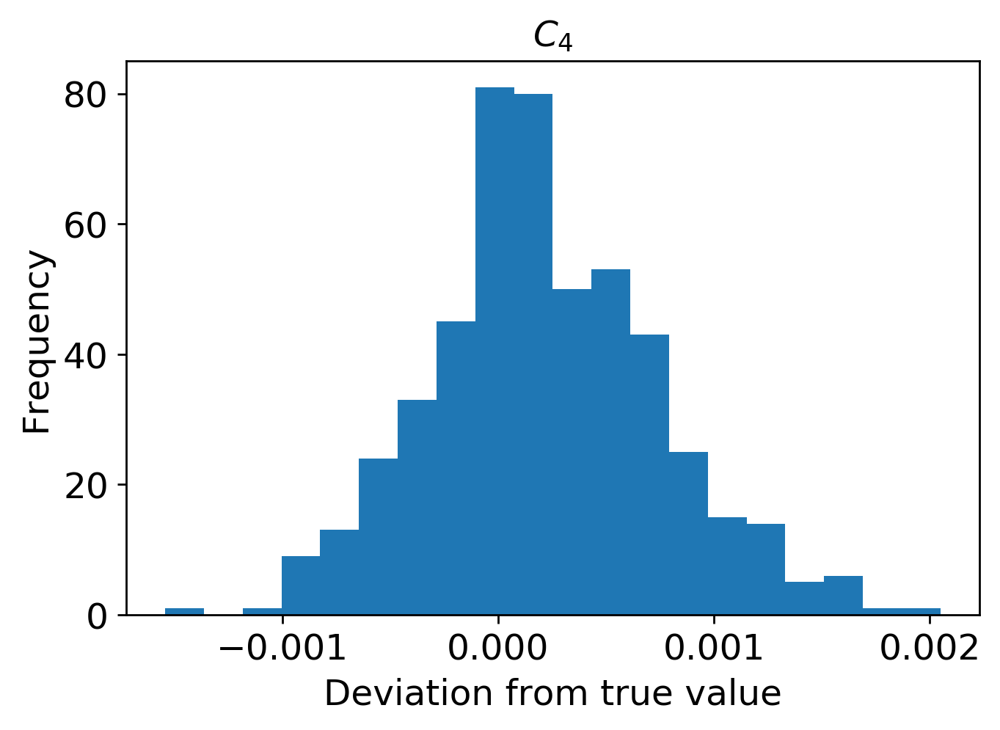

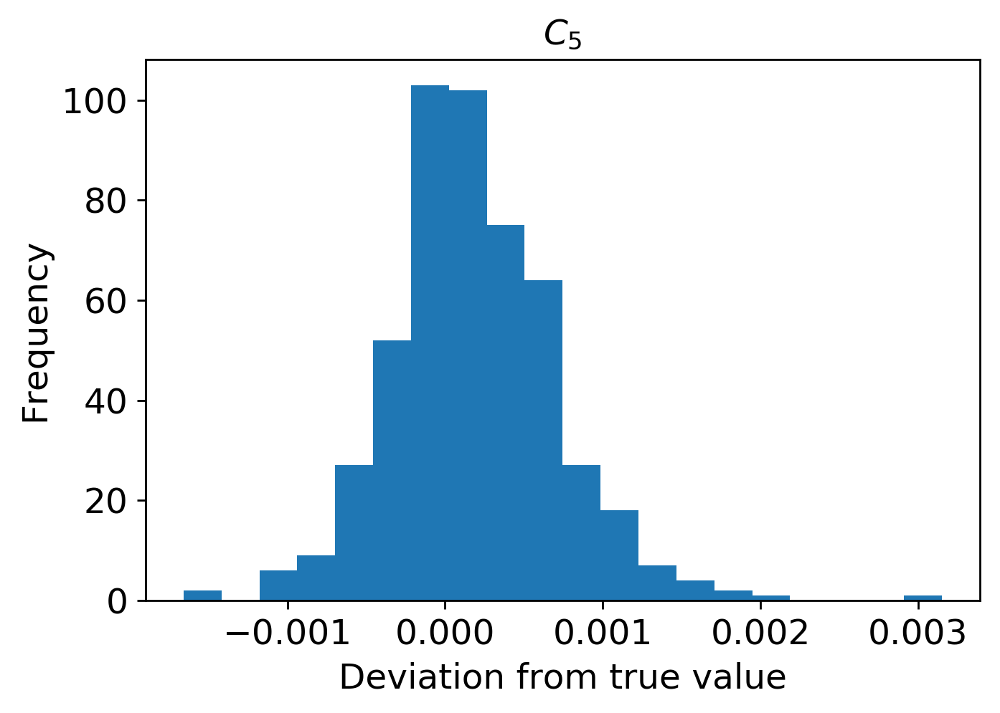

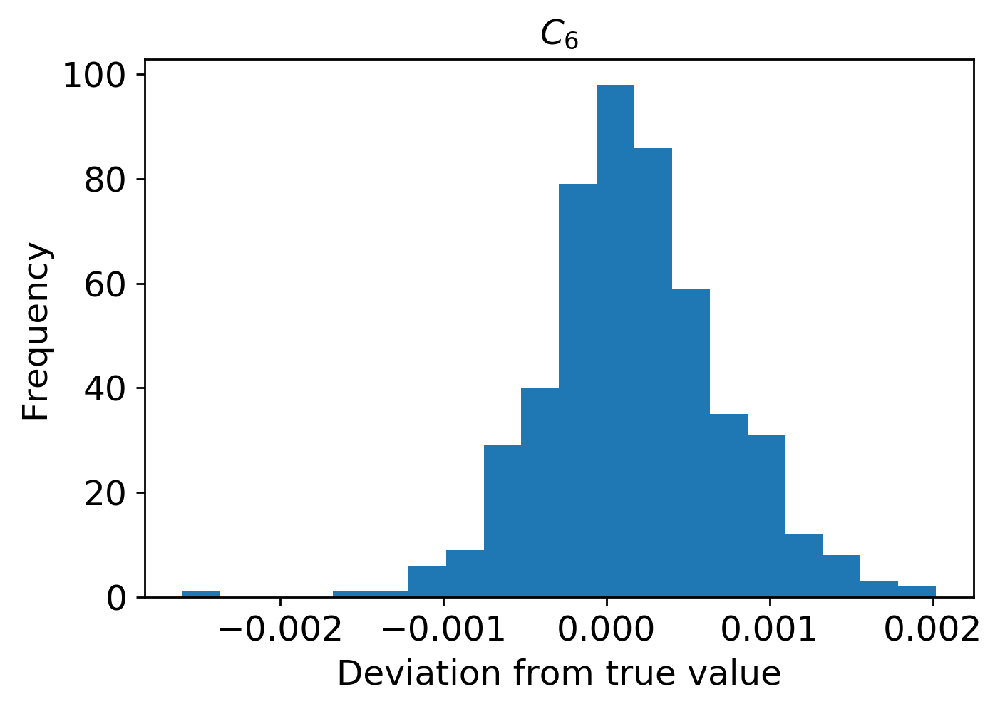

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2800/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

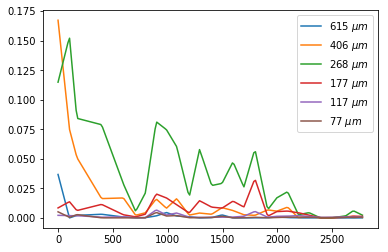

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2800/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2800.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



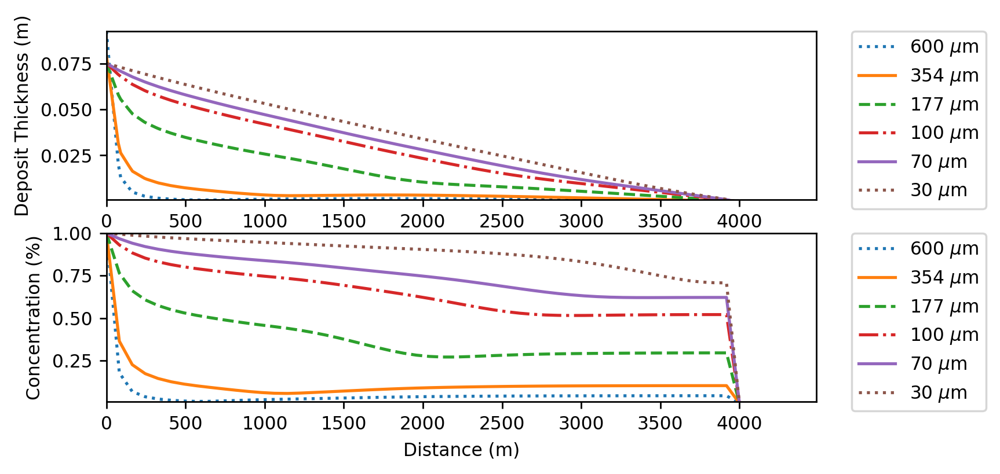

(5000, 9)
(5000, 1800)


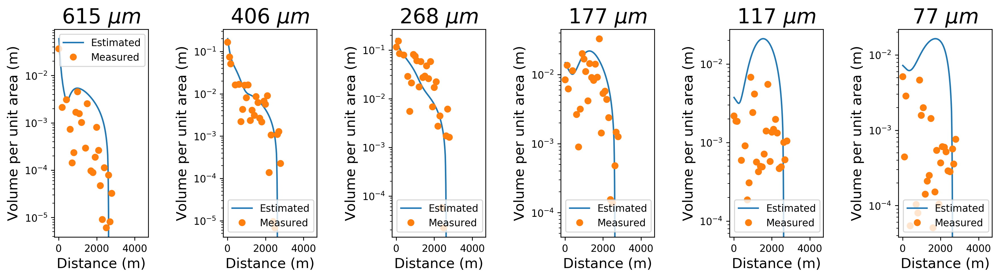

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2800.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2800.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2800.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2800.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2800.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2800.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2800.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2800.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


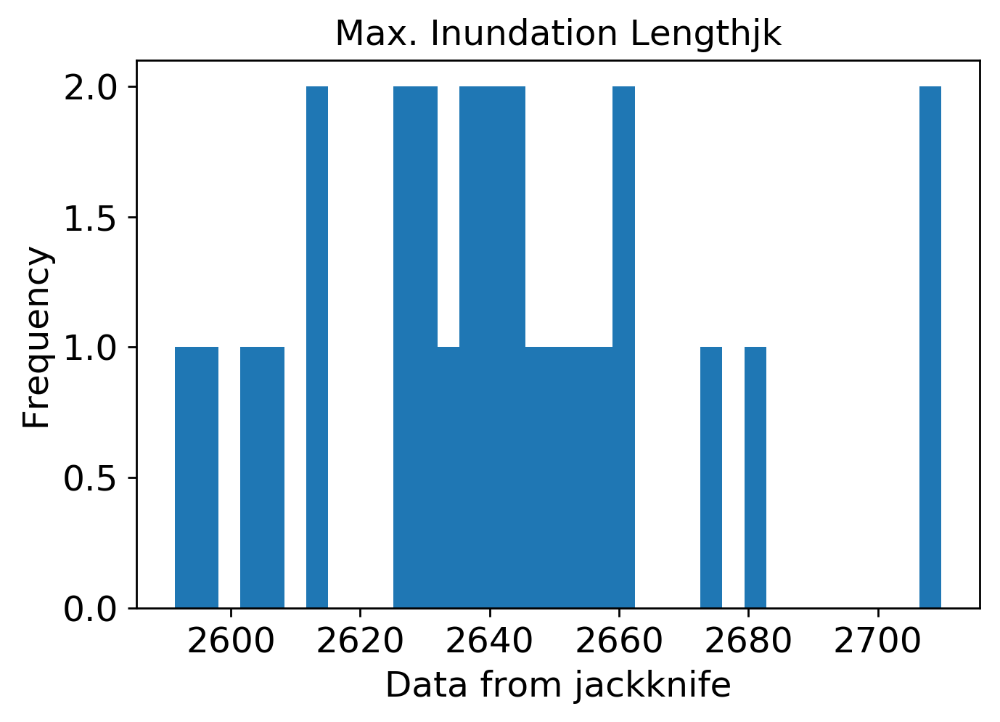

mean: 4.621512745772792
jk_e: 0.06423151105045517


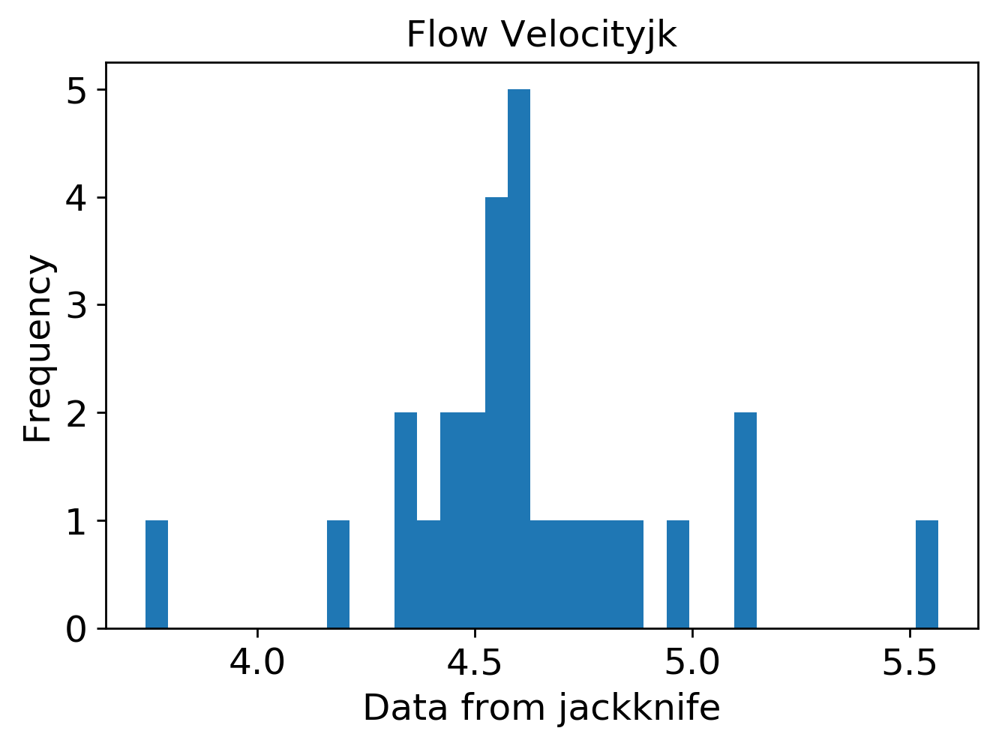

mean: 7.413693552265681
jk_e: 0.1339552710884892


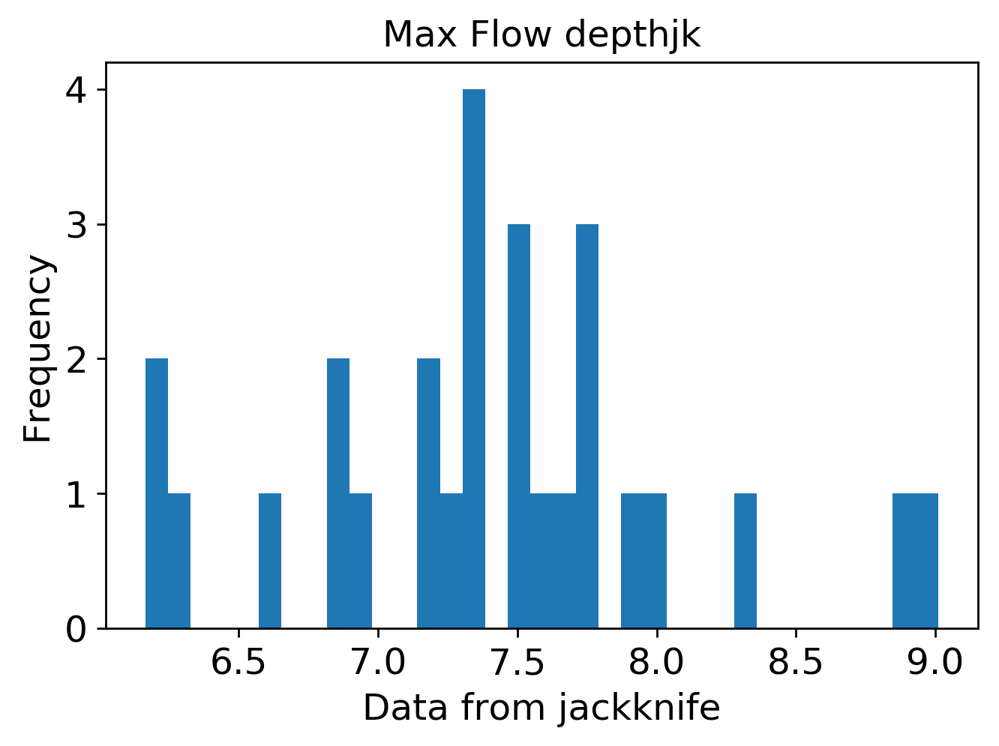

mean: 0.005548834686985603
jk_e: 0.00014151892412283894


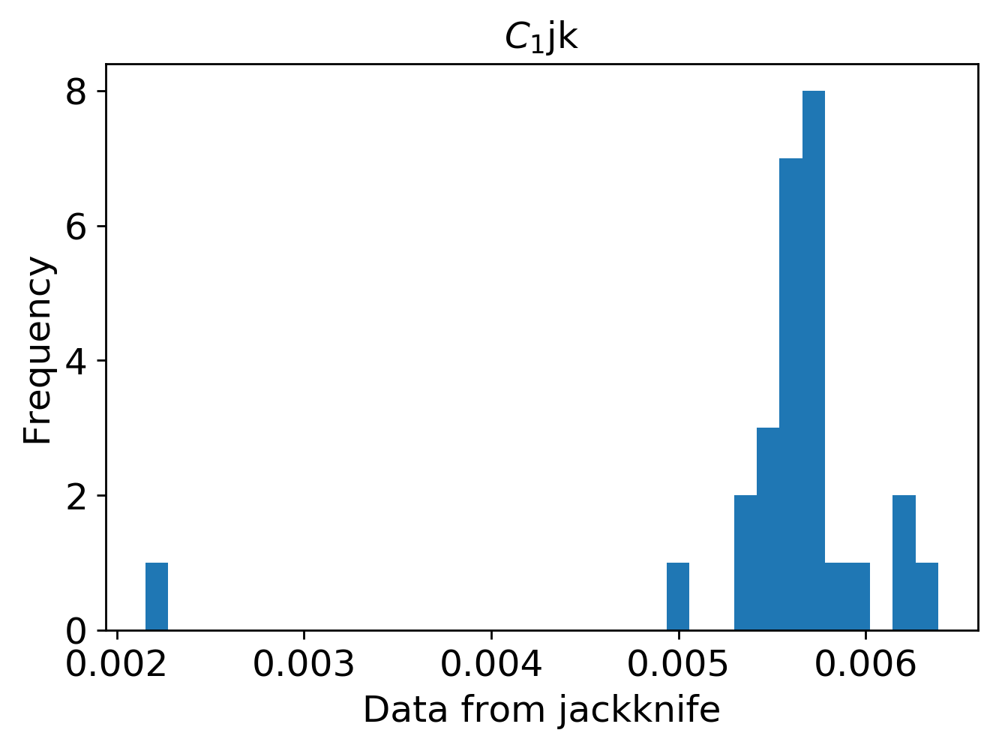

mean: 0.017794349129432185
jk_e: 0.0002442944632011978


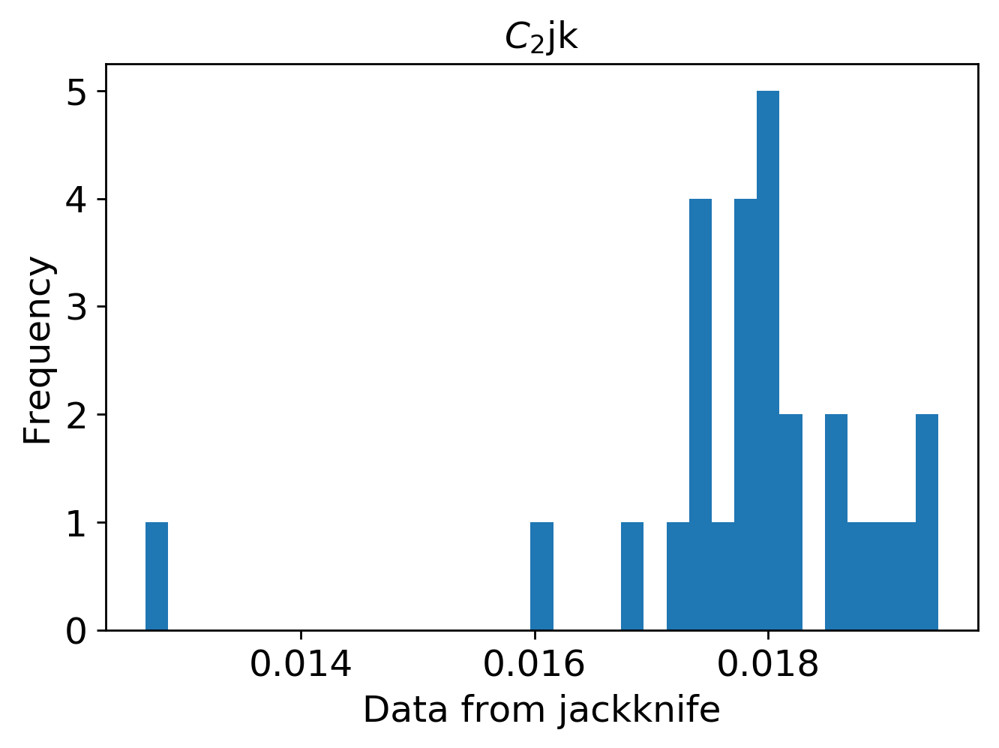

mean: 0.014724807808144795
jk_e: 0.0002823541447405452


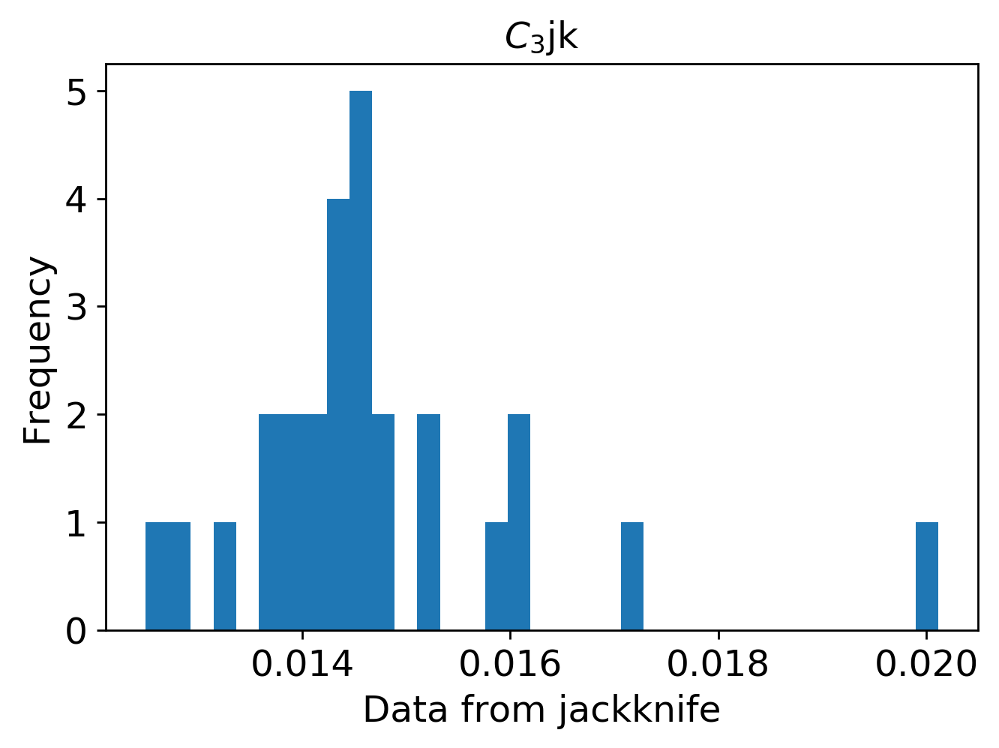

mean: 0.0012736266945653088
jk_e: 3.097205457158663e-05


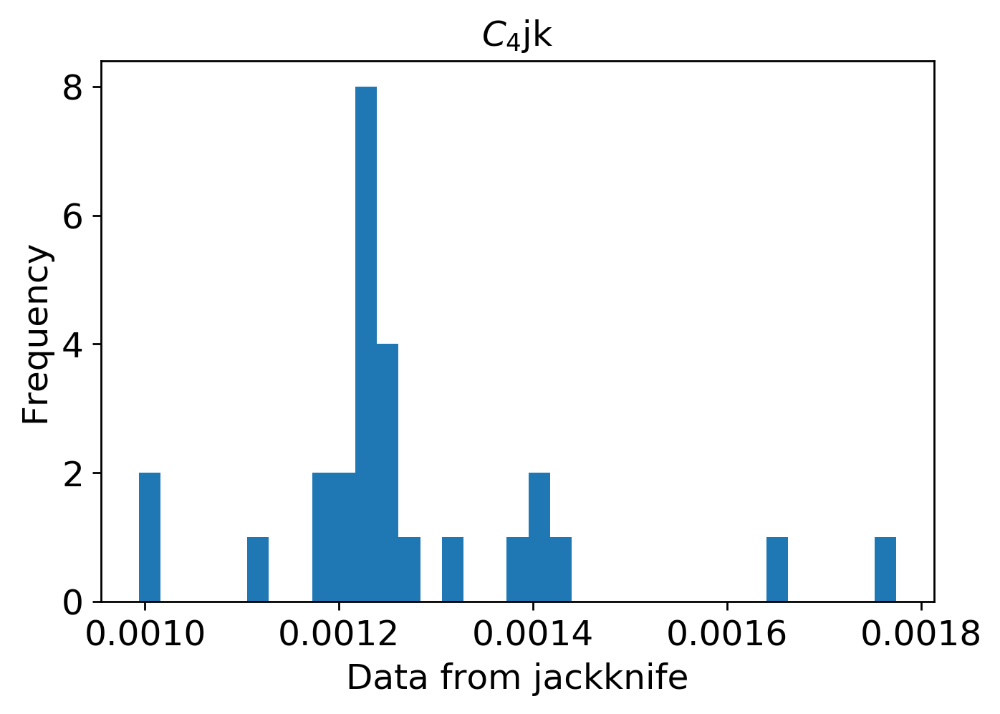

mean: 0.0002935807217577568
jk_e: 1.5040582676937077e-05


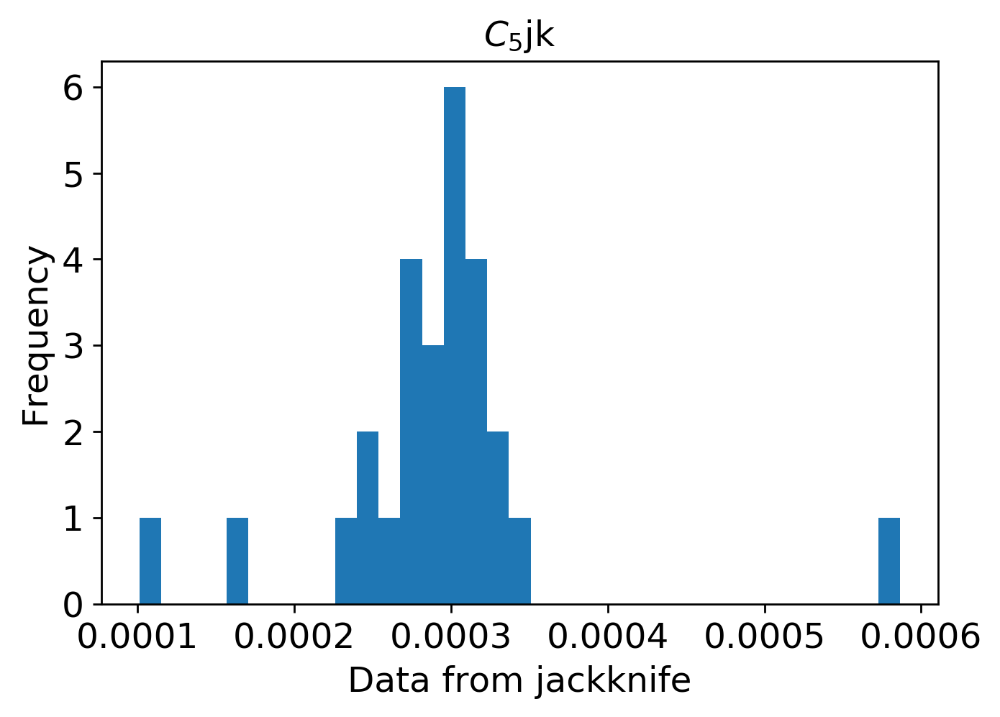

mean: 0.0006064759418600512
jk_e: 2.0397246954712313e-05


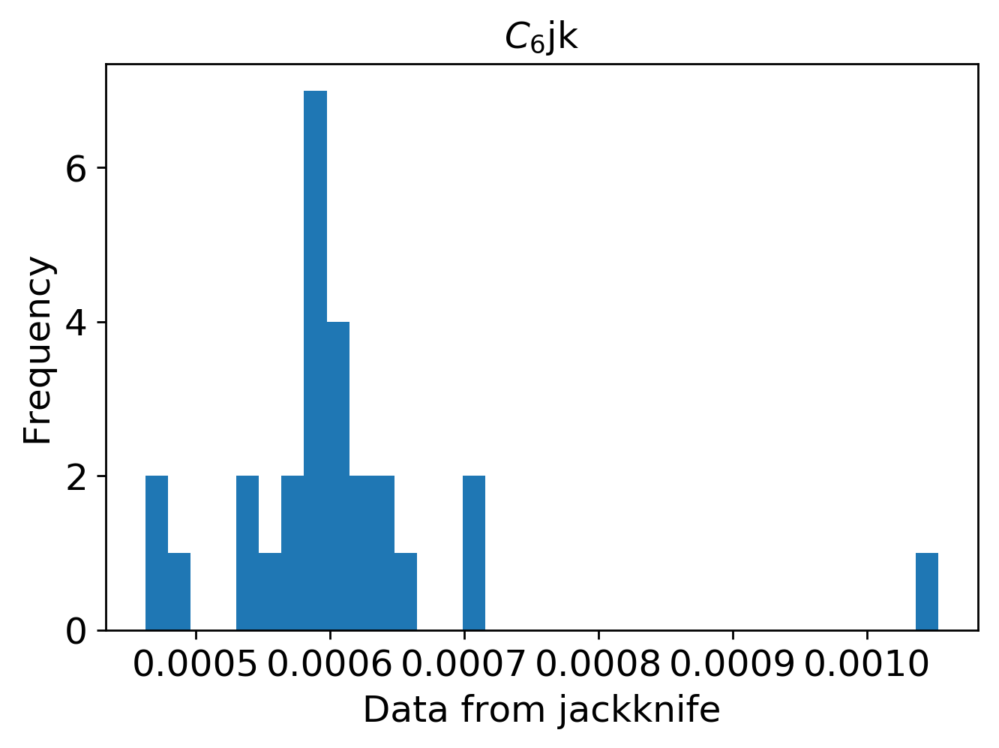

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2800/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2800.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2800.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2800.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 2900 

In [1]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2900"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2900)
        
        
    

In [2]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2900/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2900/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




Using TensorFlow backend.


Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 664us/step - loss: 0.0956 - mean_squared_error: 0.0956 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 2/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 3/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 4/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 5/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0348 - val_mean_squared_error: 0.0348
Epoch 6/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0377 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 367us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0124 - val_mean_squared_error: 0.0124
Epoch 50/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0121 - val_mean_squared_error: 0.0121
Epoch 51/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 52/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 53/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 54/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0103 - val_mean_squared_error: 0.0103


3600/3600 [==============================] - 1s 358us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 98/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 99/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 100/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 101/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 102/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0063 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 357us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 146/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 147/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 148/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 149/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 150/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0043 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 354us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 194/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 195/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 196/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 197/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 198/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0053 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 356us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 242/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 243/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 244/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 245/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 246/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0033 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 363us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 290/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 291/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 292/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 293/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 294/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0031 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 370us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 338/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 339/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 340/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 341/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 342/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 368us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 386/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 387/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 388/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 389/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 390/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 369us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 434/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 435/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 436/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 437/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 438/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 372us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 482/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 483/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 484/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 485/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 486/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0022 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 378us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 530/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 531/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 532/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 533/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 534/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 375us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 578/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 579/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 580/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 581/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 582/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 360us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 626/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 627/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 628/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 629/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 630/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 357us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 674/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 675/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 676/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 677/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 678/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 366us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 722/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 723/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 724/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 725/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 726/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0019 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 367us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 770/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 771/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 772/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 773/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 774/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 365us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 818/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 819/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 820/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 821/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 822/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 372us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 866/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 867/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 868/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 869/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 870/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 356us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 914/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 915/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 916/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 917/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 918/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 361us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 962/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 963/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 964/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 965/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 966/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 364us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1010/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1011/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1012/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1013/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1014/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1058/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1059/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1060/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1061/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1062/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 376us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1106/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1107/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1108/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1109/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1110/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 365us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1154/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1155/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1156/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1157/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1158/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1202/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1203/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1204/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1205/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1206/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1250/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1251/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1252/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1253/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1254/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 357us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1298/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1299/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1300/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1301/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1302/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_erro

3600/3600 [==============================] - 1s 370us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1346/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1347/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1348/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1349/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1350/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 366us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1394/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1395/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1396/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1397/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1398/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 364us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1442/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1443/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1444/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1445/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1446/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 356us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1490/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1491/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1492/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1493/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1494/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 359us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1538/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1539/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1540/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1541/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1542/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 364us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1586/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1587/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1588/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1589/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1590/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 370us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1634/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1635/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1636/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1637/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1638/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 359us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1682/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1683/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1684/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1685/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1686/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_erro

3600/3600 [==============================] - 1s 363us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1730/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1731/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1732/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1733/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1734/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1778/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 1779/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1780/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1781/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1782/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 372us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1826/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1827/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1828/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1829/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 1830/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1874/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1875/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1876/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1877/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1878/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_erro

3600/3600 [==============================] - 1s 366us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1922/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1923/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1924/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1925/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1926/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 1970/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1971/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1972/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 1973/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1974/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model


(500, 9)


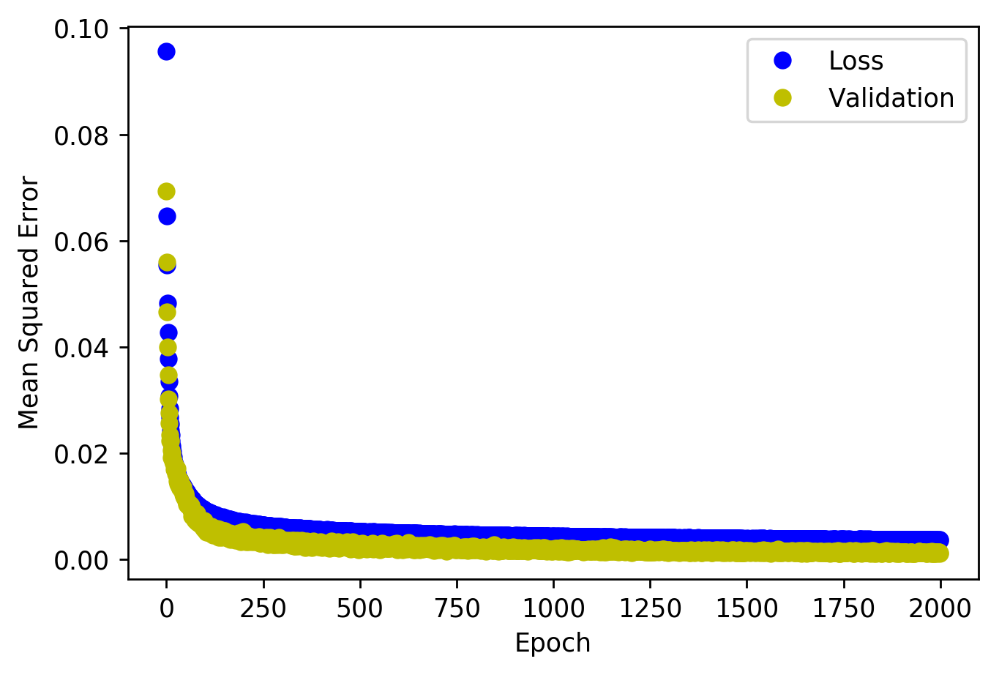

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


<Figure size 432x288 with 0 Axes>

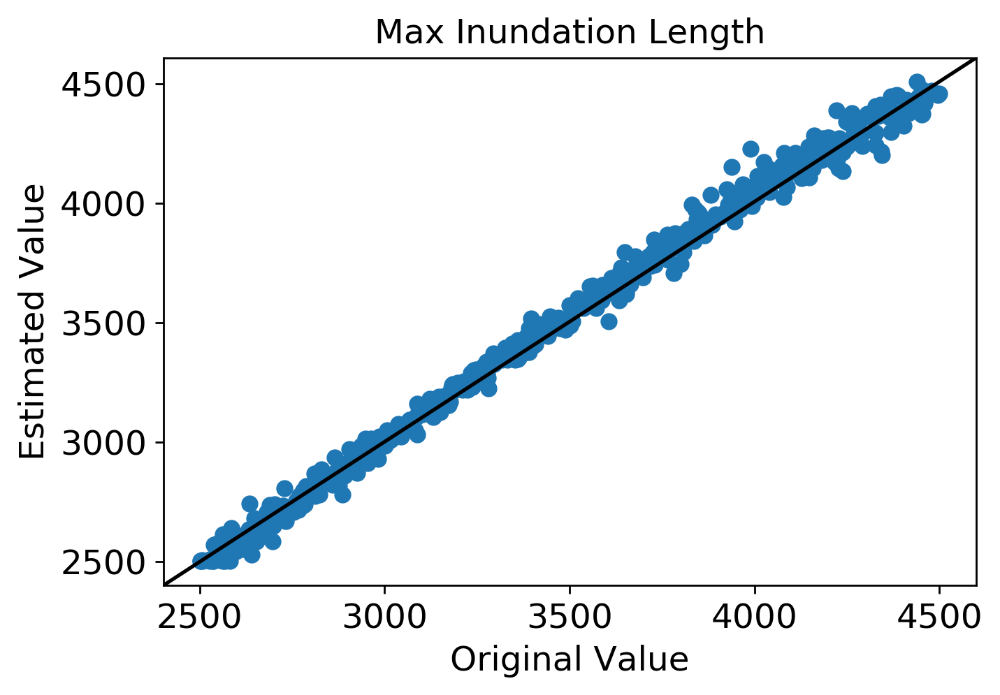

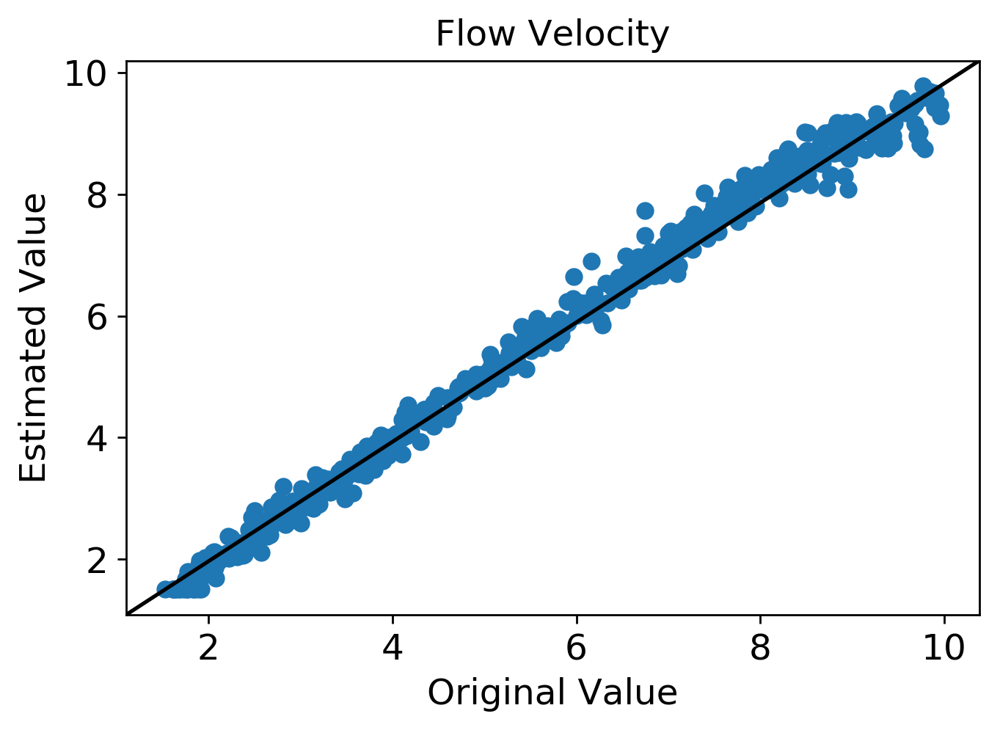

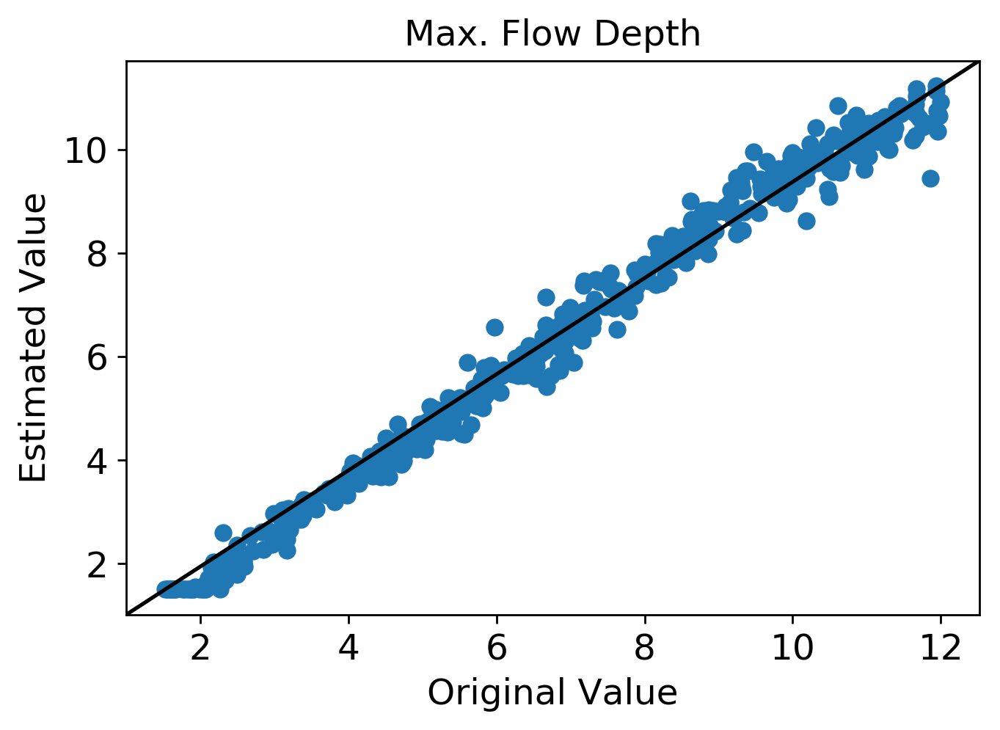

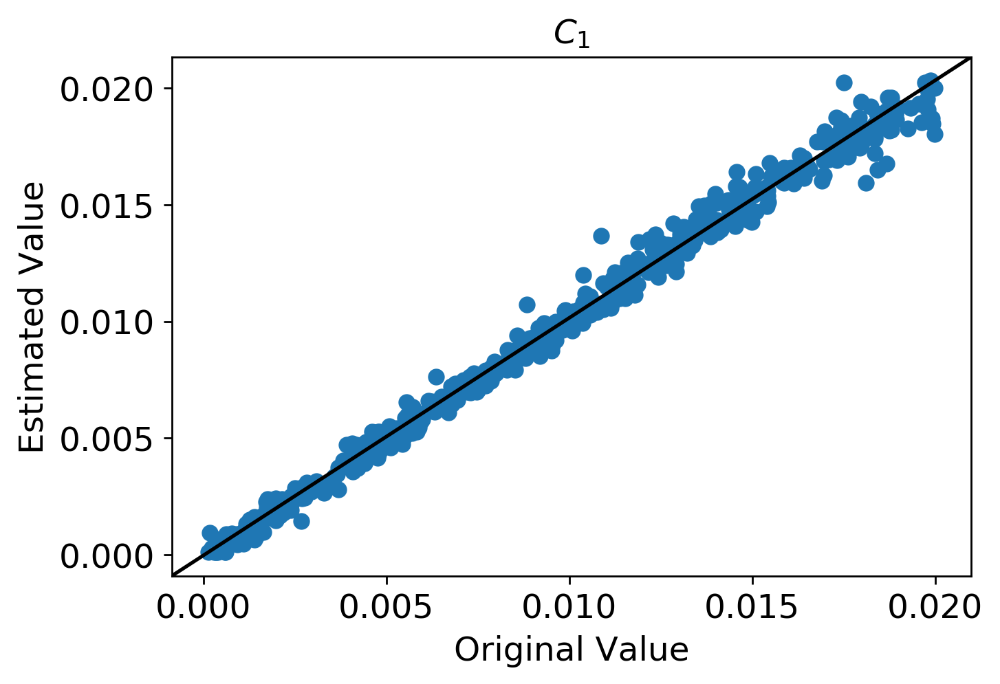

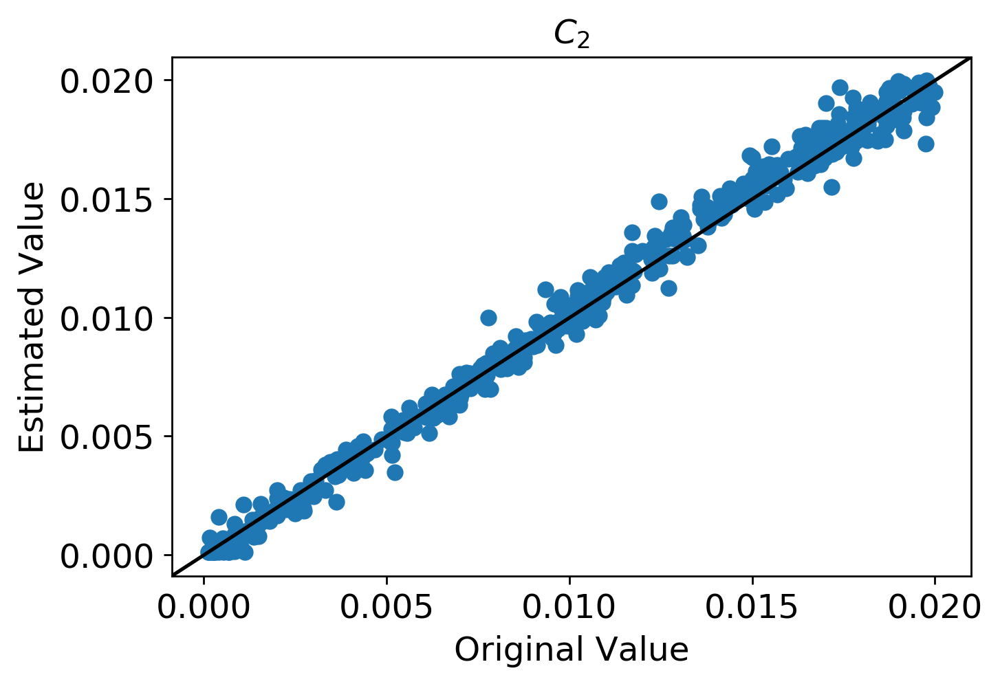

...

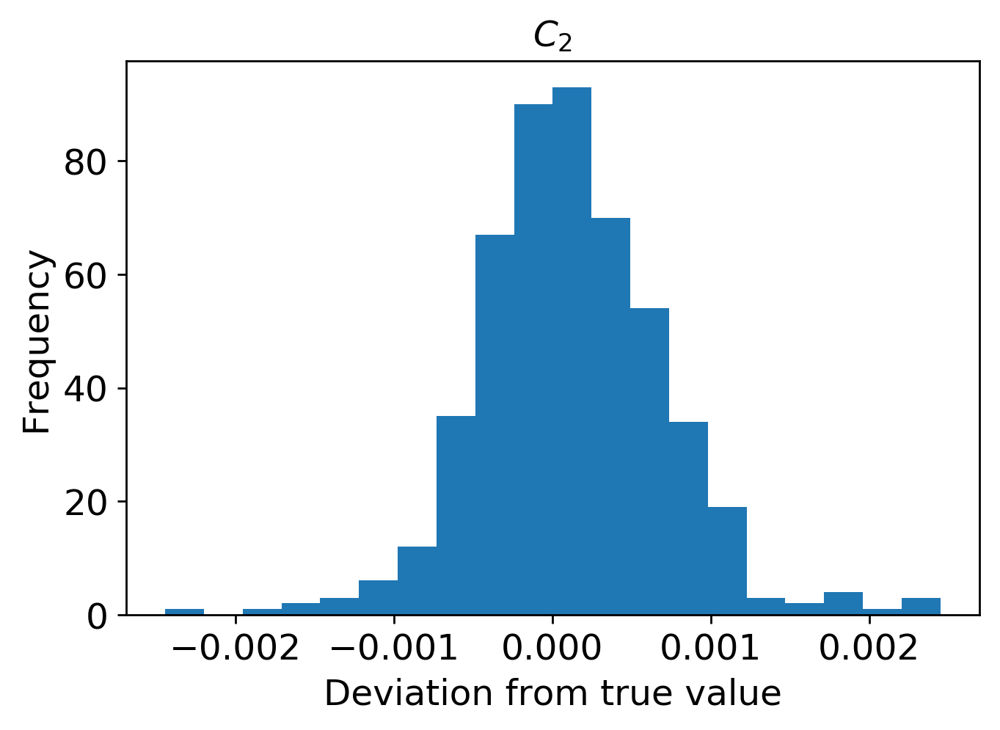

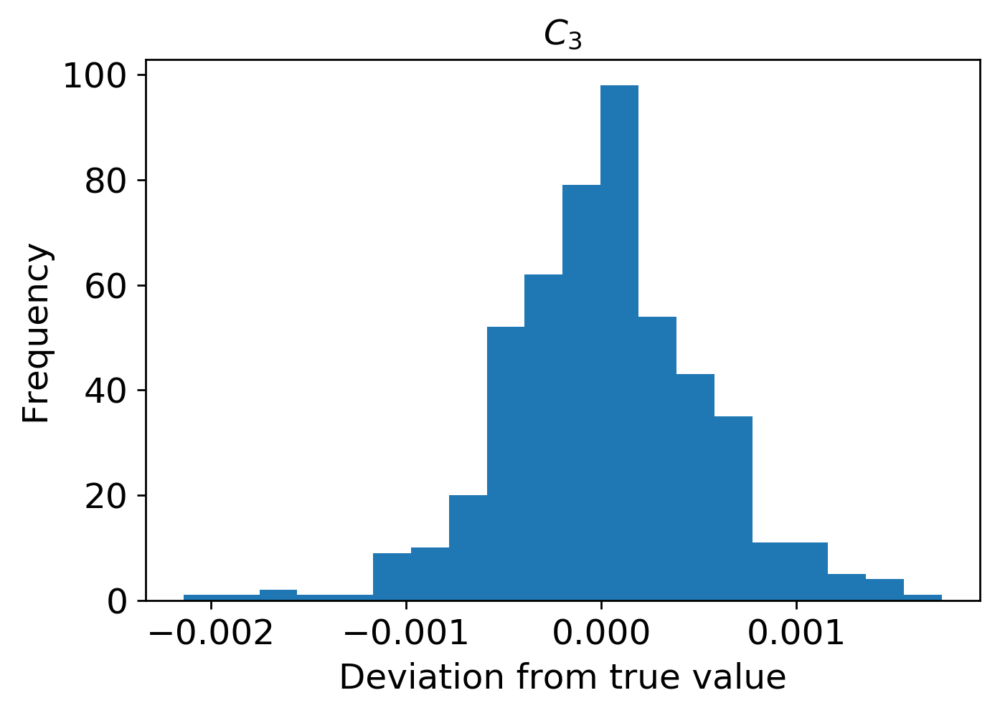

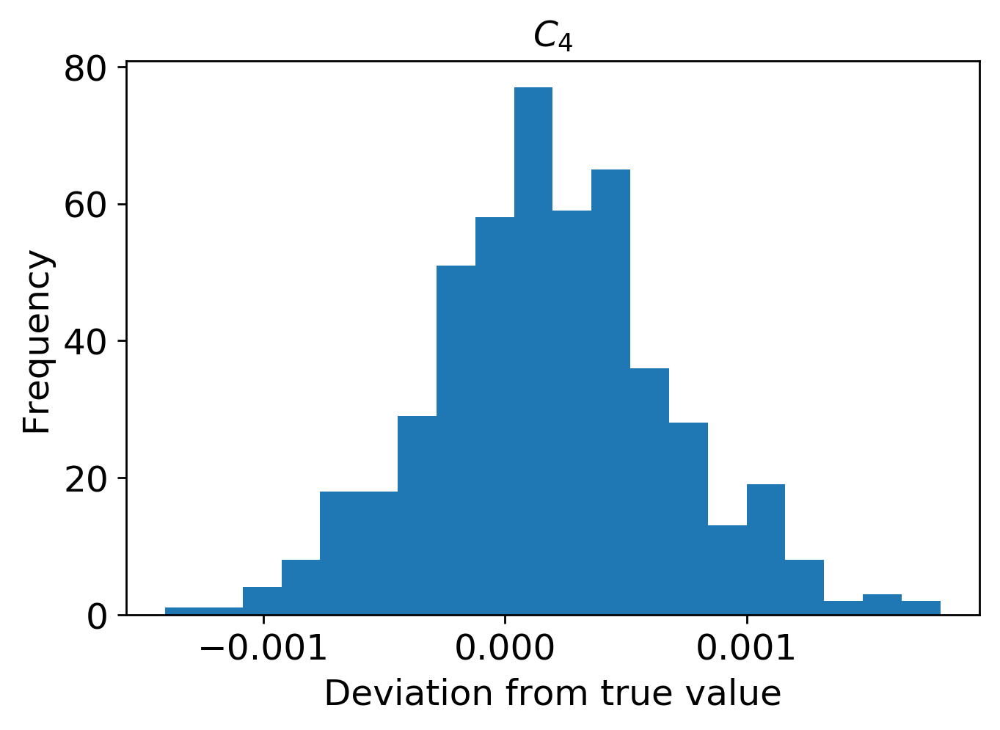

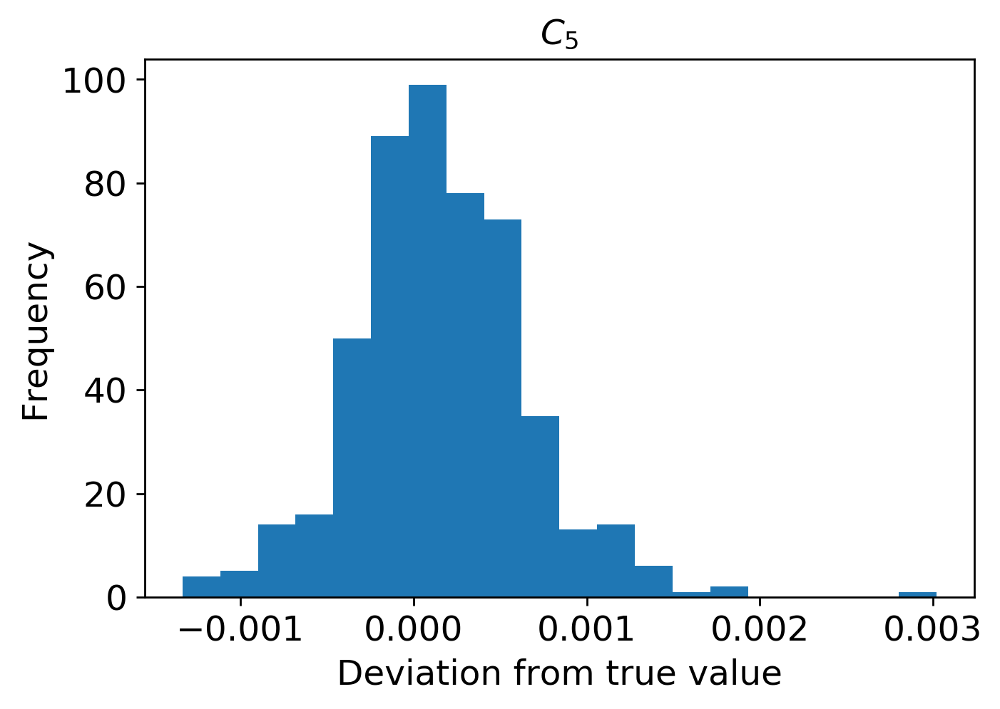

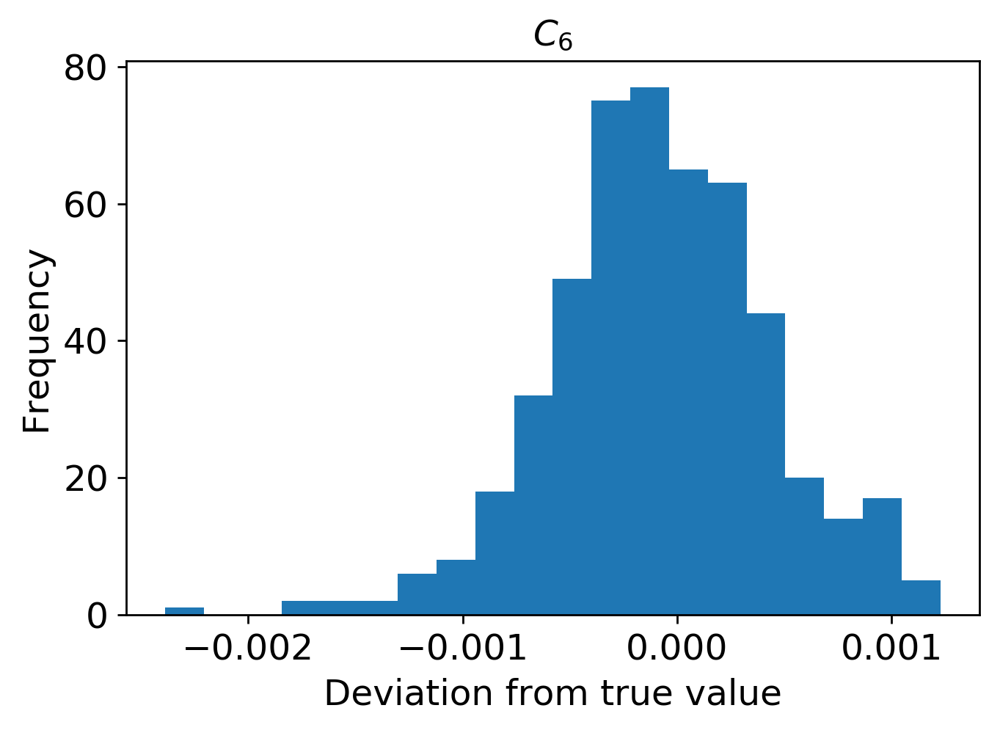

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2900/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

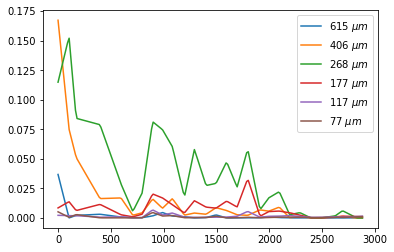

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2900/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi2900.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



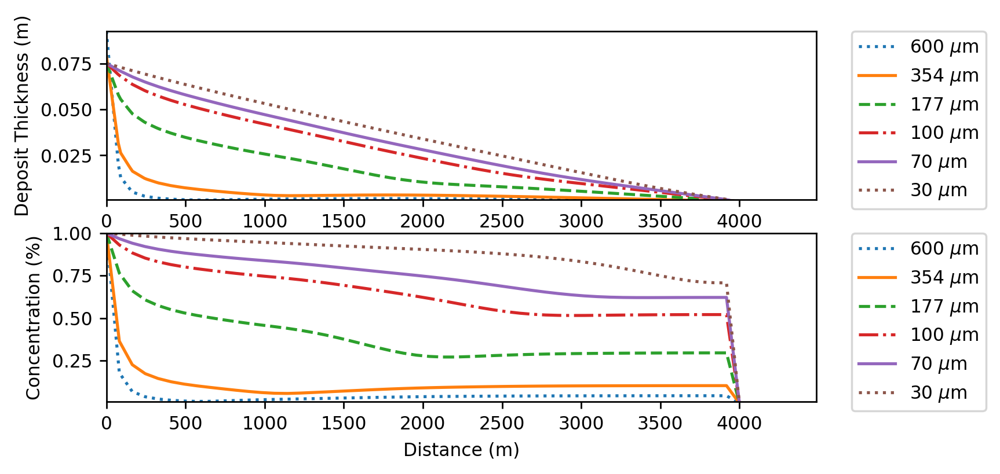

(5000, 9)
(5000, 1800)


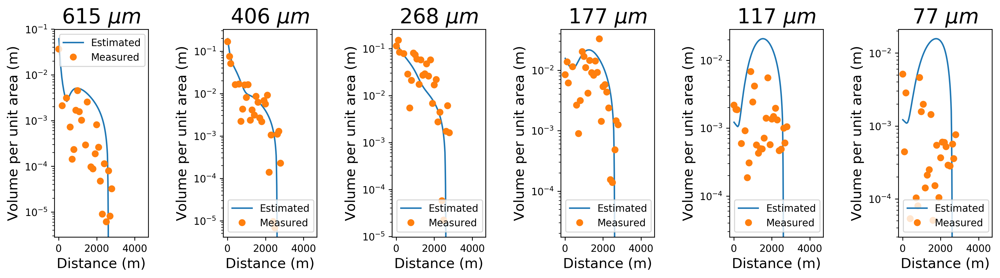

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi2900.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2900.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2900.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2900.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2900.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi2900.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2900.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi2900.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


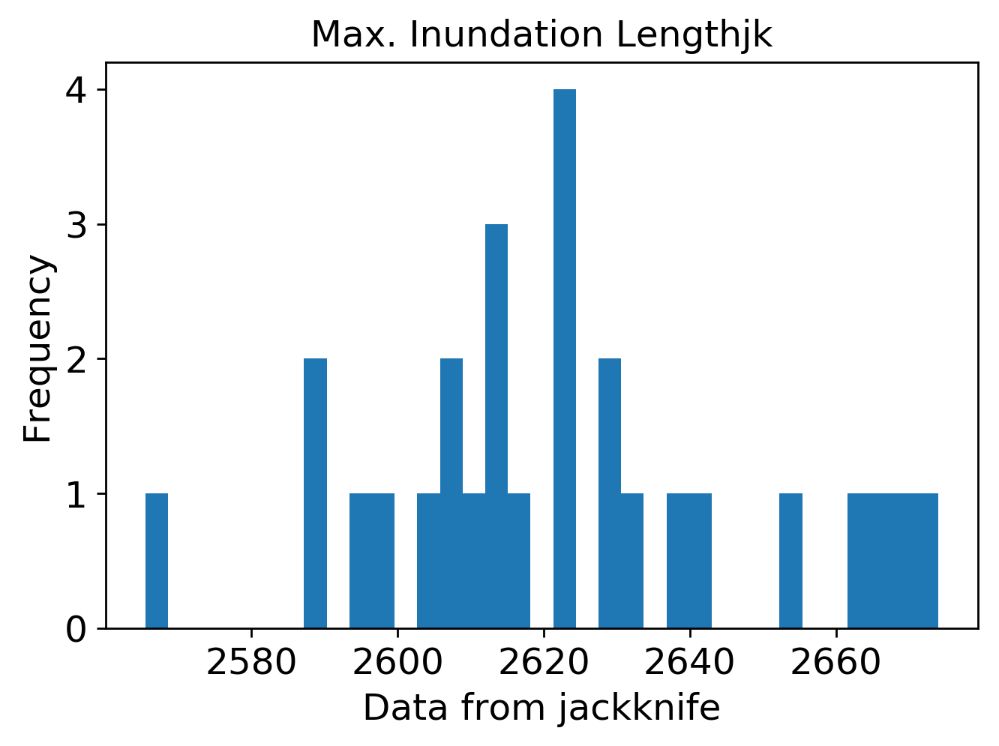

mean: 4.478287238858713
jk_e: 0.05338335381114168


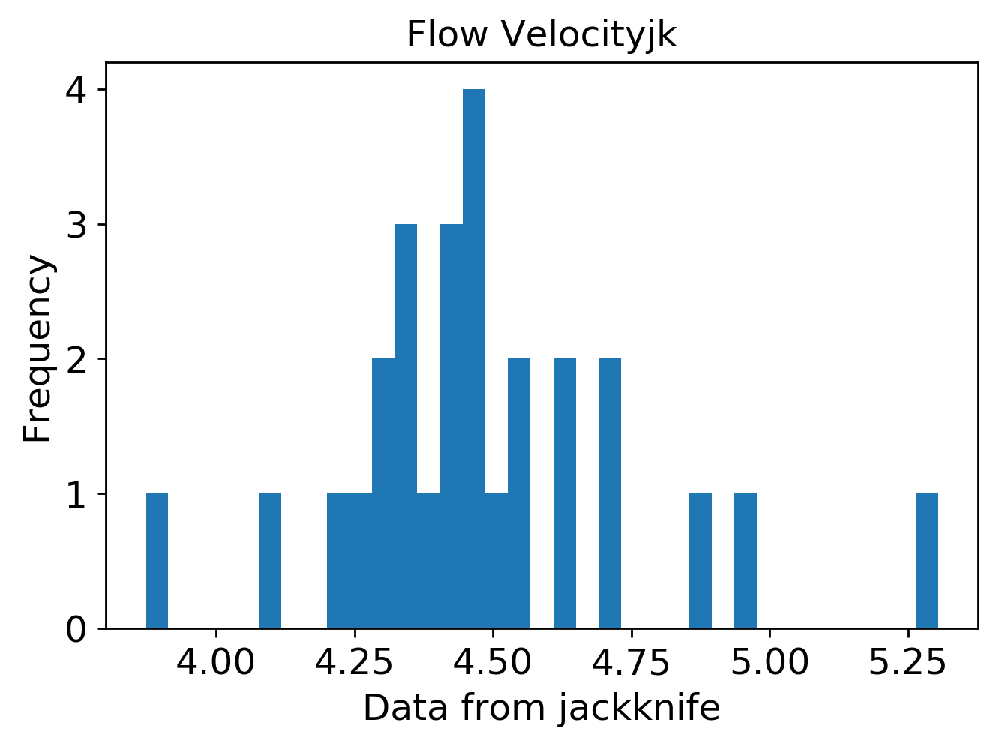

mean: 7.276693241483074
jk_e: 0.11840352025597124


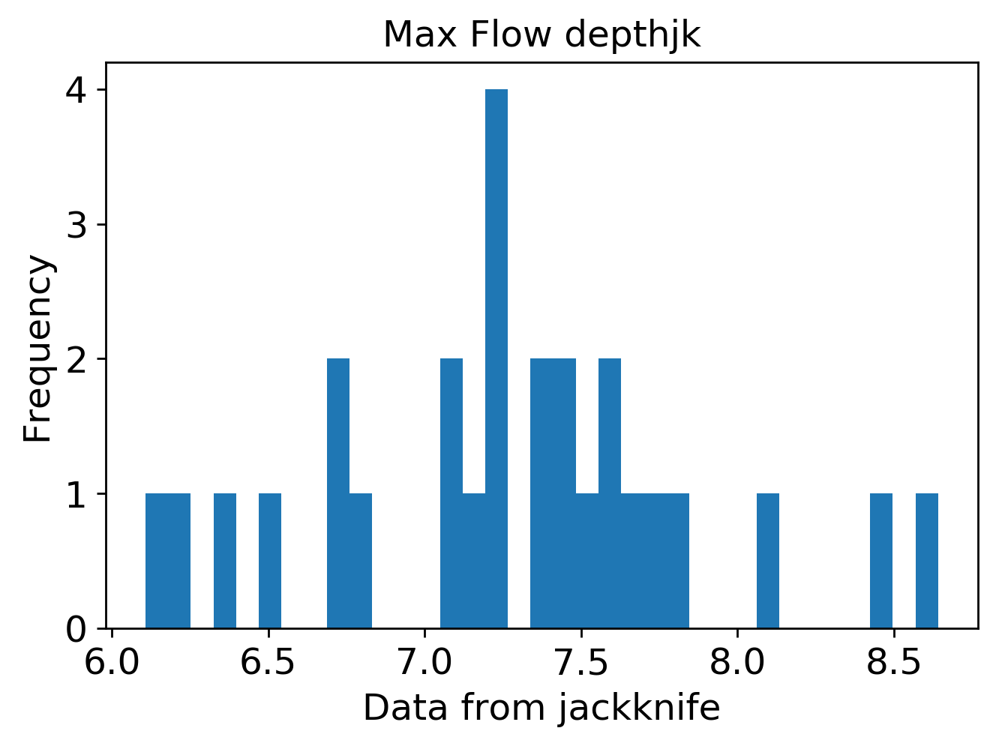

mean: 0.005810750321618962
jk_e: 0.00014831646840450592


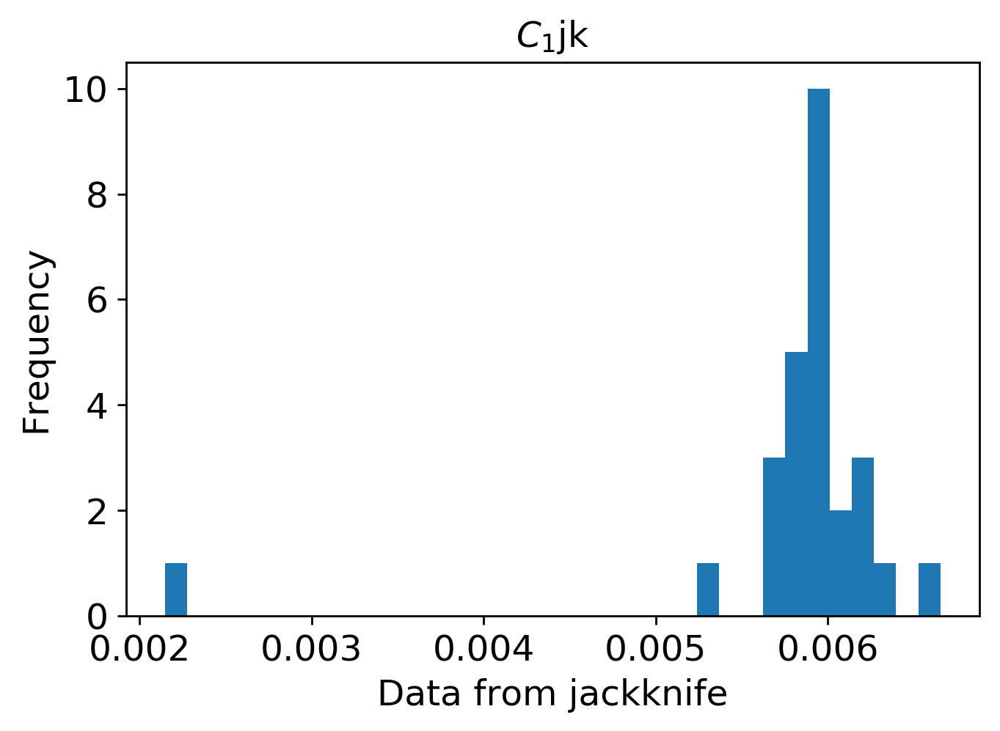

mean: 0.017736241310796746
jk_e: 0.00023447753279640123


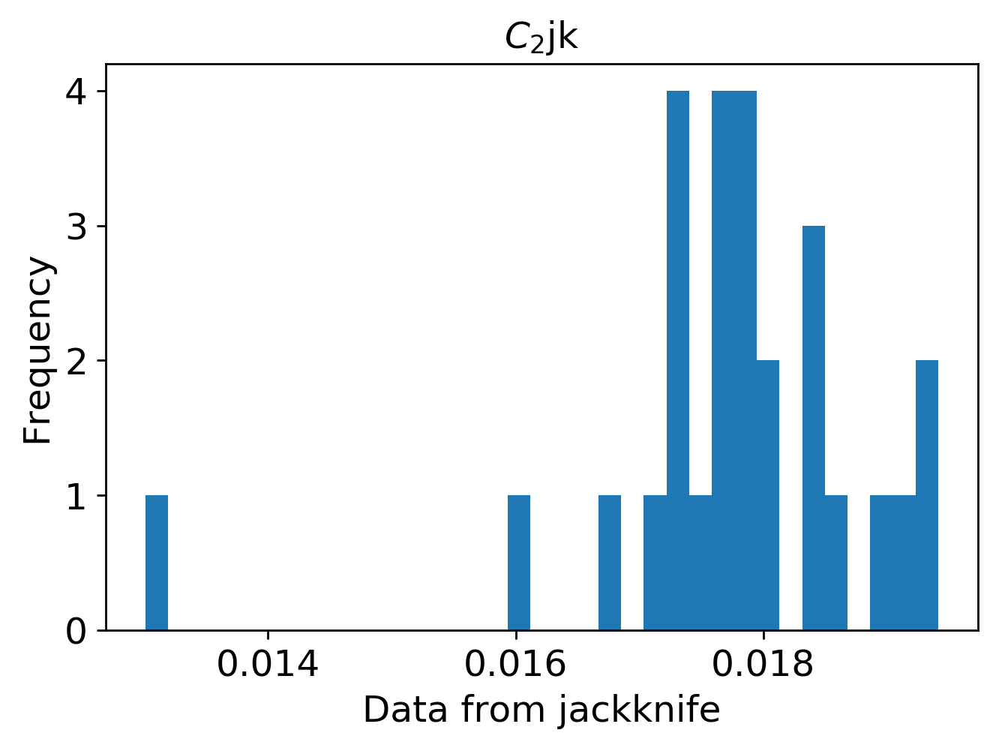

mean: 0.0144009260831237
jk_e: 0.000301046967123066


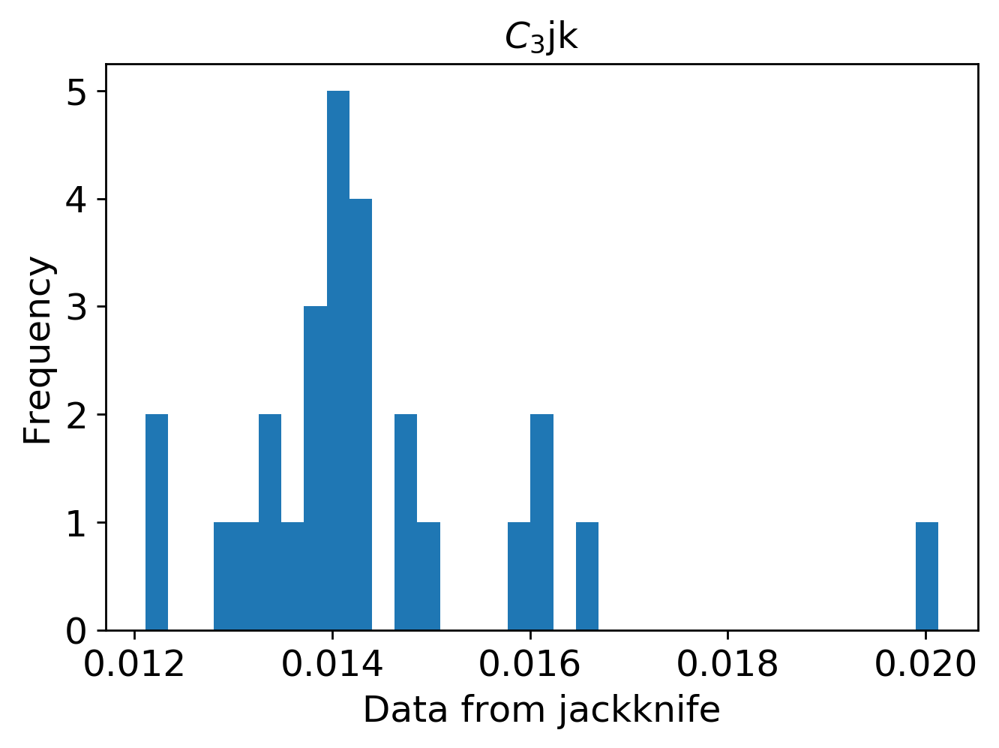

mean: 0.0013278588464693858
jk_e: 3.582006552322924e-05


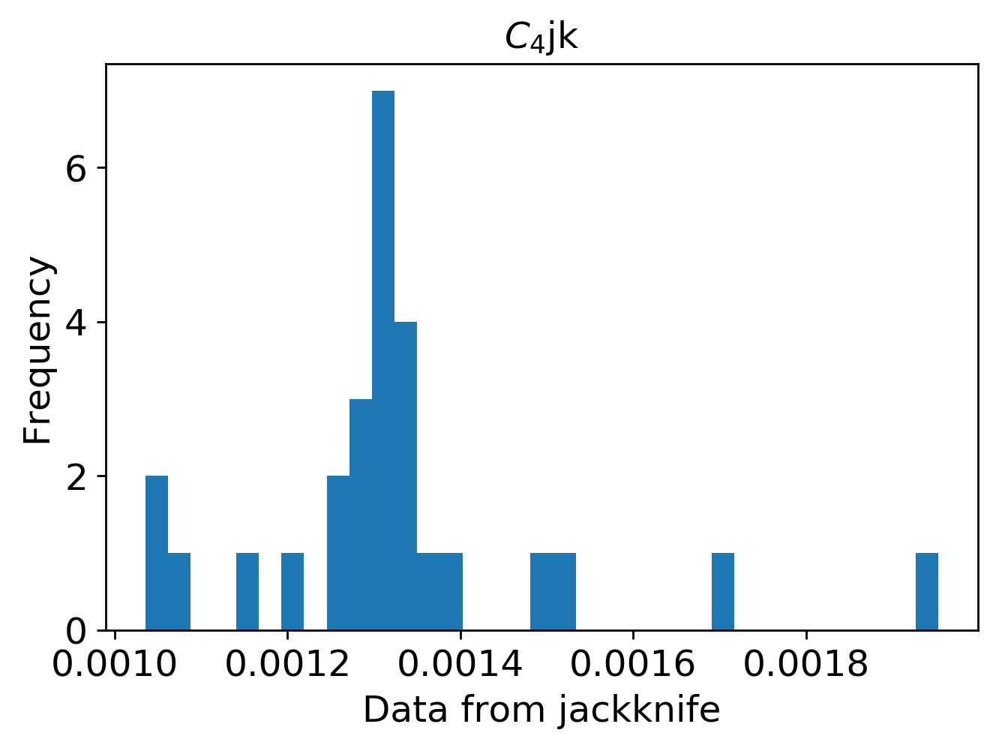

mean: 0.00011762382285898522
jk_e: 1.1311998861255512e-05


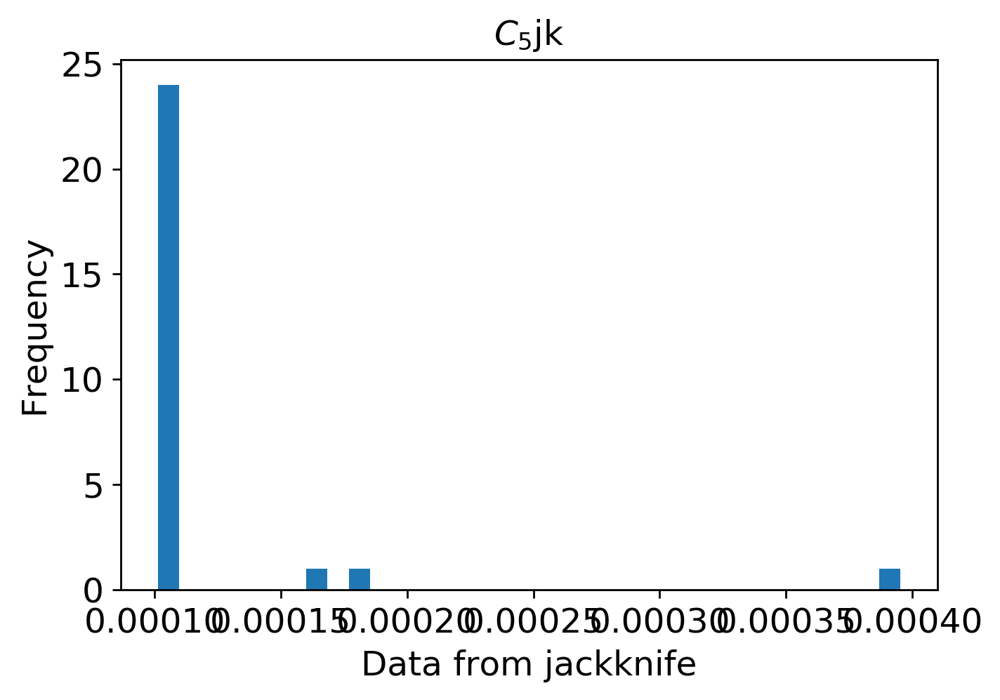

mean: 0.00012990398897306396
jk_e: 1.3266815633603688e-05


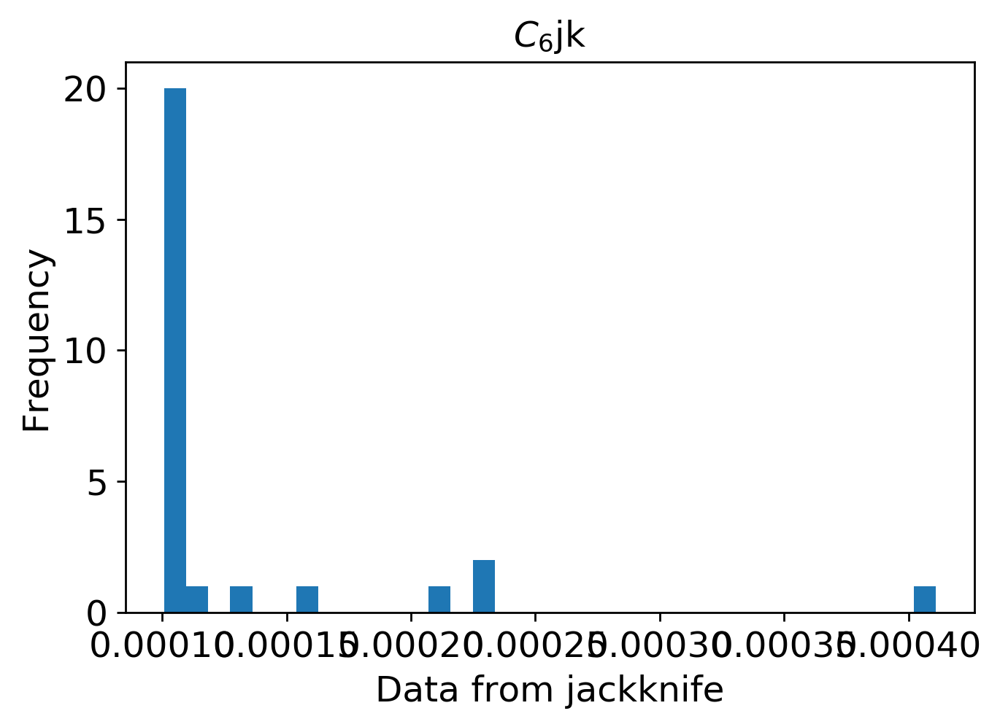

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2900/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2900/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi2900.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi2900.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi2900.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()
